In [3]:
%pip install fitter
%pip install matplotlib
%pip install networkx
%pip install numpy
%pip install openpyxl
%pip install pandas
%pip install plotly
%pip install pyvis
%pip install requests
%pip install seaborn
%pip install scipy


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.

[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: pip install --upgr

In [4]:
import random
import requests
import json 
import math
import numpy as np 
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import time
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from pyvis.network import Network
from fitter import Fitter, get_common_distributions, get_distributions

# Regions

Full Data

NOT recommended, consumes TOO MUCH computation reading complete files ~17 minutes

In [5]:
# CAL  = pd.read_excel("/kaggle/input/regions/Region_CAL.xlsx")
# CAR  = pd.read_excel("/kaggle/input/regions/Region_CAR.xlsx")
# CENT = pd.read_excel("/kaggle/input/regions/Region_CENT.xlsx")
# FLA  = pd.read_excel("/kaggle/input/regions/Region_FLA.xlsx")
# MIDA = pd.read_excel("/kaggle/input/regions/Region_MIDA.xlsx")
# MIDW = pd.read_excel("/kaggle/input/regions/Region_MIDW.xlsx")
# NE   = pd.read_excel("/kaggle/input/regions/Region_NE.xlsx")
# NW   = pd.read_excel("/kaggle/input/regions/Region_NW.xlsx")
# NY   = pd.read_excel("/kaggle/input/regions/Region_NY.xlsx")
# SE   = pd.read_excel("/kaggle/input/regions/Region_SE.xlsx")
# SW   = pd.read_excel("/kaggle/input/regions/Region_SW.xlsx")
# TEN  = pd.read_excel("/kaggle/input/regions/Region_TEN.xlsx")
# TEX  = pd.read_excel("/kaggle/input/regions/Region_TEX.xlsx")
# US48 = pd.read_excel("/kaggle/input/regions/Region_US48.xlsx")

## Data Collection

2022 Data

In [6]:
file_path = "/Users/santiospina/Documents/REU 2023/Regions_22.xlsx"

In [7]:
# # Hourly

# CAL_H   = pd.read_excel(file_path, sheet_name = "CAL Hourly")
# CAR_H   = pd.read_excel(file_path, sheet_name = "CAR Hourly")
# CENT_H  = pd.read_excel(file_path, sheet_name = "CENT Hourly")
# FLA_H   = pd.read_excel(file_path, sheet_name = "FLA Hourly")
# MIDA_H  = pd.read_excel(file_path, sheet_name = "MIDA Hourly")
# MIDW_H  = pd.read_excel(file_path, sheet_name = "MIDW Hourly")
# NE_H    = pd.read_excel(file_path, sheet_name = "NE Hourly")
# NW_H    = pd.read_excel(file_path, sheet_name = "NW Hourly")
# NY_H    = pd.read_excel(file_path, sheet_name = "NY Hourly")
# SE_H    = pd.read_excel(file_path, sheet_name = "SE Hourly")
# SW_H    = pd.read_excel(file_path, sheet_name = "SW Hourly")
# TEN_H   = pd.read_excel(file_path, sheet_name = "TEN Hourly")
# TEX_H   = pd.read_excel(file_path, sheet_name = "TEX Hourly")

In [8]:
# # Daily

# CAL_D   = pd.read_excel(file_path, sheet_name = "CAL Daily")
# CAR_D   = pd.read_excel(file_path, sheet_name = "CAR Daily")
# CENT_D  = pd.read_excel(file_path, sheet_name = "CENT Daily")
# FLA_D   = pd.read_excel(file_path, sheet_name = "FLA Daily")
# MIDA_D  = pd.read_excel(file_path, sheet_name = "MIDA Daily")
# MIDW_D  = pd.read_excel(file_path, sheet_name = "MIDW Daily")
# NE_D    = pd.read_excel(file_path, sheet_name = "NE Daily")
# NW_D    = pd.read_excel(file_path, sheet_name = "NW Daily")
# NY_D    = pd.read_excel(file_path, sheet_name = "NY Daily")
# SE_D    = pd.read_excel(file_path, sheet_name = "SE Daily")
# SW_D    = pd.read_excel(file_path, sheet_name = "SW Daily")
# TEN_D   = pd.read_excel(file_path, sheet_name = "TEN Daily")
# TEX_D   = pd.read_excel(file_path, sheet_name = "TEX Daily")

With this method I got a time reduction from ~15 mins of compilation to just ~6.33 seconds

In [9]:
class DailyDataFrames:
    def __init__(self, file_path):
        self.data_frames = {}
        self.file_path = file_path
        self.sheet_names = [
            "CAL Daily", "CAR Daily", "CENT Daily", "FLA Daily", "MIDA Daily",
            "MIDW Daily", "NE Daily", "NW Daily", "NY Daily", "SE Daily",
            "SW Daily", "TEN Daily", "TEX Daily"
        ]
        
        self.load_data_frames()

    def load_data_frames(self):
        for sheet_name in self.sheet_names:
            self.data_frames[sheet_name] = pd.read_excel(self.file_path, sheet_name=sheet_name)
            
class HourlyDataFrames:
    def __init__(self, file_path):
        self.data_frames = {}
        self.file_path = file_path
        self.sheet_names = [
            "CAL Hourly", "CAR Hourly", "CENT Hourly", "FLA Hourly", "MIDA Hourly",
            "MIDW Hourly", "NE Hourly", "NW Hourly", "NY Hourly", "SE Hourly",
            "SW Hourly", "TEN Hourly", "TEX Hourly"
        ]
        
        self.load_data_frames()

    def load_data_frames(self):
        for sheet_name in self.sheet_names:
            self.data_frames[sheet_name] = pd.read_excel(self.file_path, sheet_name=sheet_name)
            
daily_data = DailyDataFrames(file_path)

# Accessing the data frames

CAL_D  = daily_data.data_frames["CAL Daily"]
CAR_D  = daily_data.data_frames["CAR Daily"]
CENT_D = daily_data.data_frames["CENT Daily"]
FLA_D  = daily_data.data_frames["FLA Daily"]
MIDA_D = daily_data.data_frames["MIDA Daily"]
MIDW_D = daily_data.data_frames["MIDW Daily"]
NE_D   = daily_data.data_frames["NE Daily"]
NW_D   = daily_data.data_frames["NW Daily"]
NY_D   = daily_data.data_frames["NY Daily"]
SE_D   = daily_data.data_frames["SE Daily"]
SW_D   = daily_data.data_frames["SW Daily"]
TEN_D  = daily_data.data_frames["TEN Daily"]
TEX_D  = daily_data.data_frames["TEX Daily"]

In [10]:
region_dfs = [CAL_D, CAR_D, CENT_D, FLA_D, MIDA_D, MIDW_D, NE_D, NW_D, NY_D, SE_D, SW_D, TEN_D, TEX_D]

for df in region_dfs:
    df.rename(columns={"Region": "From"}, inplace=True)
    df.set_index('From', inplace=True)

### Aggregating through 4 seasons 


* **Winter** (December - February) *(2022-12-01:2022-12-31 & 2022-01-01:2022-02-28)*

* **Spring** (March - May) *(2022-03-01:2022-05-31)*

* **Summer** (June - August) *(2022-06-01:2022-08-31)*

* **Fall** (September - November) *(2022-09-01:2022-11-31)*

## Function Definition

In [11]:
# --------------------------------------------------------------------------------------------------------------------------

def winter_total_generation(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range1_start = pd.to_datetime('2022-12-01')
    range1_end = pd.to_datetime('2022-12-31')

    range2_start = pd.to_datetime('2022-01-01')
    range2_end = pd.to_datetime('2022-02-28')

    winter_df = df[
        ((df['Local date'] >= range1_start) & (df['Local date'] <= range1_end)) |
        ((df['Local date'] >= range2_start) & (df['Local date'] <= range2_end))
    ]
    
    winter_NG = winter_df['Sum (NG)'].sum()
    
    return winter_NG

def spring_total_generation(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-03-01')
    range_end = pd.to_datetime('2022-05-31')

    spring_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    spring_NG = spring_df['Sum (NG)'].sum()
    
    return spring_NG

def summer_total_generation(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-06-01')
    range_end = pd.to_datetime('2022-08-31')

    summer_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    summer_NG = summer_df['Sum (NG)'].sum()
    
    return summer_NG

def fall_total_generation(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-09-01')
    range_end = pd.to_datetime('2022-11-30')

    fall_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    fall_NG = fall_df['Sum (NG)'].sum()
    
    return fall_NG


# ----------------------------------------------------------------------------------------------------------------------

def winter_total_demand(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range1_start = pd.to_datetime('2022-12-01')
    range1_end = pd.to_datetime('2022-12-31')

    range2_start = pd.to_datetime('2022-01-01')
    range2_end = pd.to_datetime('2022-02-28')

    winter_df = df[
        ((df['Local date'] >= range1_start) & (df['Local date'] <= range1_end)) |
        ((df['Local date'] >= range2_start) & (df['Local date'] <= range2_end))
    ]
    
    winter_demand = winter_df['D'].sum()
    
    return winter_demand

def spring_total_demand(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-03-01')
    range_end = pd.to_datetime('2022-05-31')

    spring_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    spring_demand = spring_df['D'].sum()
    
    return spring_demand

def summer_total_demand(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-06-01')
    range_end = pd.to_datetime('2022-08-31')

    summer_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    summer_demand = summer_df['D'].sum()
    
    return summer_demand

def fall_total_demand(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-09-01')
    range_end = pd.to_datetime('2022-11-30')

    fall_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    fall_demand = fall_df['D'].sum()
    
    return fall_demand


# ----------------------------------------------------------------------------------------------------------------------

def winter_consumed_electricity(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range1_start = pd.to_datetime('2022-12-01')
    range1_end = pd.to_datetime('2022-12-31')

    range2_start = pd.to_datetime('2022-01-01')
    range2_end = pd.to_datetime('2022-02-28')

    winter_df = df[
        ((df['Local date'] >= range1_start) & (df['Local date'] <= range1_end)) |
        ((df['Local date'] >= range2_start) & (df['Local date'] <= range2_end))
    ]
    
    winter_consumption = winter_df['Consumed Electricity'].sum()
    
    return winter_consumption

def spring_consumed_electricity(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-03-01')
    range_end = pd.to_datetime('2022-05-31')

    spring_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    spring_consumption = spring_df['Consumed Electricity'].sum()
    
    return spring_consumption

def summer_consumed_electricity(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-06-01')
    range_end = pd.to_datetime('2022-08-31')

    summer_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    summer_consumption = summer_df['Consumed Electricity'].sum()
    
    return summer_consumption

def fall_consumed_electricity(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-09-01')
    range_end = pd.to_datetime('2022-11-30')

    fall_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    fall_consumption = fall_df['Consumed Electricity'].sum()
    
    return fall_consumption

# ----------------------------------------------------------------------------------------------------------------------

def winter_rows(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range1_start = pd.to_datetime('2022-12-01')
    range1_end = pd.to_datetime('2022-12-31')

    range2_start = pd.to_datetime('2022-01-01')
    range2_end = pd.to_datetime('2022-02-28')

    winter_df = df[
        ((df['Local date'] >= range1_start) & (df['Local date'] <= range1_end)) |
        ((df['Local date'] >= range2_start) & (df['Local date'] <= range2_end))]
    
    return winter_df

def spring_rows(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-03-01')
    range_end = pd.to_datetime('2022-05-31')

    spring_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))]
    
    return spring_df

def summer_rows(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-06-01')
    range_end = pd.to_datetime('2022-08-31')

    summer_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))]
    
    return summer_df

def fall_rows(df):
    
    df['Local date'] = pd.to_datetime(df['Local date'])

    range_start = pd.to_datetime('2022-09-01')
    range_end = pd.to_datetime('2022-11-30')

    fall_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    return fall_df

In [12]:
daily_IDs = [CAL_D, CAR_D, CENT_D, FLA_D, MIDA_D, MIDW_D, NE_D, NW_D, NY_D, SE_D, SW_D, TEN_D, TEX_D]

winterConsumedElectricity = []
springConsumedElectricity = []
summerConsumedElectricity = []
fallConsumedElectricity   = []

winterTotalGenerations = []
springTotalGenerations = []
summerTotalGenerations = []
fallTotalGenerations   = []

winterTotalDemands = []
springTotalDemands = []
summerTotalDemands = []
fallTotalDemands   = []

for df in daily_IDs:
    
    winter_NG = winter_total_generation(df)
    winterTotalGenerations.append(winter_NG)
    
    spring_NG = spring_total_generation(df)
    springTotalGenerations.append(spring_NG)
    
    summer_NG = summer_total_generation(df)
    summerTotalGenerations.append(summer_NG)
    
    fall_NG = fall_total_generation(df)
    fallTotalGenerations.append(fall_NG)
    
    # --------------------------------------------------- 
    
    winter_demand = winter_total_demand(df)
    winterTotalDemands.append(winter_demand)
    
    spring_demand = spring_total_demand(df)
    springTotalDemands.append(spring_demand)
    
    summer_demand = summer_total_demand(df)
    summerTotalDemands.append(summer_demand)
    
    fall_demand = fall_total_demand(df)
    fallTotalDemands.append(fall_demand)
    
    # --------------------------------------------------- 
    
    winter_consumption = winter_consumed_electricity(df)
    winterConsumedElectricity.append(winter_consumption)
    
    spring_consumption = spring_consumed_electricity(df)
    springConsumedElectricity.append(spring_consumption)
    
    summer_consumption = summer_consumed_electricity(df)
    summerConsumedElectricity.append(summer_consumption)
    
    fall_consumption = fall_consumed_electricity(df)
    fallConsumedElectricity.append(fall_consumption)

In [13]:
winter_DF = pd.DataFrame()
spring_DF = pd.DataFrame()
summer_DF = pd.DataFrame()
fall_DF = pd.DataFrame()

In [14]:
IDs = ["CAL","CAR","CENT","FLA","MIDA","MIDW","NE","NW","NY","SE","SW","TEN","TEX"]

winter_DF["From"] = IDs 
winter_DF["Total Generation"] = winterTotalGenerations
winter_DF["Total Demand"] = winterTotalDemands 
winter_DF["Consumed Electricity"] = winterConsumedElectricity
winter_DF.set_index("From", inplace=True)

spring_DF["From"] = IDs 
spring_DF["Total Generation"] = springTotalGenerations
spring_DF["Total Demand"] = springTotalDemands
spring_DF["Consumed Electricity"] = springConsumedElectricity
spring_DF.set_index("From", inplace=True)

summer_DF["From"] = IDs 
summer_DF["Total Generation"] = summerTotalGenerations
summer_DF["Total Demand"] = summerTotalDemands 
summer_DF["Consumed Electricity"] = summerConsumedElectricity
summer_DF.set_index("From", inplace=True)

fall_DF["From"] = IDs 
fall_DF["Total Generation"] = fallTotalGenerations
fall_DF["Total Demand"] = fallTotalDemands 
fall_DF["Consumed Electricity"] = fallConsumedElectricity
fall_DF.set_index("From", inplace=True)

In [15]:
winter_region_DF = winter_DF.copy()
spring_region_DF = spring_DF.copy()
summer_region_DF = summer_DF.copy()
fall_region_DF = fall_DF.copy()

## Electricity Flow

In [16]:
# df = df[['Local date','D', 'NG', "Positive Generation", "Consumed Electricity"] + IDs]

CAL_D = CAL_D[['Local date','D','NG'] + IDs].copy()
CAR_D = CAR_D[['Local date','D','NG'] + IDs].copy()
CENT_D = CENT_D[['Local date','D','NG'] + IDs].copy()
FLA_D = FLA_D[['Local date','D','NG'] + IDs].copy()
MIDA_D = MIDA_D[['Local date','D','NG'] + IDs].copy()
MIDW_D = MIDW_D[['Local date','D','NG'] + IDs].copy()
NE_D = NE_D[['Local date','D','NG'] + IDs].copy()
NW_D = NW_D[['Local date','D','NG'] + IDs].copy()
NY_D = NY_D[['Local date','D','NG'] + IDs].copy()
SE_D = SE_D[['Local date','D','NG'] + IDs].copy()
SW_D = SW_D[['Local date','D','NG'] + IDs].copy()
TEN_D = TEN_D[['Local date','D','NG'] + IDs].copy()
TEX_D = TEX_D[['Local date','D','NG'] + IDs].copy()

In [17]:
IDs = [CAL_D, CAR_D, CENT_D, FLA_D, MIDA_D, MIDW_D, NE_D, NW_D, NY_D, SE_D, SW_D, TEN_D, TEX_D]

daily_winterDFs = []
daily_springDFs = []
daily_summerDFs = []
daily_fallDFs   = []

for df in IDs:
    
    daily_winter_df = winter_rows(df)
    daily_winterDFs.append(daily_winter_df)
    
    daily_spring_df = spring_rows(df)
    daily_springDFs.append(daily_spring_df)
    
    daily_summer_df = summer_rows(df)
    daily_summerDFs.append(daily_summer_df)
    
    daily_fall_df = fall_rows(df)
    daily_fallDFs.append(daily_fall_df)

In [18]:
for i in range(len(daily_winterDFs)):
    daily_winterDFs[i] = daily_winterDFs[i].fillna(0)  #NaN -> 0
    num = daily_winterDFs[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    daily_springDFs[i] = daily_springDFs[i].fillna(0)  #NaN -> 0
    num = daily_springDFs[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    daily_summerDFs[i] = daily_summerDFs[i].fillna(0)  #NaN -> 0
    num = daily_summerDFs[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    daily_fallDFs[i] = daily_fallDFs[i].fillna(0)      #NaN -> 0
    num = daily_fallDFs[i]._get_numeric_data()   #Negative flows -> 0
    num[num < 0] = 0

In [19]:
daily_winter2022 = pd.concat(daily_winterDFs[:13])
daily_spring2022 = pd.concat(daily_springDFs[:13])
daily_summer2022 = pd.concat(daily_summerDFs[:13])
daily_fall2022 = pd.concat(daily_fallDFs[:13])

In [20]:
IDs = [CAL_D, CAR_D, CENT_D, FLA_D, MIDA_D, MIDW_D, NE_D, NW_D, NY_D, SE_D, SW_D, TEN_D, TEX_D]

winterDFs = []
springDFs = []
summerDFs = []
fallDFs   = []

for df in IDs:
    
    winter_df = winter_rows(df)
    winterDFs.append(winter_df)
    
    spring_df = spring_rows(df)
    springDFs.append(spring_df)
    
    summer_df = summer_rows(df)
    summerDFs.append(summer_df)
    
    fall_df = fall_rows(df)
    fallDFs.append(fall_df)

for i in range(len(winterDFs)):
    winterDFs[i] = winterDFs[i].fillna(0)  #NaN -> 0
    num = winterDFs[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    springDFs[i] = springDFs[i].fillna(0)  #NaN -> 0
    num = springDFs[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    summerDFs[i] = summerDFs[i].fillna(0)  #NaN -> 0
    num = summerDFs[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    fallDFs[i] = fallDFs[i].fillna(0)      #NaN -> 0
    num = fallDFs[i]._get_numeric_data()   #Negative flows -> 0
    num[num < 0] = 0

## Distribution Checking

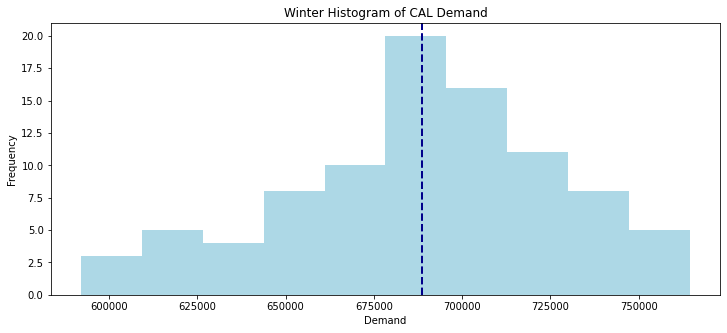

In [21]:
data = winterDFs[0]['D']

plt.figure(figsize=(12, 5))
plt.hist(data, bins=10, color='lightblue') 
plt.xlabel('Demand')
plt.ylabel('Frequency')
plt.title(f'Winter Histogram of {winterDFs[0].index[0]} Demand')

# Vertical line -> Mean
plt.axvline(np.mean(data), color='darkblue', linestyle='--', linewidth=2)

plt.show()

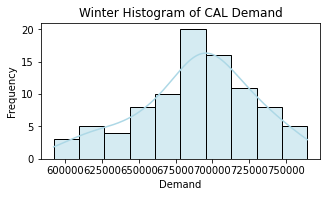

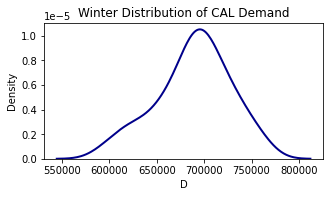

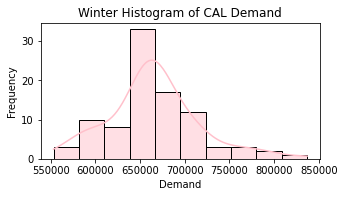

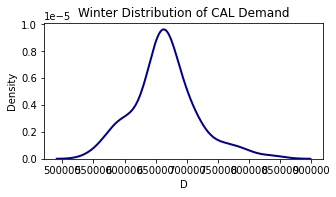

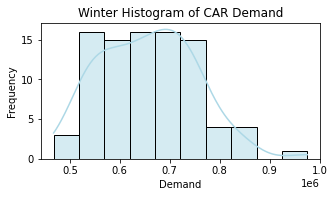

...

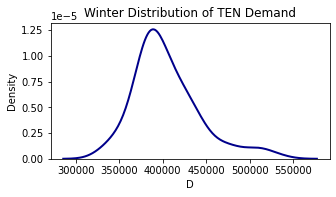

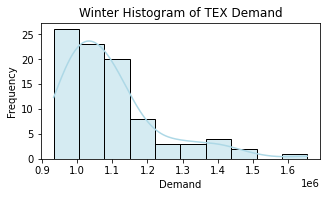

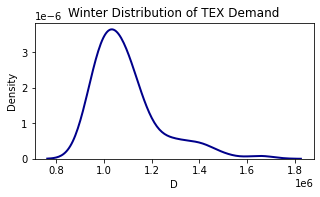

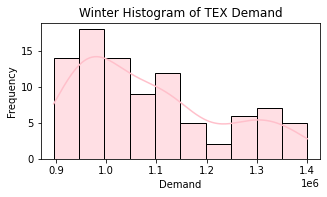

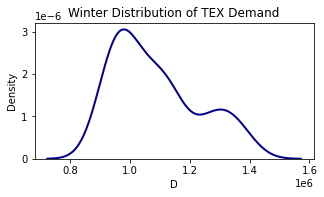

In [22]:
for i in range(len(winterDFs)):
    data = winterDFs[i]['D']

    # plt.figure(figsize=(12, 5))
    
    plt.figure(figsize=(5, 2.5))
    sns.histplot(data, bins=10, kde=True, color='lightblue')  
    plt.xlabel('Demand')
    plt.ylabel('Frequency')
    plt.title(f'Winter Histogram of {winterDFs[i].index[0]} Demand')
    plt.show()

    plt.figure(figsize=(5, 2.5))
    kde = sns.kdeplot(data, color='darkblue', linewidth=2)
    plt.title(f'Winter Distribution of {winterDFs[i].index[0]} Demand')
    plt.show()
    
    data = springDFs[i]['D']
    
    plt.figure(figsize=(5, 2.5))
    sns.histplot(data, bins=10, kde=True, color='pink') 
    plt.xlabel('Demand')
    plt.ylabel('Frequency')
    plt.title(f'Winter Histogram of {winterDFs[i].index[0]} Demand')
    plt.show()

    plt.figure(figsize=(5, 2.5))
    kde = sns.kdeplot(data, color='darkblue', linewidth=2)
    plt.title(f'Winter Distribution of {winterDFs[i].index[0]} Demand')
    plt.show()

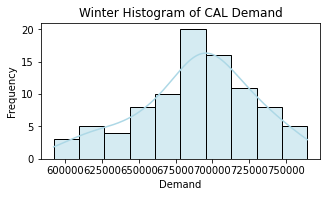

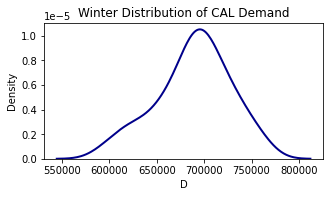

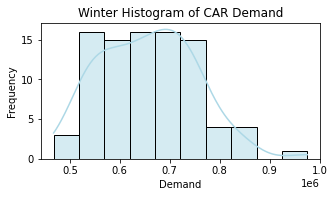

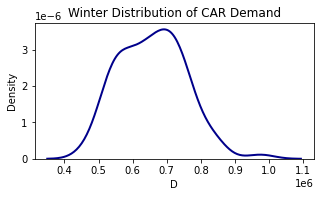

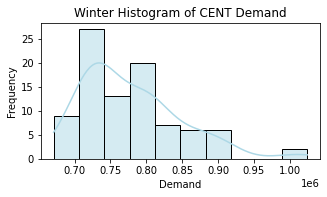

...

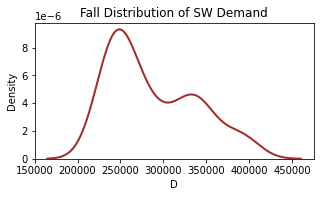

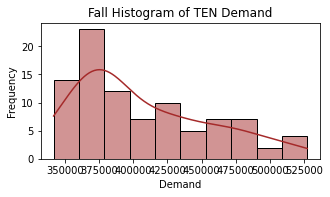

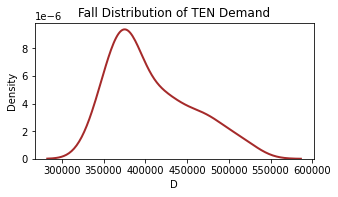

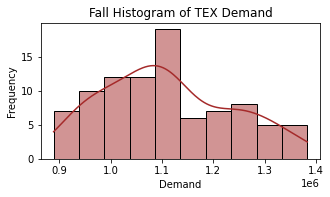

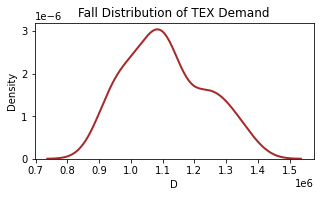

In [23]:
seasons = ['Winter','Spring','Summer','Fall']
DFs = [winterDFs, springDFs, summerDFs, fallDFs]
hist_color = ['lightblue', 'pink', 'orange','brown']
dist_color = ['darkblue','magenta','darkorange','brown']
    
i=0
    
for season in seasons:
    for j in range(len(winterDFs)):
        data = DFs[i][j]['D']

        plt.figure(figsize=(5, 2.5))
        sns.histplot(data, bins=10, kde=True, color=hist_color[i])  
        plt.xlabel('Demand')
        plt.ylabel('Frequency')
        plt.title(f'{season} Histogram of {DFs[i][j].index[0]} Demand')
        plt.title(f'{season} Histogram of {DFs[i][j].index[0]} Demand')
        plt.show()

        plt.figure(figsize=(5, 2.5))
        kde = sns.kdeplot(data, color=dist_color[i], linewidth=2)
        plt.title(f'{season} Distribution of {DFs[i][j].index[0]} Demand')
        plt.show()
    i += 1

    

In [24]:
def region_ID_name(region):
    regions = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]

    if region == 'CAL':
        region_name = 'California'
    elif region == 'CAR':
        region_name = 'Carolinas'
    elif region == 'CENT':
        region_name = 'Central'
    elif region == 'FLA':
        region_name = 'Florida'
    elif region == 'MIDA':
        region_name = 'Mid-Atlantic'
    elif region == 'MIDW':
        region_name = 'Midwest'
    elif region == 'NE':
        region_name = 'New England'
    elif region == 'NW':
        region_name = 'Northwest'
    elif region == 'NY':
        region_name = 'New York'
    elif region == 'SE':
        region_name = 'Southeast'
    elif region == 'SW':
        region_name = 'Southwest'
    elif region == 'TEN':
        region_name = 'Tennessee'
    elif region == 'TEX':
        region_name = 'Texas'
            
    return region_name

def df_ID_name(dfs,i):
        
    if dfs[i].index[0] == 'CAL':
        region_name = 'California'
    elif dfs[i].index[0] == 'CAR':
        region_name = 'Carolinas'
    elif dfs[i].index[0] == 'CENT':
        region_name = 'Central'
    elif dfs[i].index[0] == 'FLA':
        region_name = 'Florida'
    elif dfs[i].index[0] == 'MIDA':
        region_name = 'Mid-Atlantic'
    elif dfs[i].index[0] == 'MIDW':
        region_name = 'Midwest'
    elif dfs[i].index[0] == 'NE':
        region_name = 'New England'
    elif dfs[i].index[0] == 'NW':
        region_name = 'Northwest'
    elif dfs[i].index[0] == 'NY':
        region_name = 'New York'
    elif dfs[i].index[0] == 'SE':
        region_name = 'Southeast'
    elif dfs[i].index[0] == 'SW':
        region_name = 'Southwest'
    elif dfs[i].index[0] == 'TEN':
        region_name = 'Tennessee'
    elif dfs[i].index[0] == 'TEX':
        region_name = 'Texas'
            
    return region_name

In [62]:
def plot_season_hist(dfs, column, season):
    
    for i in range(len(dfs)):
        
        region_name = df_ID_name(dfs,i)
            
        if season == 'winter':
            color = 'lightblue'
        elif season == 'spring':
            color = 'pink'
        elif season == 'summer':
            color = 'orange'
        elif season == 'fall':
            color = 'brown'
        else:
            raise ValueError("Invalid season: " + season)

        data = dfs[i][column]

        if column == 'D':
            column_label = "Demand"
        elif column == 'NG':
            column_label = "Net Generation"
        else:
            column_label = column

        plt.figure(figsize=(10, 3))
        sns.histplot(data, bins=10, kde=True, color=color)  
        plt.xlabel(column_label.capitalize())
        plt.ylabel('Frequency')
        plt.title(f'{season.capitalize()} Histogram of {region_name} {column_label} (2022)')
        
        plt.axvline(np.mean(data), color='red', linestyle='--', linewidth=2)
        plt.legend([f'Mean: {np.mean(data):.2f}'], labelcolor='red')

        plt.show()
    
def plot_season_dist(dfs, column, season):
    
    for i in range(len(dfs)):
        
        region_name = df_ID_name(dfs,i)
        
        if season.lower() == 'winter':
            color = 'darkblue'
        elif season.lower() == 'spring':
            color = 'magenta'
        elif season.lower() == 'summer':
            color = 'darkorange'
        elif season.lower() == 'fall':
            color = 'brown'
        else:
            raise ValueError("Invalid season: " + season)
            
        data = dfs[i][column]

        if column == 'D':
            column_label = "Demand"
        elif column == 'NG':
            column_label = "Net Generation"
        else:
            column_label = column
        
        plt.figure(figsize=(10, 3))
        kde = sns.kdeplot(data, color=color, linewidth=2)
        plt.xlabel(column_label.capitalize())
        plt.title(f'{season.capitalize()} Distribution of {region_name} {column_label} (2022)')
        plt.show()
        
def plot_region_dist(region, column):
    regions = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]
    i = 0
    for ID in regions:
        if ID == region:
            num = i
        i += 1
        
    region_name = region_ID_name(region)

    if column == 'D':
        column_label = "Demand"
    elif column == 'NG':
        column_label = "Net Generation"
    else:
        column_label = column

    data_winter = winterDFs[num][column]
    data_spring = springDFs[num][column]
    data_summer = summerDFs[num][column]
    data_fall = fallDFs[num][column]

    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 6))
    plt.subplots_adjust(hspace=0.5)

    # Plot seasonal distributions
    
    kde = sns.kdeplot(data_winter, color='darkblue', linewidth=2, ax=axs[0, 0])
    axs[0, 0].set_title(f'Winter Distribution of {region_name} {column_label} (2022)')
    axs[0, 0].set_xlabel(f'{column_label}')

    kde = sns.kdeplot(data_spring, color='violet', linewidth=2, ax=axs[0, 1])
    axs[0, 1].set_title(f'Spring Distribution of {region_name} {column_label} (2022)')
    axs[0, 1].set_xlabel(f'{column_label}')

    kde = sns.kdeplot(data_summer, color='darkorange', linewidth=2, ax=axs[1, 0])
    axs[1, 0].set_title(f'Summer Distribution of {region_name} {column_label} (2022)')
    axs[1, 0].set_xlabel(f'{column_label}')

    kde = sns.kdeplot(data_fall, color='brown', linewidth=2, ax=axs[1, 1])
    axs[1, 1].set_title(f'Fall Distribution of {region_name} {column_label} (2022)')
    axs[1, 1].set_xlabel(f'{column_label}')

    plt.tight_layout()
    plt.show()

    # Plot combined distribution
    
    plt.figure(figsize=(9.8, 4))
    
    sns.kdeplot(data_winter, color='darkblue', linewidth=2, label='Winter')
    sns.kdeplot(data_spring, color='violet', linewidth=2, label='Spring')
    sns.kdeplot(data_summer, color='darkorange', linewidth=2, label='Summer')
    sns.kdeplot(data_fall, color='brown', linewidth=2, label='Fall')
    
    plt.title(f'Distribution of {region_name} {column_label} by Season (2022)')
    plt.xlabel(column_label.capitalize())
    plt.ylabel('Density')
    plt.legend()

    plt.tight_layout()
    plt.show()
    
def plot_region_hist(region, column):
    regions = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]
    i = 0
    for ID in regions:
        if ID == region:
            num = i
        i += 1

    region_name = region_ID_name(region)

    if column == 'D':
        column_label = "Demand"
    elif column == 'NG':
        column_label = "Net Generation"
    else:
        column_label = column

    data_winter = winterDFs[num][column]
    data_spring = springDFs[num][column]
    data_summer = summerDFs[num][column]
    data_fall = fallDFs[num][column]

    if column == 'D':
        column_label = "Demand"
    elif column == 'NG':
        column_label = "Net Generation"
    else:
        column_label = column

    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 6))

    # Winter
    sns.histplot(data_winter, bins=10, kde=True, color='dodgerblue', ax=axs[0, 0])
    axs[0, 0].set_xlabel(column_label.capitalize())
    axs[0, 0].set_ylabel('Frequency')
    axs[0, 0].set_title(f'Winter Histogram of {region_name} {column_label} (2022)')
    axs[0, 0].axvline(np.mean(data_winter), color='red', linestyle='--', linewidth=2)
    axs[0, 0].legend([f'Mean: {np.mean(data_winter):.2f}'], labelcolor='red')

    # Spring
    sns.histplot(data_spring, bins=10, kde=True, color='pink', ax=axs[0, 1])
    axs[0, 1].set_xlabel(column_label.capitalize())
    axs[0, 1].set_ylabel('Frequency')
    axs[0, 1].set_title(f'Spring Histogram of {region_name} {column_label} (2022)')
    axs[0, 1].axvline(np.mean(data_spring), color='red', linestyle='--', linewidth=2)
    axs[0, 1].legend([f'Mean: {np.mean(data_spring):.2f}'], labelcolor='red')

    # Summer
    sns.histplot(data_summer, bins=10, kde=True, color='orange', ax=axs[1, 0])
    axs[1, 0].set_xlabel(column_label.capitalize())
    axs[1, 0].set_ylabel('Frequency')
    axs[1, 0].set_title(f'Summer Histogram of {region_name} {column_label} (2022)')
    axs[1, 0].axvline(np.mean(data_summer), color='red', linestyle='--', linewidth=2)
    axs[1, 0].legend([f'Mean: {np.mean(data_summer):.2f}'], labelcolor='red')

    # Fall
    sns.histplot(data_fall, bins=10, kde=True, color='brown', ax=axs[1, 1])
    axs[1, 1].set_xlabel(column_label.capitalize())
    axs[1, 1].set_ylabel('Frequency')
    axs[1, 1].set_title(f'Fall Histogram of {region_name} {column_label} (2022)')
    axs[1, 1].axvline(np.mean(data_fall), color='red', linestyle='--', linewidth=2)
    axs[1, 1].legend([f'Mean: {np.mean(data_fall):.2f}'], labelcolor='red')
    
    plt.tight_layout()
    plt.savefig(f"Plots/Multiple_Histograms/{column}_{region}_multiple_hist.png")
    plt.show()

    # Combined distribution
    
    plt.figure(figsize=(10, 6))
    
    sns.histplot(data_winter, bins=10, kde=False, color='dodgerblue', label='Winter')
    sns.histplot(data_spring, bins=10, kde=False, color='lavenderblush', label='Spring')
    sns.histplot(data_summer, bins=10, kde=False, color='lightyellow', label='Summer')
    sns.histplot(data_fall, bins=10, kde=False, color='burlywood', label='Fall')
    
    plt.title(f'Distribution of {region_name} {column_label} by Season (2022)')
    plt.xlabel(column_label.capitalize())
    plt.ylabel('Frequency')
    plt.legend()

    plt.tight_layout()
    plt.show()
    
def plot_combined_dist(region, column):
    regions = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]
    
    i = 0
    for ID in regions:
        if ID == region:
            num = i
        i += 1
    
    region_name = region_ID_name(region)

    if column == 'D':
        column_label = "Demand"
    elif column == 'NG':
        column_label = "Net Generation"
    else:
        column_label = column

    data_winter = winterDFs[num][column]
    data_spring = springDFs[num][column]
    data_summer = summerDFs[num][column]
    data_fall = fallDFs[num][column]

    # Plot combined distribution
    
    plt.figure(figsize=(9.8, 6))
    
    sns.kdeplot(data_winter, color='darkblue', linewidth=2, label='Winter')
    sns.kdeplot(data_spring, color='violet', linewidth=2, label='Spring')
    sns.kdeplot(data_summer, color='darkorange', linewidth=2, label='Summer')
    sns.kdeplot(data_fall, color='brown', linewidth=2, label='Fall')
    
    plt.title(f'Distribution of {region_name} {column_label} by Season (2022)')
    plt.xlabel(column_label.capitalize())
    plt.ylabel('Density')
    plt.legend()

    plt.tight_layout()
    plt.savefig(f"Plots/Combined_Distributions/{column}_{region}_combined_dist.png")
    plt.show()

In [56]:
def plot_combined_hist(region, column):    

    regions = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]
    i = 0
    for ID in regions:
        if ID == region:
            num = i
        i += 1

    region_name = region_ID_name(region)

    if column == 'D':
        column_label = "Demand"
    elif column == 'NG':
        column_label = "Net Generation"
    else:
        column_label = column

    data_winter = winterDFs[num][column]
    data_spring = springDFs[num][column]
    data_summer = summerDFs[num][column]
    data_fall = fallDFs[num][column]
    
    plt.figure(figsize=(10, 6))
    
    sns.histplot(data_winter, bins=10, kde=False, color='dodgerblue', label='Winter')
    sns.histplot(data_spring, bins=10, kde=False, color='lavenderblush', label='Spring')
    sns.histplot(data_summer, bins=10, kde=False, color='lightyellow', label='Summer')
    sns.histplot(data_fall, bins=10, kde=False, color='burlywood', label='Fall')
    
    plt.title(f'Distribution of {region_name} {column_label} by Season (2022)')
    plt.xlabel(column_label.capitalize())
    plt.ylabel('Frequency')
    plt.legend()

    plt.tight_layout()

    plt.savefig(f"Plots/Combined_Histograms/{column}_{region}_combined_hist.png")
    plt.show()

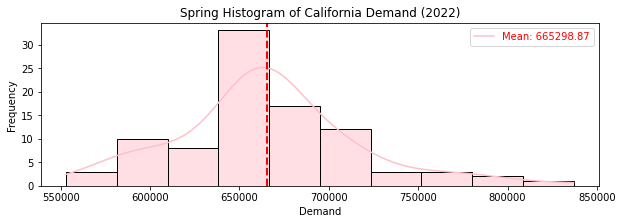

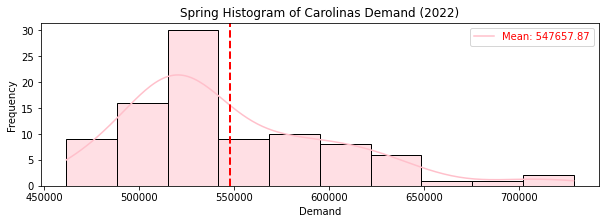

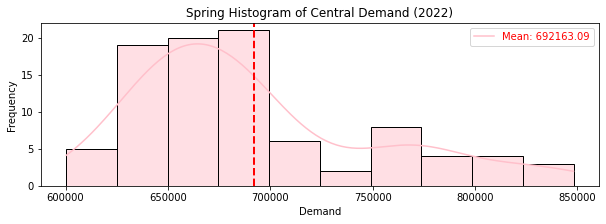

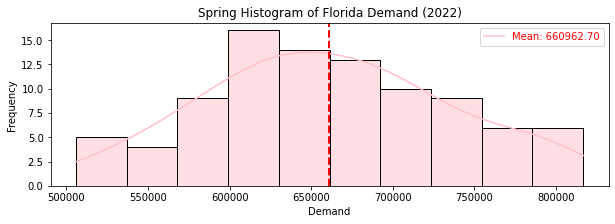

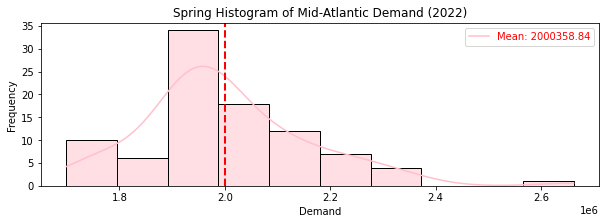

...

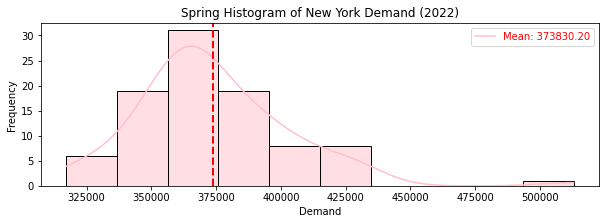

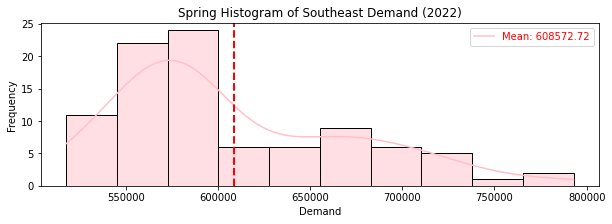

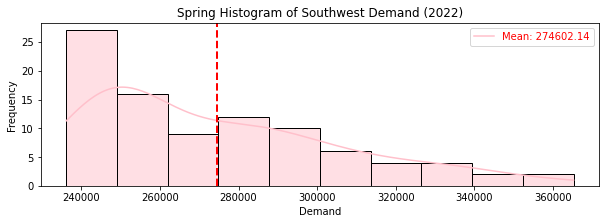

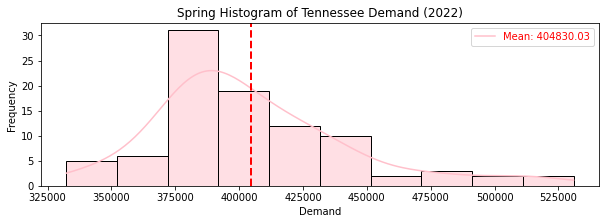

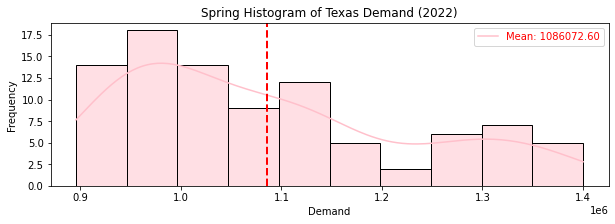

In [26]:
# plot_season_hist(seasonDFs, 'D' if Demand /'NG' if Net Generation,'season')
plot_season_hist(springDFs, 'D','spring')

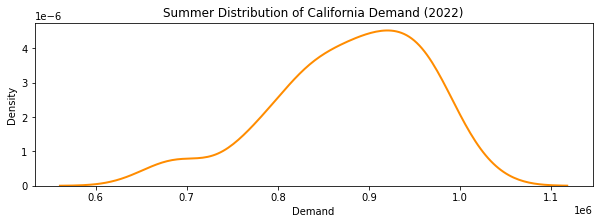

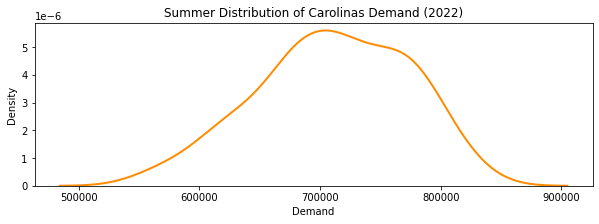

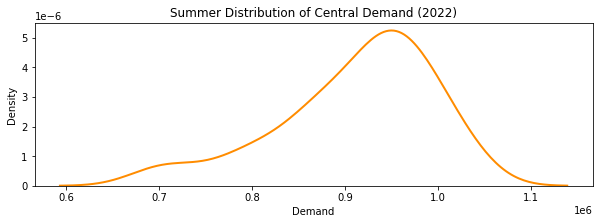

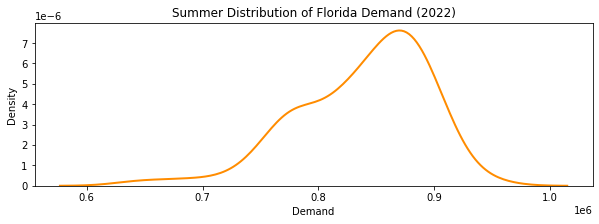

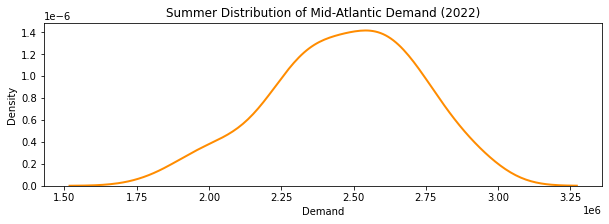

...

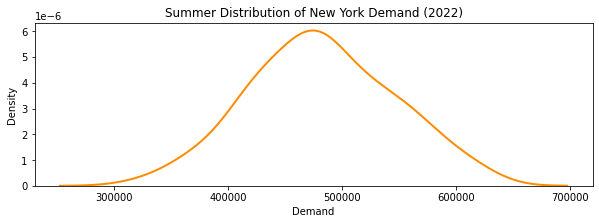

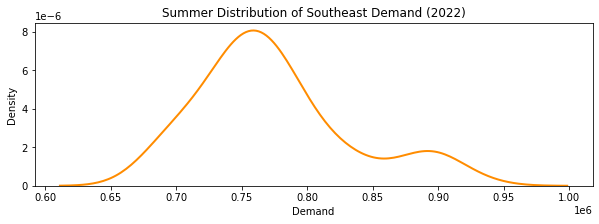

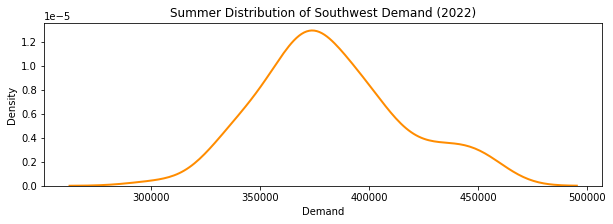

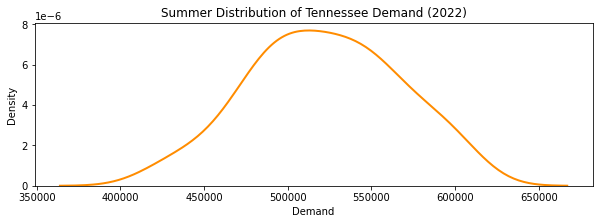

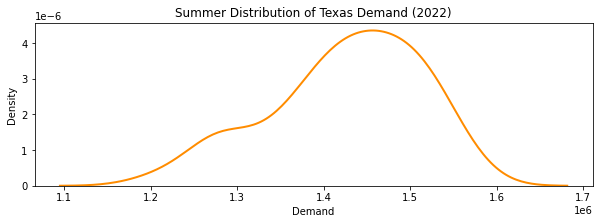

In [27]:
# plot_season_dist(seasonDFs, 'D' if Demand /'NG' if Net Generation,'season')
plot_season_dist(summerDFs, 'D','summer')

In [50]:
IDs = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]

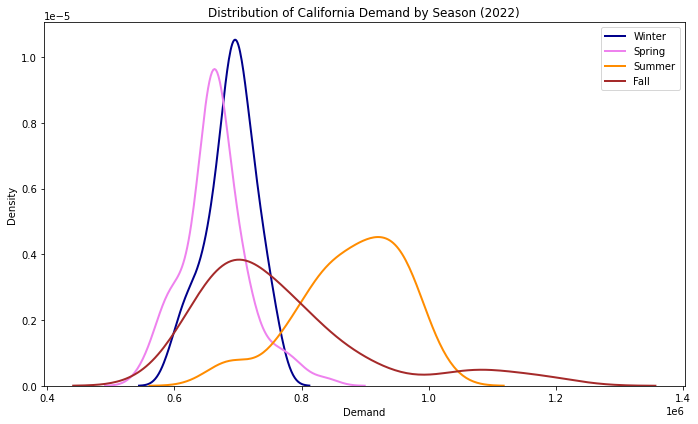

In [39]:
plot_combined_dist('CAL', 'D')

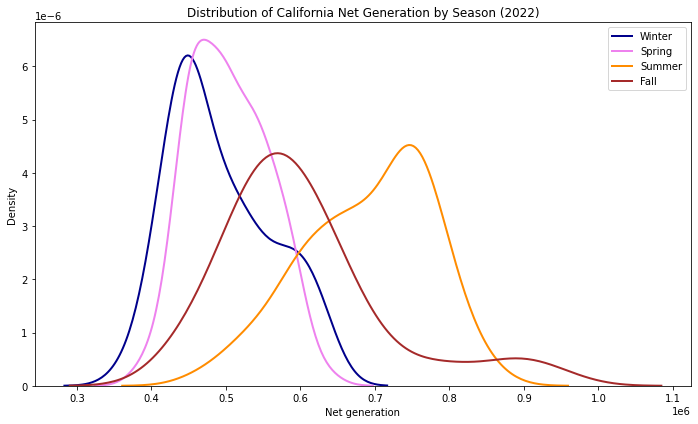

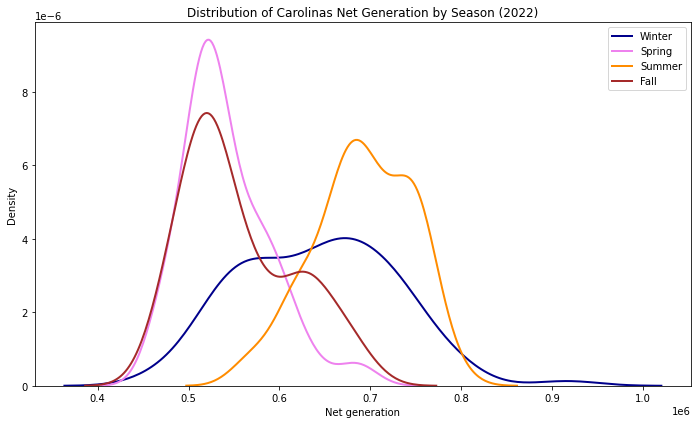

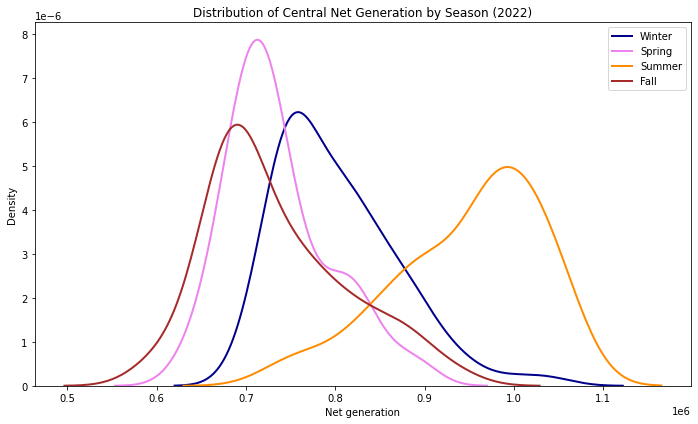

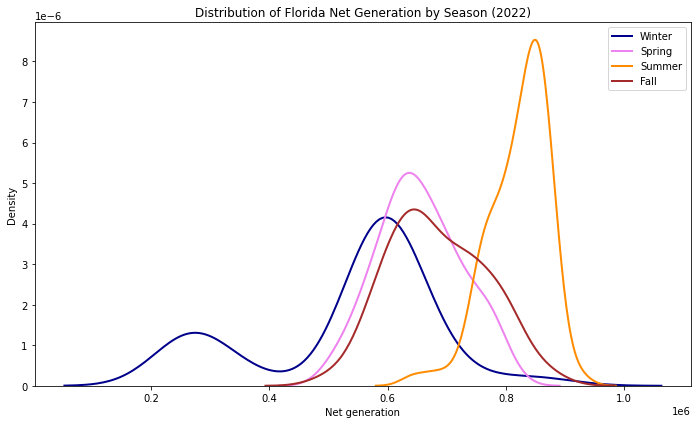

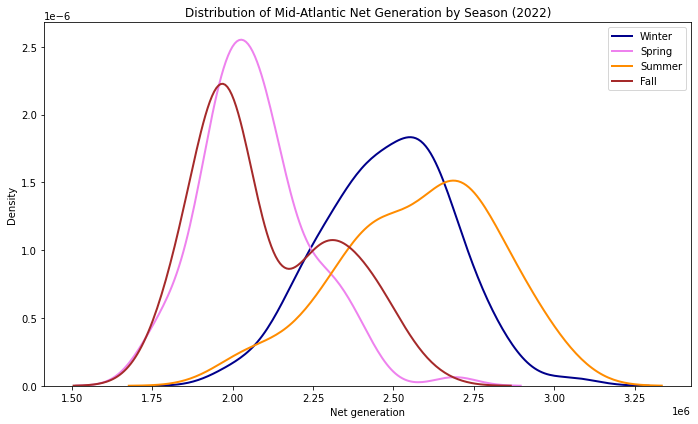

...

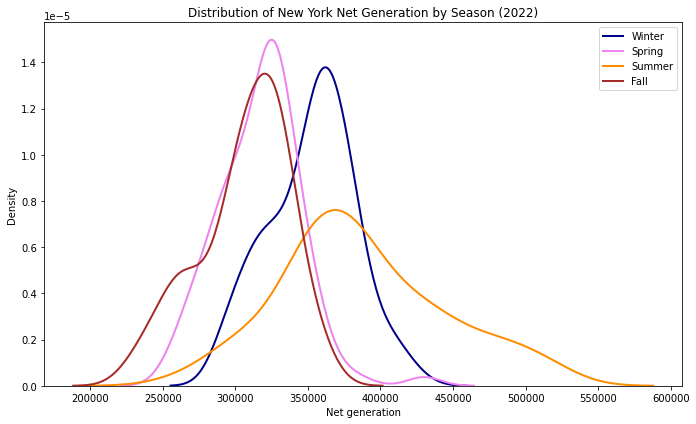

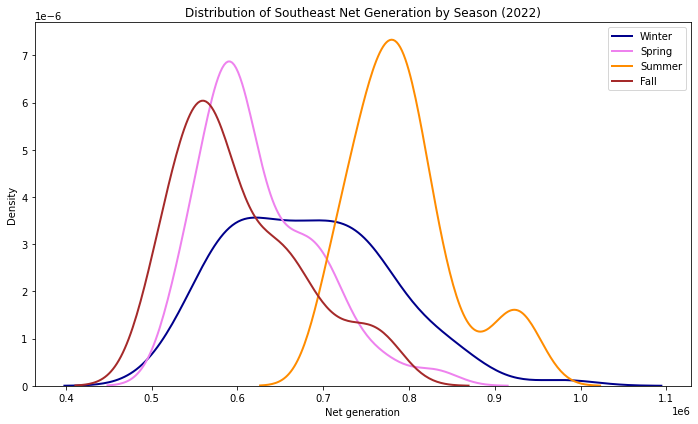

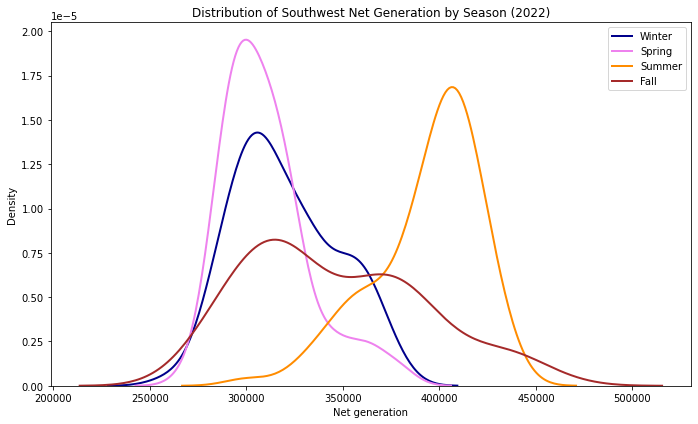

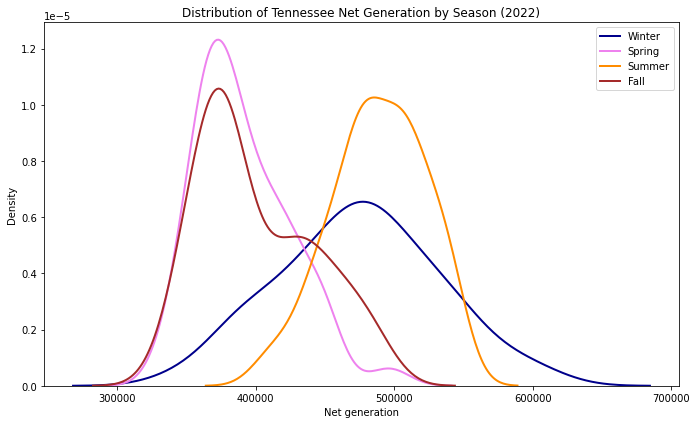

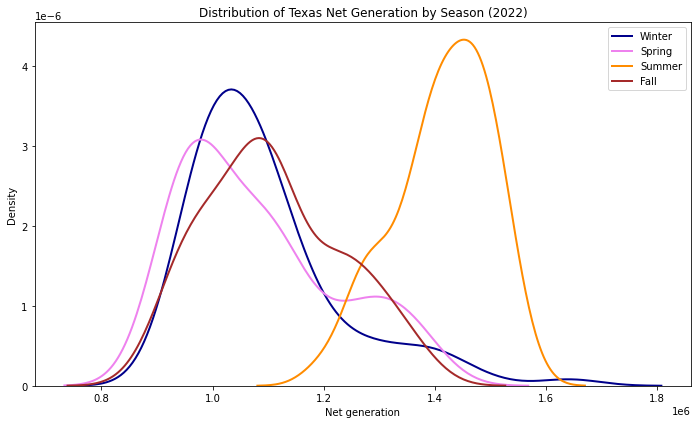

In [61]:
for id in IDs:
    plot_combined_dist(id, 'NG')

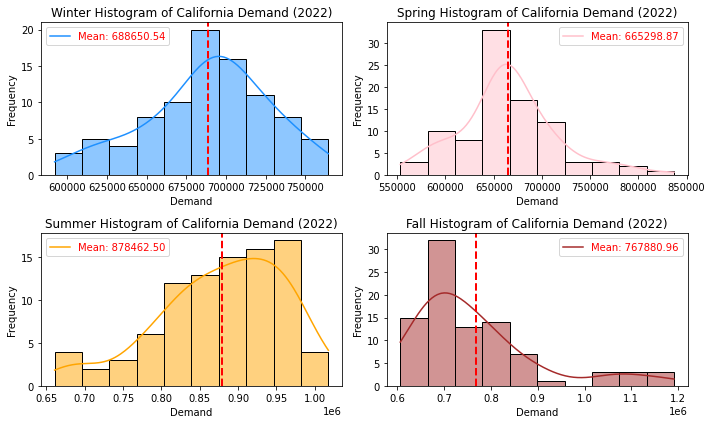

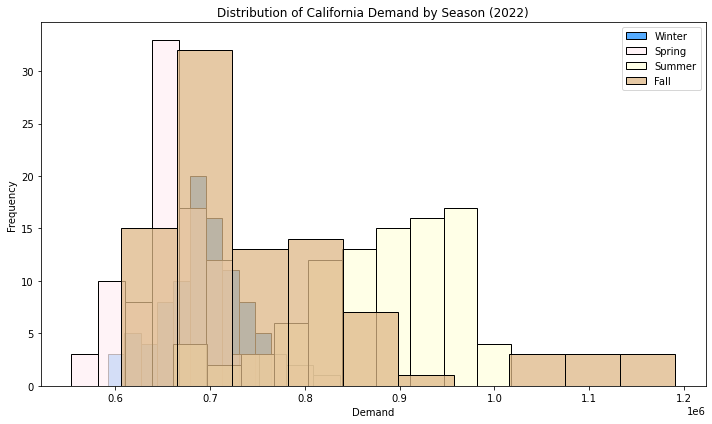

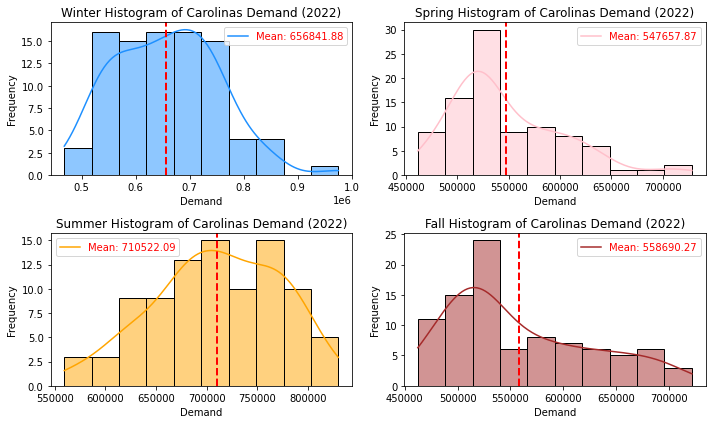

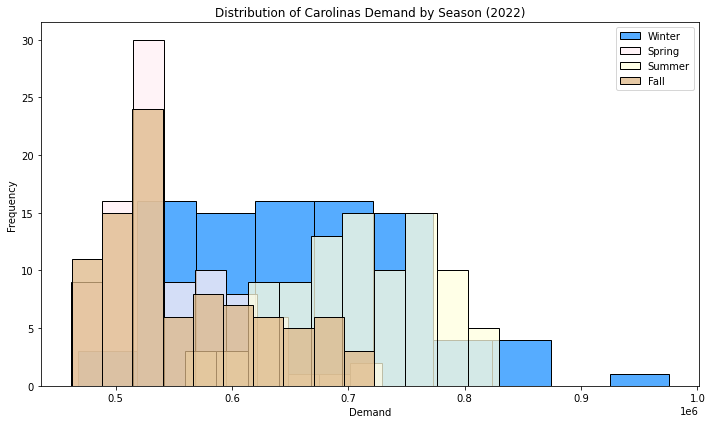

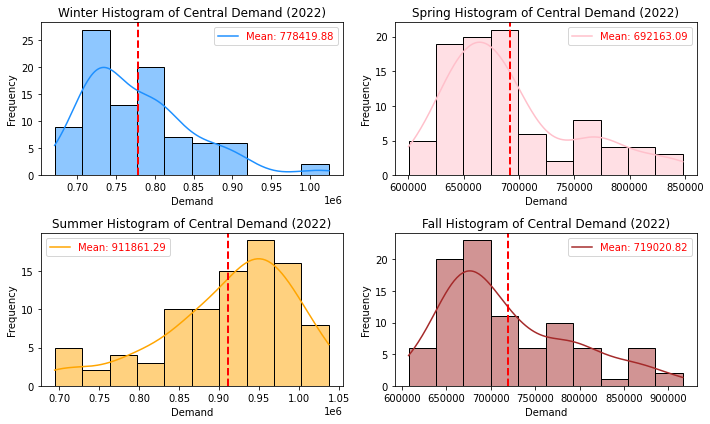

...

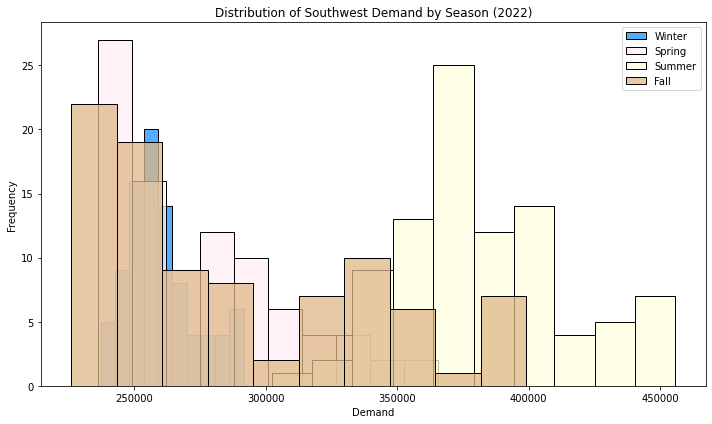

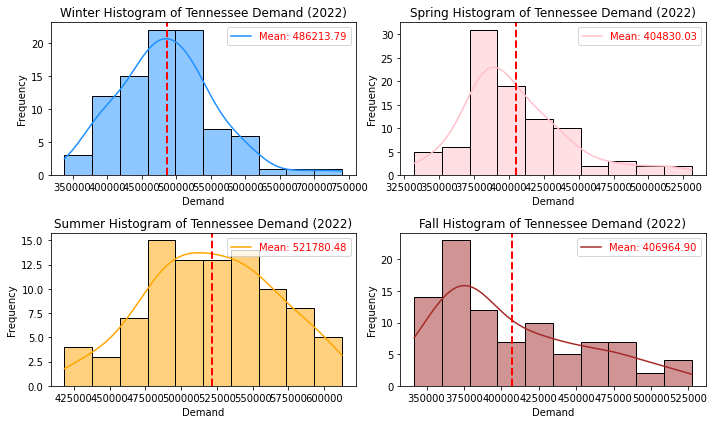

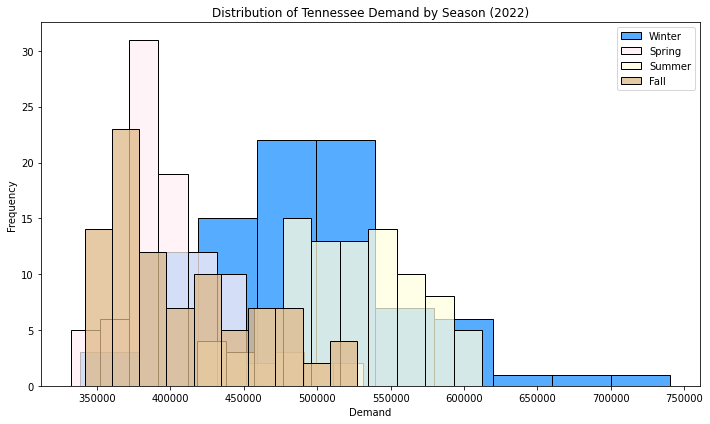

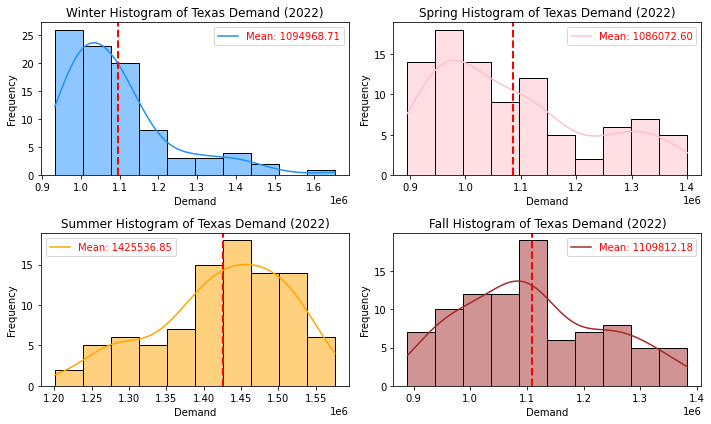

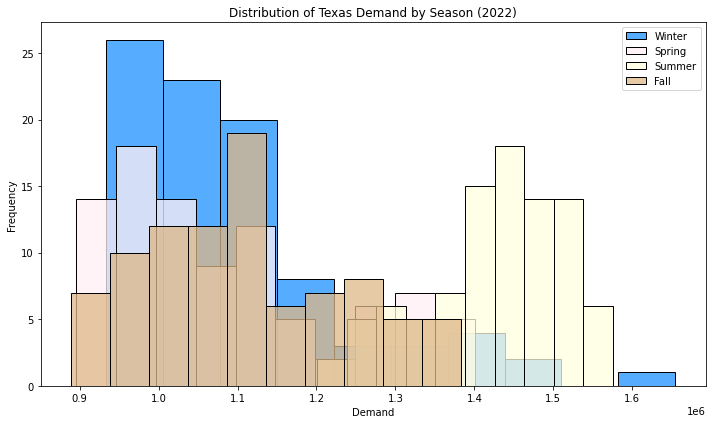

In [64]:
# plot_region_hist('Region ID','D' if Demand /'NG' if Net Generation)
for id in IDs:
    plot_region_hist(id,'D')

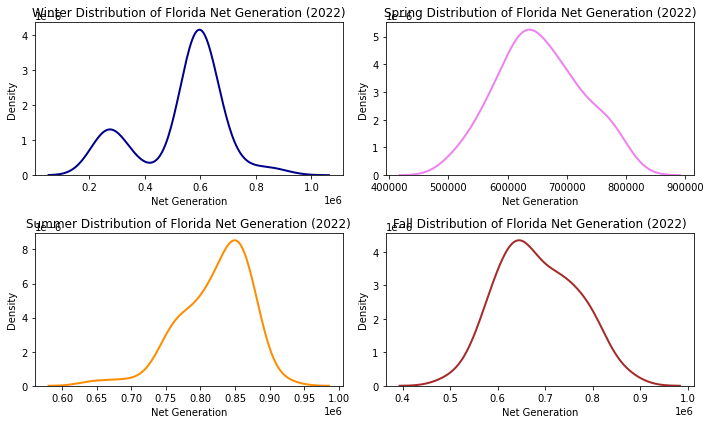

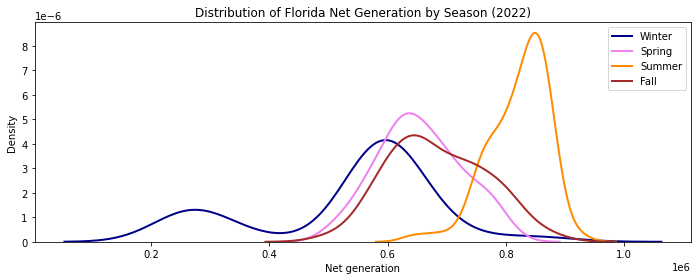

In [41]:
# plot_region_dist('Region ID','D' if Demand /'NG' if Net Generation)
plot_region_dist('FLA','NG')

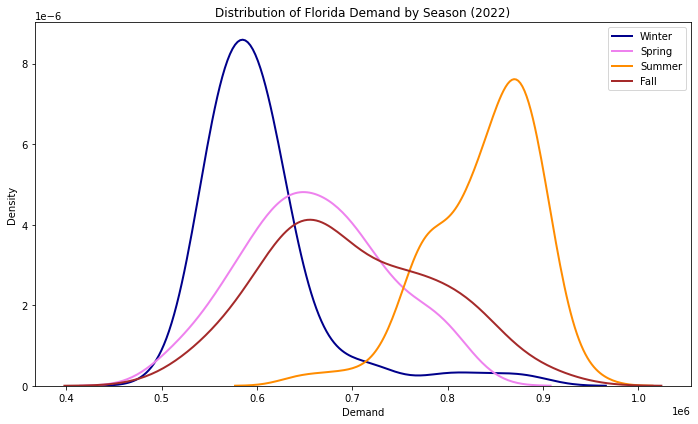

In [42]:
plot_combined_dist('FLA','D')

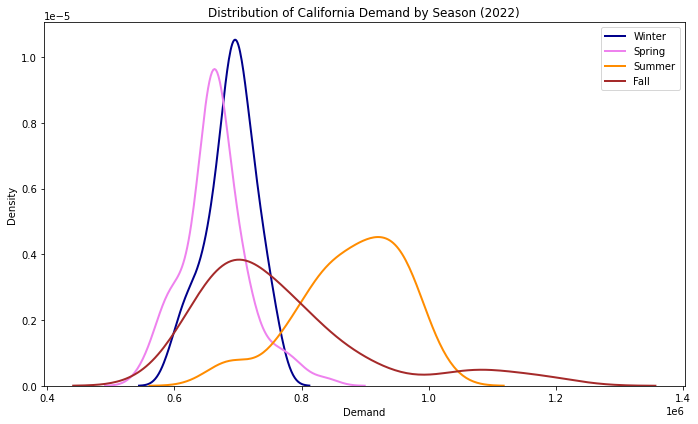

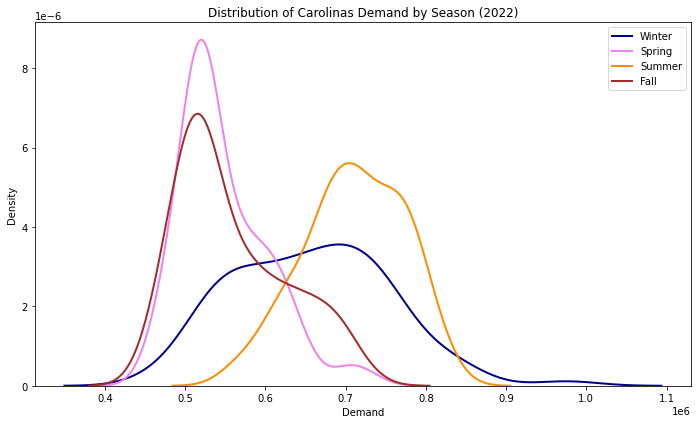

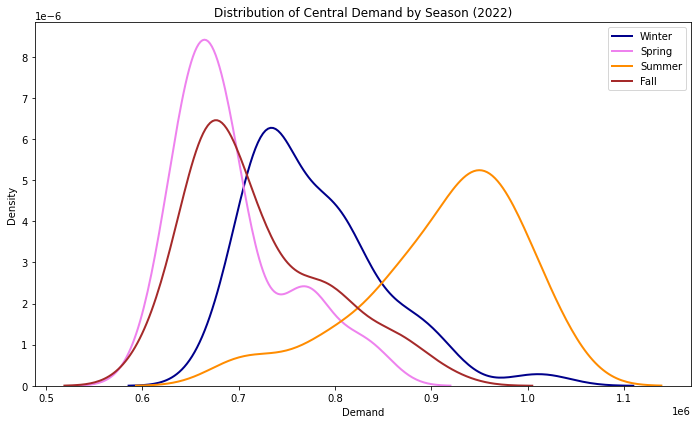

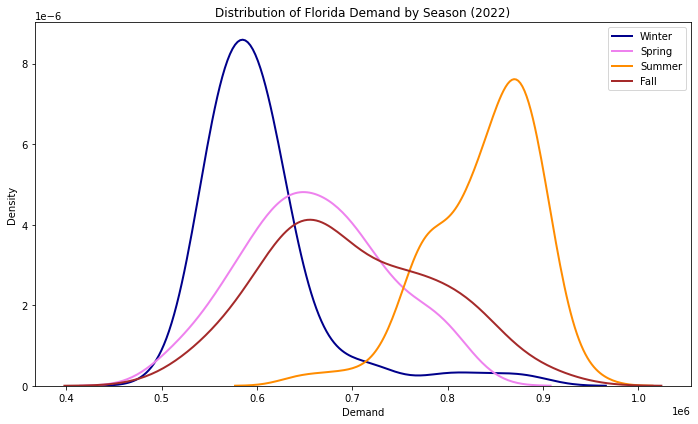

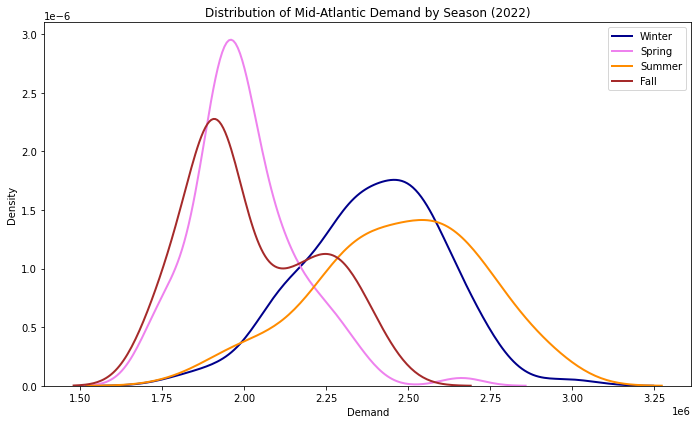

...

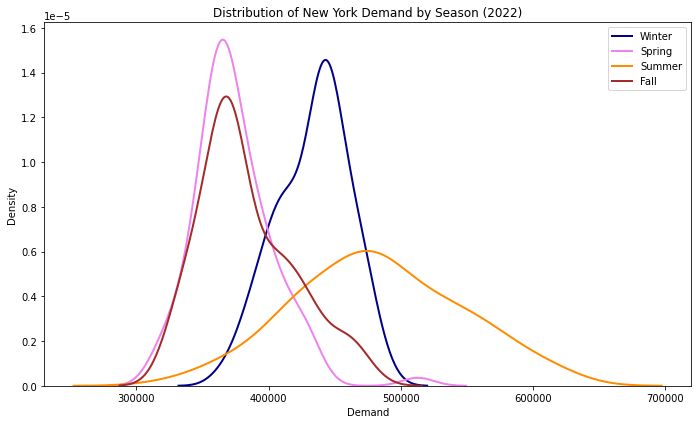

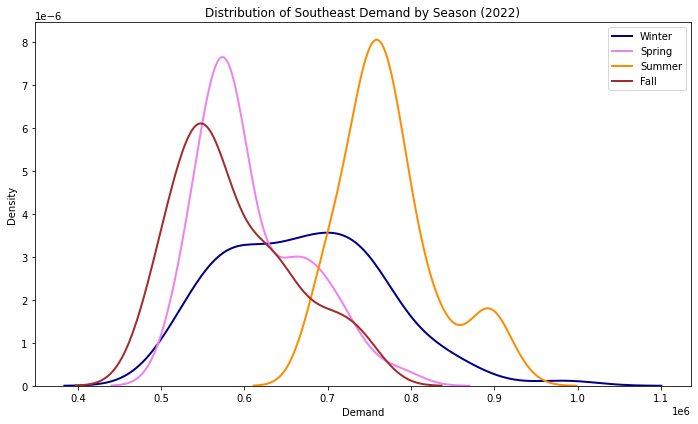

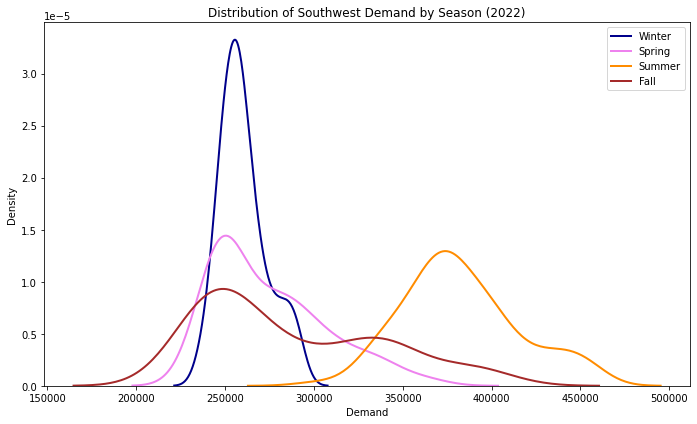

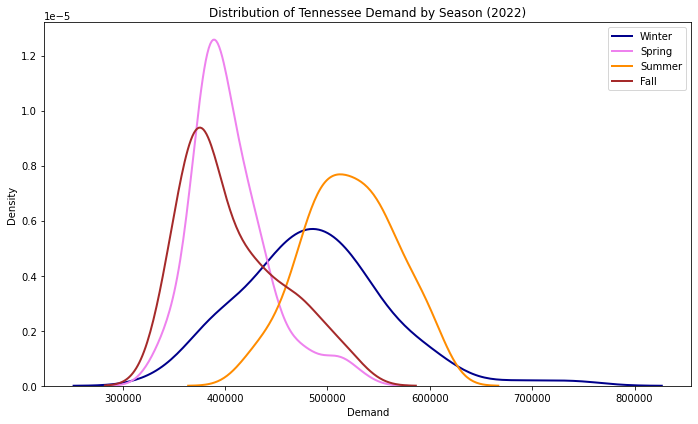

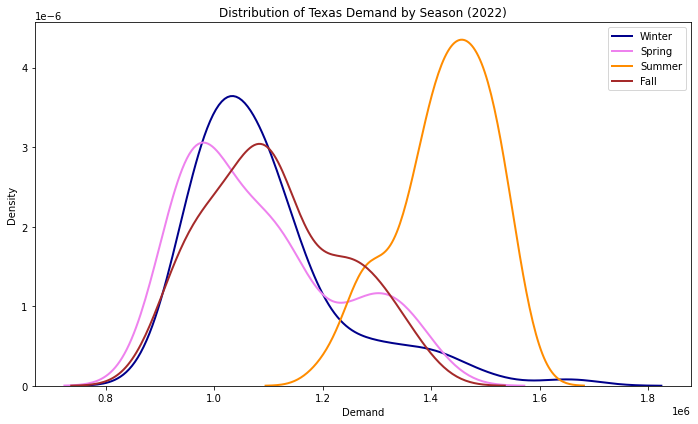

In [43]:
# Visualization of all region distributions

regions = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]

for region in regions:
    plot_combined_dist(region,'D')

### Statistical Testing Distributions

In [44]:
def check_distributions(df,season):
    for i in range(len(df)):
        demand = df[i].D.values
        region_name = df_ID_name(df,i)

        f = Fitter(demand,
                   distributions=get_common_distributions())
        f.fit()
        f.summary(plot=True)

        plt.title(f'{region_name} {season.capitalize()} Demand Distribution Fit (2022)')
        plt.show()

        print(f"{region_name} Best sumsquare_error: {f.get_best(method='sumsquare_error')}")
        print(f"{region_name} Best ks_pvalue: {f.get_best(method='ks_pvalue')}")
        print(f"{region_name} Best ks_statistic: {f.get_best(method='ks_statistic')}")
        print(f"{region_name} Best aic: {f.get_best(method='aic')}") #Akaike Information Criterion
        print('\n'*3)
    
    

In [77]:
# Experiment
def check_distributions(df,season):

    IDs = ["CAL","CAR","CENT","FLA","MIDA","MIDW","NE","NW","NY","SE","SW","TEN","TEX"]
    
    distribution_list = []
    
    for i, df_iter in enumerate(df):
        demand =  df_iter.D.values
            
        region_name = df_ID_name(df_iter, i) if df_ID_name(df_iter, i) is not None else df.index[0]

        f = Fitter(demand,
                   distributions=get_common_distributions())
        f.fit()
        f.summary(plot=True)

        plt.title(f'{region_name} {season.capitalize()} Demand Distribution Fit (2022)')
        plt.savefig(f"Plots/Distribution_Fits/{IDs[i]}_{season}_distribution_fit.png")
        plt.show()

        print(f"{region_name} Best sumsquare_error: {f.get_best(method='sumsquare_error')}")
        print(f"{region_name} Best ks_pvalue: {f.get_best(method='ks_pvalue')}")
        print(f"{region_name} Best ks_statistic: {f.get_best(method='ks_statistic')}")
        print(f"{region_name} Best aic: {f.get_best(method='aic')}") #Akaike Information Criterion
        print('\n'*3)

In [82]:
# Fully Functioning
def check_distributions(df,season):
    IDs = ["CAL","CAR","CENT","FLA","MIDA","MIDW","NE","NW","NY","SE","SW","TEN","TEX"]
    distribution_list = []
    
    for i in range(len(df)):
        demand = df[i].D.values
            
        region_name = df_ID_name(df, i) if df_ID_name(df, i) is not None else df.index[0]

        f = Fitter(demand,
                   distributions=get_common_distributions())
        f.fit()
        f.summary(plot=True)

        plt.title(f'{region_name} {season.capitalize()} Demand Distribution Fit (2022)')
        plt.savefig(f"Plots/Distribution_Fits/{IDs[i]}_{season}_distribution_fit.png")
        plt.show()

        print(f"{region_name} Best sumsquare_error: {f.get_best(method='sumsquare_error')}")
        print(f"{region_name} Best ks_pvalue: {f.get_best(method='ks_pvalue')}")
        print(f"{region_name} Best ks_statistic: {f.get_best(method='ks_statistic')}")
        print(f"{region_name} Best aic: {f.get_best(method='aic')}") #Akaike Information Criterion
        print('\n'*3)

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 29.16it/s]


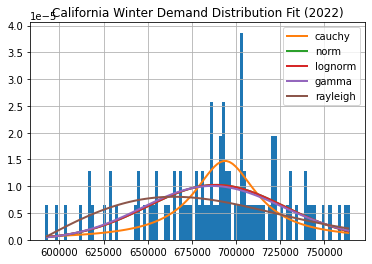

California Best sumsquare_error: {'cauchy': {'loc': 693824.5839852192, 'scale': 21599.510459455792}}
California Best ks_pvalue: {'exponpow': {'b': 1.4623510895514498, 'loc': 432012.46719833114, 'scale': 1.3427588914818783e-29}}
California Best ks_statistic: {'norm': {'loc': 688650.5444444445, 'scale': 38921.49898454041}}
California Best aic: {'uniform': {'loc': 592074.0, 'scale': 172371.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 32.29it/s]


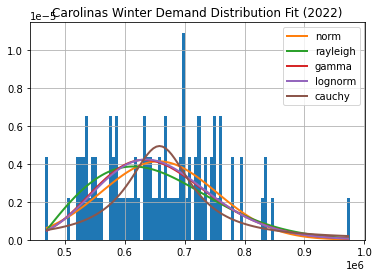

Carolinas Best sumsquare_error: {'norm': {'loc': 656841.8777777777, 'scale': 96252.26272616808}}
Carolinas Best ks_pvalue: {'exponpow': {'b': 1.3053444453258112, 'loc': 503060.655324671, 'scale': 3.902134995832234e-30}}
Carolinas Best ks_statistic: {'norm': {'loc': 656841.8777777777, 'scale': 96252.26272616808}}
Carolinas Best aic: {'uniform': {'loc': 467570.0, 'scale': 507907.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 33.19it/s]


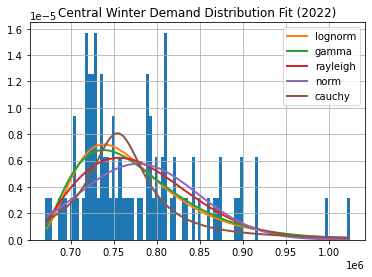

Central Best sumsquare_error: {'lognorm': {'s': 0.4562369723903993, 'loc': 629624.9050786243, 'scale': 134243.2134250789}}
Central Best ks_pvalue: {'chi2': {'df': 5.9106464187208954e-05, 'loc': 700342.9999999999, 'scale': 4.144063974537973}}
Central Best ks_statistic: {'gamma': {'a': 2.9461755864756216, 'loc': 659714.5115950869, 'scale': 40291.3411285662}}
Central Best aic: {'uniform': {'loc': 670653.0, 'scale': 353957.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 29.30it/s]


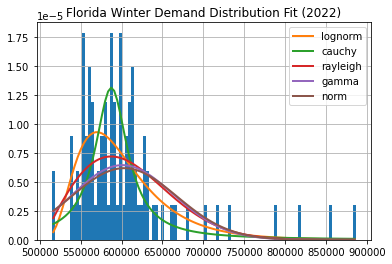

Florida Best sumsquare_error: {'lognorm': {'s': 0.47666087548927755, 'loc': 489723.2760302374, 'scale': 100637.1737863813}}
Florida Best ks_pvalue: {'chi2': {'df': 0.0001366216583134817, 'loc': 550659.9999999999, 'scale': 1.981236317604059}}
Florida Best ks_statistic: {'lognorm': {'s': 0.47666087548927755, 'loc': 489723.2760302374, 'scale': 100637.1737863813}}
Florida Best aic: {'uniform': {'loc': 514756.0, 'scale': 372165.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 38.01it/s]


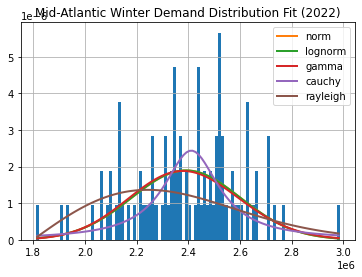

Mid-Atlantic Best sumsquare_error: {'norm': {'loc': 2391313.6666666665, 'scale': 210481.02066953422}}
Mid-Atlantic Best ks_pvalue: {'chi2': {'df': 0.010364470888617954, 'loc': 1809801.9999999995, 'scale': 52.4466291018245}}
Mid-Atlantic Best ks_statistic: {'norm': {'loc': 2391313.6666666665, 'scale': 210481.02066953422}}
Mid-Atlantic Best aic: {'uniform': {'loc': 1809802.0, 'scale': 1178476.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 41.97it/s]


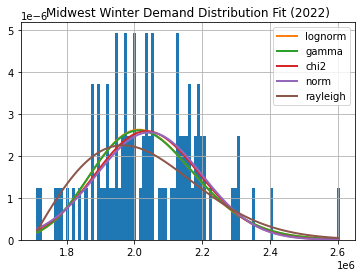

Midwest Best sumsquare_error: {'lognorm': {'s': 0.13296247163975186, 'loc': 881593.2235180433, 'scale': 1151979.536280681}}
Midwest Best ks_pvalue: {'exponpow': {'b': 1.3053444453258112, 'loc': 1953852.3388692946, 'scale': 3.902134995832234e-30}}
Midwest Best ks_statistic: {'chi2': {'df': 738.3989240780036, 'loc': -915042.9767985158, 'scale': 4007.097635937279}}
Midwest Best aic: {'uniform': {'loc': 1708657.0, 'scale': 899154.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 33.90it/s]


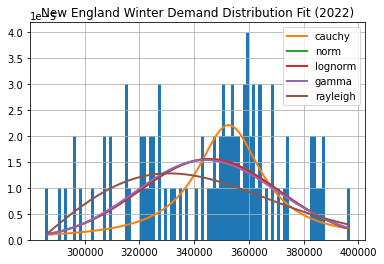

New England Best sumsquare_error: {'cauchy': {'loc': 352604.13291851466, 'scale': 14374.201714718352}}
New England Best ks_pvalue: {'chi2': {'df': 0.00012203933087583829, 'loc': 307222.99999999994, 'scale': 1.940765631975557}}
New England Best ks_statistic: {'norm': {'loc': 345468.97777777776, 'scale': 25616.113296984586}}
New England Best aic: {'uniform': {'loc': 285627.0, 'scale': 111245.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 46.27it/s]


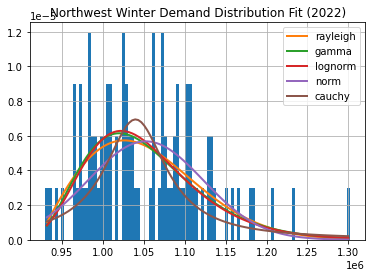

Northwest Best sumsquare_error: {'rayleigh': {'loc': 920271.014998047, 'scale': 105750.7167482255}}
Northwest Best ks_pvalue: {'chi2': {'df': 7.864043457527393e-05, 'loc': 965194.9999999998, 'scale': 2.2807154604071584}}
Northwest Best ks_statistic: {'rayleigh': {'loc': 920271.014998047, 'scale': 105750.7167482255}}
Northwest Best aic: {'uniform': {'loc': 929776.0, 'scale': 371987.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 37.05it/s]


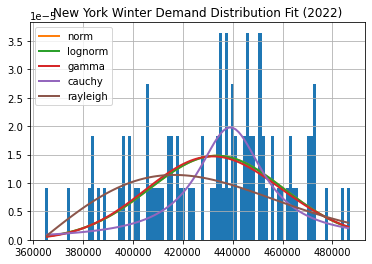

New York Best sumsquare_error: {'norm': {'loc': 433595.2888888889, 'scale': 26973.22912578505}}
New York Best ks_pvalue: {'exponpow': {'b': 1.1225063799376915, 'loc': 186616.69115026633, 'scale': 3.032383845460893e-28}}
New York Best ks_statistic: {'norm': {'loc': 433595.2888888889, 'scale': 26973.22912578505}}
New York Best aic: {'uniform': {'loc': 364945.0, 'scale': 122013.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 40.08it/s]


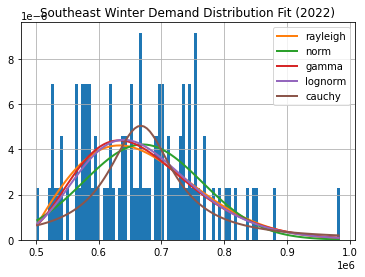

Southeast Best sumsquare_error: {'rayleigh': {'loc': 487820.16795126884, 'scale': 145142.51687479822}}
Southeast Best ks_pvalue: {'exponpow': {'b': 1.3053444453258112, 'loc': 544891.8400963838, 'scale': 3.902134995832234e-30}}
Southeast Best ks_statistic: {'rayleigh': {'loc': 487820.16795126884, 'scale': 145142.51687479822}}
Southeast Best aic: {'uniform': {'loc': 499898.0, 'scale': 484621.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 39.73it/s]


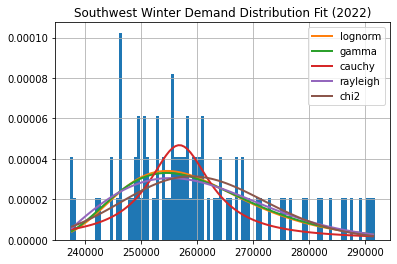

Southwest Best sumsquare_error: {'lognorm': {'s': 0.3137950652141776, 'loc': 219060.2040904123, 'scale': 39212.44559537856}}
Southwest Best ks_pvalue: {'exponpow': {'b': 1.6290811542533143, 'loc': 313651.5754083727, 'scale': 9.955040333441293e-29}}
Southwest Best ks_statistic: {'lognorm': {'s': 0.3137950652141776, 'loc': 219060.2040904123, 'scale': 39212.44559537856}}
Southwest Best aic: {'uniform': {'loc': 237395.0, 'scale': 54239.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 42.13it/s]


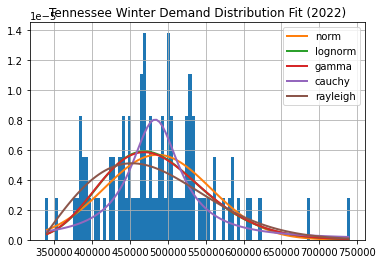

Tennessee Best sumsquare_error: {'norm': {'loc': 486213.7888888889, 'scale': 70318.37721021195}}
Tennessee Best ks_pvalue: {'exponpow': {'b': 1.3053444453258112, 'loc': 359712.7509503342, 'scale': 3.902134995832234e-30}}
Tennessee Best ks_statistic: {'lognorm': {'s': 0.16996385110563267, 'loc': 76756.41136200432, 'scale': 403579.32432069315}}
Tennessee Best aic: {'uniform': {'loc': 338233.0, 'scale': 402156.0}}






Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 39.00it/s]


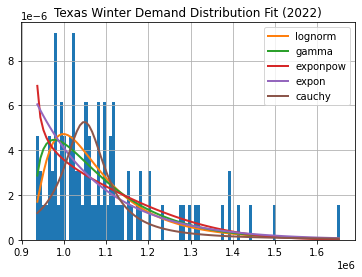

Texas Best sumsquare_error: {'lognorm': {'s': 0.6736451267498867, 'loc': 898612.3814486826, 'scale': 157380.56854298894}}
Texas Best ks_pvalue: {'uniform': {'loc': 933165.0, 'scale': 721463.0}}
Texas Best ks_statistic: {'lognorm': {'s': 0.6736451267498867, 'loc': 898612.3814486826, 'scale': 157380.56854298894}}
Texas Best aic: {'uniform': {'loc': 933165.0, 'scale': 721463.0}}






In [86]:
check_distributions(winterDFs,'winter')

In [46]:
def get_distribution(df): # Using Kolmogorov Smirnov test
    
    demand = df.D.values

    f = Fitter(demand,
               distributions=get_common_distributions())
    f.fit()
    fit_results = f.get_best(method='ks_statistic')
    
    if next(iter(fit_results)) == 'norm':
        distribution = 'Normal'
        distribution_params = {}
        distribution_params['mean'] = fit_results['norm']['loc']
        distribution_params['std'] = fit_results['norm']['scale']   
        
        print(f"\/\/ {df.index[0]} results \/\/")
        print(f"Distribution: {distribution}")
        print(f"Mean: {distribution_params['mean']}")
        print(f"std: {distribution_params['std']}")
        
        return distribution, distribution_params
        
    elif next(iter(fit_results)) == 'gamma':
        distribution = 'Gamma'
        distribution_params = {}
        distribution_params['a'] = fit_results['gamma']['a']
        distribution_params['loc'] = fit_results['gamma']['loc']
        distribution_params['scale'] = fit_results['gamma']['scale']
         
        print(f"\/\/ {df.index[0]} results \/\/")
        print(f"Distribution: {distribution}")
        print(f"a: {distribution_params['a']}")
        print(f"loc: {distribution_params['loc']}")
        print(f"scale: {distribution_params['scale']}")
        
        return distribution, distribution_params
        
    elif next(iter(fit_results)) == 'rayleigh':
        
        distribution = 'Rayleigh'
        distribution_params = {}
        distribution_params['loc'] = fit_results['rayleigh']['loc']
        distribution_params['scale'] = fit_results['rayleigh']['scale']
         
        print(f"\/\/ {df.index[0]} results \/\/")
        print(f"Distribution: {distribution}")
        print(f"loc: {distribution_params['loc']}")
        print(f"scale: {distribution_params['scale']}")
        
        return distribution, distribution_params
    
    elif next(iter(fit_results)) == 'cauchy':
        
        distribution = 'Cauchy'
        distribution_params = {}
        distribution_params['loc'] = fit_results['cauchy']['loc']
        distribution_params['scale'] = fit_results['cauchy']['scale']
        
         
        print(f"\/\/ {df.index[0]} results \/\/")
        print(f"Distribution: {distribution}")
        print(f"loc: {distribution_params['loc']}")
        print(f"scale: {distribution_params['scale']}")
        
        return distribution, distribution_params
        
    elif next(iter(fit_results)) == 'chi2':
        
        distribution = 'Chi2'
        distribution_params = {}
        distribution_params['df'] = fit_results['chi2']['df']
        distribution_params['loc'] = fit_results['chi2']['loc']
        distribution_params['scale'] = fit_results['chi2']['scale']
         
        print(f"\/\/ {df.index[0]} results \/\/")
        print(f"Distribution: {distribution}")
        print(f"df: {distribution_params['df']}")
        print(f"loc: {distribution_params['loc']}")
        print(f"scale: {distribution_params['scale']}")
        
        return distribution, distribution_params
        
    elif next(iter(fit_results)) == 'exponpow':
        
        distribution = 'Exponential Power'
        distribution_params = {}
        distribution_params['b'] = fit_results['exponpow']['b']
        distribution_params['loc'] = fit_results['exponpow']['loc']
        distribution_params['scale'] = fit_results['exponpow']['scale']
         
        print(f"\/\/ {df.index[0]} results \/\/")
        print(f"Distribution: {distribution}")
        print(f"b: {distribution_params['b']}")
        print(f"loc: {distribution_params['loc']}")
        print(f"scale: {distribution_params['scale']}")
        
        return distribution, distribution_params
        
    elif next(iter(fit_results)) == 'powerlaw':
        
        distribution = 'Powerlaw'
        distribution_params = {}
        distribution_params['a'] = fit_results['powerlaw']['a']
        distribution_params['loc'] = fit_results['powerlaw']['loc']
        distribution_params['scale'] = fit_results['powerlaw']['scale']
         
        print(f"\/\/ {df.index[0]} results \/\/")
        print(f"Distribution: {distribution}")
        print(f"a: {distribution_params['a']}")
        print(f"loc: {distribution_params['loc']}")
        print(f"scale: {distribution_params['scale']}")
        
        return distribution, distribution_params
    
    elif next(iter(fit_results)) == 'expon':
        
        distribution = 'Exponential'
        distribution_params = {}
        distribution_params['loc'] = fit_results['expon']['loc']
        distribution_params['scale'] = fit_results['expon']['scale']
         
        print(f"\/\/ {df.index[0]} results \/\/")
        print(f"Distribution: {distribution}")
        print(f"loc: {distribution_params['loc']}")
        print(f"scale: {distribution_params['scale']}")
        
        return distribution, distribution_params
    
    elif next(iter(fit_results)) == 'lognorm':
        
        distribution = 'Log-Normal'
        distribution_params = {}
        distribution_params['s'] = fit_results['lognorm']['s']
        distribution_params['loc'] = fit_results['lognorm']['loc']
        distribution_params['scale'] = fit_results['lognorm']['scale']
         
        print(f"\/\/ {df.index[0]} results \/\/")
        print(f"Distribution: {distribution}")
        print(f"s: {distribution_params['s']}")
        print(f"loc: {distribution_params['loc']}")
        print(f"scale: {distribution_params['scale']}")
        
        return distribution, distribution_params
    
    else: 
        print(f"{df.index[0]} results ")
        print(fit_results)

In [66]:
# [0:"CAL", 1:"CAR", 2:"CENT", 3:"FLA", 4:"MIDA", 5:"MIDW", 6:"NE", 7:"NW", 8:"NY", 9:"SE", 10:"SW", 11:"TEN", 12:"TEX"]

seasonalDFs = [winterDFs, springDFs, summerDFs, fallDFs] 

CAL_distributions = []
CAR_distributions = []
CENT_distributions = []
FLA_distributions = []
MIDA_distributions = []
MIDW_distributions = []
NE_distributions = []
NW_distributions = []
NY_distributions = []
SE_distributions = []
SW_distributions = []
SW_distributions = []
TEN_distributions = []
TEX_distributions = []

for seasonDFs in seasonalDFs:
    CAL_distributions.append(get_distribution(seasonDFs[0]))
    CAR_distributions.append(get_distribution(seasonDFs[1]))
    CENT_distributions.append(get_distribution(seasonDFs[2]))
    FLA_distributions.append(get_distribution(seasonDFs[3]))
    MIDA_distributions.append(get_distribution(seasonDFs[4]))
    MIDW_distributions.append(get_distribution(seasonDFs[5]))
    NE_distributions.append(get_distribution(seasonDFs[6]))
    NW_distributions.append(get_distribution(seasonDFs[7]))
    NY_distributions.append(get_distribution(seasonDFs[8]))
    SE_distributions.append(get_distribution(seasonDFs[9]))
    SW_distributions.append(get_distribution(seasonDFs[10]))
    TEN_distributions.append(get_distribution(seasonDFs[11]))
    TEX_distributions.append(get_distribution(seasonDFs[12]))

Fitting 10 distributions:   0%|          | 0/10 [00:00<?, ?it/s]

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 40.57it/s]


\/\/ CAL results \/\/
Distribution: Normal
Mean: 688650.5444444445
std: 38921.49898454041


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 47.12it/s]


\/\/ CAR results \/\/
Distribution: Normal
Mean: 656841.8777777777
std: 96252.26272616808


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 51.60it/s]


\/\/ CENT results \/\/
Distribution: Gamma
a: 2.9461755864756216
loc: 659714.5115950869
scale: 40291.3411285662


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 44.18it/s]


\/\/ FLA results \/\/
Distribution: Log-Normal
s: 0.47666087548927755
loc: 489723.2760302374
scale: 100637.1737863813


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 46.21it/s]


\/\/ MIDA results \/\/
Distribution: Normal
Mean: 2391313.6666666665
std: 210481.02066953422


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 46.61it/s]


\/\/ MIDW results \/\/
Distribution: Chi2
df: 738.3989240780036
loc: -915042.9767985158
scale: 4007.097635937279


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 44.81it/s]


\/\/ NE results \/\/
Distribution: Normal
Mean: 345468.97777777776
std: 25616.113296984586


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 60.42it/s]


\/\/ NW results \/\/
Distribution: Rayleigh
loc: 920271.014998047
scale: 105750.7167482255


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 44.60it/s]


\/\/ NY results \/\/
Distribution: Normal
Mean: 433595.2888888889
std: 26973.22912578505


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 51.99it/s]


\/\/ SE results \/\/
Distribution: Rayleigh
loc: 487820.16795126884
scale: 145142.51687479822


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 63.15it/s]


\/\/ SW results \/\/
Distribution: Log-Normal
s: 0.3137950652141776
loc: 219060.2040904123
scale: 39212.44559537856


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 56.18it/s]


\/\/ TEN results \/\/
Distribution: Log-Normal
s: 0.16996385110563267
loc: 76756.41136200432
scale: 403579.32432069315


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 53.21it/s]


\/\/ TEX results \/\/
Distribution: Log-Normal
s: 0.6736451267498867
loc: 898612.3814486826
scale: 157380.56854298894


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 55.41it/s]


\/\/ CAL results \/\/
Distribution: Cauchy
loc: 662657.7568416441
scale: 21149.318207179957


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 54.63it/s]


\/\/ CAR results \/\/
Distribution: Log-Normal
s: 0.41913658847494
loc: 420711.0045810798
scale: 116335.28570975845


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 52.61it/s]


\/\/ CENT results \/\/
Distribution: Log-Normal
s: 0.47234142649648725
loc: 571428.6808841886
scale: 108046.38562658212


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 45.85it/s]


\/\/ FLA results \/\/
Distribution: Log-Normal
s: 0.053291900387302076
loc: -740472.4352467844
scale: 1399447.1379541182


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 50.71it/s]


\/\/ MIDA results \/\/
Distribution: Cauchy
loc: 1968392.7138973442
scale: 74190.18784999865


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 54.64it/s]


\/\/ MIDW results \/\/
Distribution: Log-Normal
s: 0.3433637538186829
loc: 1448864.4965741131
scale: 328418.2723878809


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 56.86it/s]


\/\/ NE results \/\/
Distribution: Gamma
a: 11.290871910378076
loc: 196580.95933300426
scale: 7732.283792071523


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 61.53it/s]


\/\/ NW results \/\/
Distribution: Chi2
df: 136.9027517628392
loc: 518604.09033239516
scale: 2783.1351385212183


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 47.16it/s]


\/\/ NY results \/\/
Distribution: Log-Normal
s: 0.23624627667728837
loc: 252391.9633875522
scale: 118065.82409106655


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 49.23it/s]


\/\/ SE results \/\/
Distribution: Log-Normal
s: 0.5129429069191999
loc: 484600.0812244296
scale: 109063.35399369536


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 45.74it/s]


\/\/ SW results \/\/
Distribution: Gamma
a: 1.2012723406456116
loc: 235928.24397977302
scale: 32194.113230284835


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 50.87it/s]


\/\/ TEN results \/\/
Distribution: Log-Normal
s: 0.29323755185589157
loc: 280099.9365346959
scale: 119433.60399326873


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 50.42it/s]


\/\/ TEX results \/\/
Distribution: Exponential Power
b: 0.969970214971978
loc: 895477.9999999999
scale: 327556.23933423054


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 53.78it/s]


\/\/ CAL results \/\/
Distribution: Normal
Mean: 878462.5
std: 81924.78911855412


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 49.35it/s]


\/\/ CAR results \/\/
Distribution: Normal
Mean: 710522.0869565217
std: 61512.19241225274


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 47.20it/s]


\/\/ CENT results \/\/
Distribution: Powerlaw
a: 1.9967206037184437
loc: 661600.9362278695
scale: 376285.0637721306


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 48.40it/s]


\/\/ FLA results \/\/
Distribution: Chi2
df: 513.9349551881086
loc: -77352.37966091037
scale: 1784.6355209185135


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 51.10it/s]


\/\/ MIDA results \/\/
Distribution: Normal
Mean: 2467189.804347826
std: 251373.19927948804


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 52.41it/s]


\/\/ MIDW results \/\/
Distribution: Normal
Mean: 2191561.4782608696
std: 175042.17840115973


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 59.75it/s]


\/\/ NE results \/\/
Distribution: Gamma
a: 10.925823051632863
loc: 167866.74666668952
scale: 17803.439646656396


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 37.78it/s]


\/\/ NW results \/\/
Distribution: Powerlaw
a: 1.3505084629936244
loc: 862371.0814092933
scale: 328099.9185907067


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 48.97it/s]


\/\/ NY results \/\/
Distribution: Log-Normal
s: 0.026112084374555533
loc: -1913682.6316584358
scale: 2395013.253473721


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 51.77it/s]


\/\/ SE results \/\/
Distribution: Log-Normal
s: 0.36015245179010846
loc: 616169.4837141604
scale: 147533.95194896017


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 53.17it/s]


\/\/ SW results \/\/
Distribution: Log-Normal
s: 0.1426846359194931
loc: 156997.3628941955
scale: 223136.93524132067


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 46.35it/s]


\/\/ TEN results \/\/
Distribution: Gamma
a: 2090.885917889882
loc: -1521303.8955807071
scale: 977.1217832203141


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 54.03it/s]


\/\/ TEX results \/\/
Distribution: Normal
Mean: 1425536.847826087
std: 86623.8879400273


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 53.23it/s]


\/\/ CAL results \/\/
Distribution: Log-Normal
s: 0.6708069925204005
loc: 576297.8550100062
scale: 153614.91746658433


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 51.31it/s]


\/\/ CAR results \/\/
Distribution: Log-Normal
s: 0.5705732393043087
loc: 436273.4045920061
scale: 104763.4200778611


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 50.37it/s]


\/\/ CENT results \/\/
Distribution: Log-Normal
s: 0.4509124028031618
loc: 559543.5280348051
scale: 144284.68995420806


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 43.71it/s]


\/\/ FLA results \/\/
Distribution: Gamma
a: 21.566016168747137
loc: 278972.59390472807
scale: 19477.493250080322


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 40.57it/s]


\/\/ MIDA results \/\/
Distribution: Gamma
a: 2.918361243058007
loc: 1667456.096572798
scale: 121584.81949318224


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 49.44it/s]


\/\/ MIDW results \/\/
Distribution: Gamma
a: 3.624473086265346
loc: 1491596.4459558087
scale: 89784.6648942969


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 48.29it/s]


\/\/ NE results \/\/
Distribution: Gamma
a: 18.189352269609255
loc: 185078.2804232142
scale: 5759.458446476934


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 41.47it/s]


\/\/ NW results \/\/
Distribution: Exponential Power
b: 0.9829959556646946
loc: 825920.9999999999
scale: 191499.34535007656


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 52.06it/s]


\/\/ NY results \/\/
Distribution: Gamma
a: 3.016041242388146
loc: 320087.9411638033
scale: 21059.034156729926


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 54.84it/s]


\/\/ SE results \/\/
Distribution: Gamma
a: 2.2417164317762075
loc: 475226.0875490704
scale: 50073.54648824164


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 54.09it/s]


\/\/ SW results \/\/
Distribution: Exponential
loc: 226088.0
scale: 61509.241758241784


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 66.87it/s]


\/\/ TEN results \/\/
Distribution: Gamma
a: 1.5893404056902178
loc: 340177.81791473937
scale: 42021.88741843485


Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 53.95it/s]

\/\/ TEX results \/\/
Distribution: Rayleigh
loc: 871021.0744669054
scale: 190419.79920795246


In [67]:
class Node:
    def __init__(self, name, ID, states, distribution, distribution_params, demand, generation,capacity): 
        self.name = name
        self.ID = ID
        self.states = states
        self.distribution = distribution
        self.distribution_params = distribution_params
        self.demand = demand
        self.generation = generation
        self.capacity = capacity
        
    def see_distribution(self):
        print(f"Based on Kolmogorov-Smirnov statistic:")
        print(f"{self.name} node follows -> {self.distribution} distribution")

In [78]:
check_distributions(springDFs,'spring')

KeyError: 0

## Creating seasonal matrices

In [71]:
def partition(lst, n):
    division = len(lst) / n
    return [lst[round(division * i):round(division * (i + 1))] for i in range(n)]

def seasonal(dfs_list, IDs):
    lst = []

    for i in range(13):
        for j in IDs:
            lst.append(dfs_list[i][j].sum())

    lst = partition(lst, 13)
    seasonal = pd.DataFrame(lst, columns=IDs, index=IDs).rename_axis("From")
    return seasonal

In [72]:
IDs = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]

seasonal_winter_2022 = seasonal(winterDFs, IDs)
seasonal_spring_2022 = seasonal(springDFs, IDs)
seasonal_summer_2022 = seasonal(summerDFs, IDs)
seasonal_fall_2022   = seasonal(fallDFs, IDs)

## Region Information Display:

In [73]:
# full daily from/to flow dfs

display(daily_winter2022.style.set_caption("DAILY WINTER 2022 [from/to] flows"))
print("\n" * 5)
display(daily_spring2022.style.set_caption("DAILY SPRING 2022 [from/to] flows"))
print("\n" * 5)
display(daily_summer2022.style.set_caption("DAILY SUMMER 2022 [from/to] flows"))
print("\n" * 5)
display(daily_fall2022.style.set_caption("DAILY FALL 2022 [from/to] flows"))

,Local date,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,,
CAL,2022-01-01 00:00:00,651866.000000,458323.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-01-02 00:00:00,669035.000000,456177.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-01-03 00:00:00,731490.000000,508624.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-01-04 00:00:00,720270.000000,514746.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-01-05 00:00:00,712851.000000,520477.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-01-06 00:00:00,711428.000000,472976.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-01-07 00:00:00,721063.000000,460240.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-01-08 00:00:00,660814.000000,426318.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-01-09 00:00:00,645490.000000,440925.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,Local date,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,,
CAL,2022-03-01 00:00:00,676681.000000,458648.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-03-02 00:00:00,674519.000000,450050.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-03-03 00:00:00,679697.000000,441383.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-03-04 00:00:00,677735.000000,449351.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-03-05 00:00:00,632444.000000,438016.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-03-06 00:00:00,603174.000000,441910.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-03-07 00:00:00,665960.000000,485169.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-03-08 00:00:00,663742.000000,485457.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-03-09 00:00:00,659401.000000,505105.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,Local date,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,,
CAL,2022-06-01 00:00:00,778376.000000,561618.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-06-02 00:00:00,783649.000000,588189.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-06-03 00:00:00,759596.000000,569352.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-06-04 00:00:00,697553.000000,523616.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-06-05 00:00:00,692569.000000,517535.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-06-06 00:00:00,779230.000000,587424.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-06-07 00:00:00,806882.000000,618535.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-06-08 00:00:00,829708.000000,645579.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-06-09 00:00:00,863564.000000,667728.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,Local date,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,,
CAL,2022-09-01 00:00:00,1069979.000000,880926.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-09-02 00:00:00,1077833.000000,895482.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-09-03 00:00:00,1034864.000000,798529.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-09-04 00:00:00,1041024.000000,794062.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-09-05 00:00:00,1102996.000000,869802.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-09-06 00:00:00,1191186.000000,948874.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-09-07 00:00:00,1184499.000000,933311.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-09-08 00:00:00,1154712.000000,892994.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAL,2022-09-09 00:00:00,1090536.000000,800963.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [74]:
i=0
all_from_reg = [] # I'd have to create one for winter, spring, summer and fall 
all_to_reg = []

for id in IDs:
    row_sum = seasonal_winter_2022.sum(axis=1)[i]
    print(f"From {id}: {row_sum}")
    all_from_reg.append(row_sum)
    print(f"To {id}: {seasonal_winter_2022[id].sum()}")
    all_to_reg.append(seasonal_winter_2022[id].sum())
    print()
    i+=1

From CAL: 94005.0
To CAL: 15818130.0

From CAR: 2331183.0
To CAR: 3728681.0

From CENT: 2402151.0
To CENT: 166569.0

From FLA: 645701.0
To FLA: 119829.0

From MIDA: 15391789.0
To MIDA: 4592689.0

From MIDW: 5603590.0
To MIDW: 11450224.0

From NE: 12195.0
To NE: 2173811.0

From NW: 9541034.0
To NW: 643381.0

From NY: 2173811.0
To NY: 5792017.0

From SE: 3759729.0
To SE: 2772930.0

From SW: 8209916.0
To SW: 2060763.0

From TEN: 4927636.0
To TEN: 5672598.0

From TEX: 118955.0
To TEX: 220073.0



In [75]:
winter_region_DF = winter_DF.copy()
spring_region_DF = spring_DF.copy()
summer_region_DF = summer_DF.copy()
fall_region_DF = fall_DF.copy()

### Regional Capacities

In [ ]:
# GENERATING CAPACITY 

url = 'https://api.eia.gov/v2/electricity/state-electricity-profiles/capability/data/\
?frequency=annual&data[0]=capability&facets[energysourceid][]=ALL&facets[producertypeid][]=\
TOT&facets[stateId][]=AK&facets[stateId][]=AL&facets[stateId][]=AR&facets[stateId][]\
=AZ&facets[stateId][]=CA&facets[stateId][]=CO&facets[stateId][]=CT&facets[stateId][]\
=DC&facets[stateId][]=DE&facets[stateId][]=FL&facets[stateId][]=GA&facets[stateId][]\
=HI&facets[stateId][]=IA&facets[stateId][]=ID&facets[stateId][]=IL&facets[stateId][]\
=IN&facets[stateId][]=KS&facets[stateId][]=KY&facets[stateId][]=LA&facets[stateId][]\
=MA&facets[stateId][]=MD&facets[stateId][]=ME&facets[stateId][]=MI&facets[stateId][]\
=MN&facets[stateId][]=MO&facets[stateId][]=MS&facets[stateId][]=MT&facets[stateId][]\
=NC&facets[stateId][]=ND&facets[stateId][]=NE&facets[stateId][]=NH&facets[stateId][]\
=NJ&facets[stateId][]=NM&facets[stateId][]=NV&facets[stateId][]=NY&facets[stateId][]\
=OH&facets[stateId][]=OK&facets[stateId][]=OR&facets[stateId][]=PA&facets[stateId][]\
=RI&facets[stateId][]=SC&facets[stateId][]=SD&facets[stateId][]=TN&facets[stateId][]\
=TX&facets[stateId][]=US&facets[stateId][]=UT&facets[stateId][]=VA&facets[stateId][]\
=VT&facets[stateId][]=WA&facets[stateId][]=WI&facets[stateId][]=WV&facets[stateId][]\
=WY&start=2021&end=2021&sort[0][column]=period&sort[0][direction]=desc&offset=0&length=5000&\
api_key=eLgbDxhWqnK8snD2hXPSm1TQVieMbreDmyTWhHkM'

api_response = requests.get(url)

if api_response.status_code == 200:
    data = api_response.text
    capacities = json.loads(data)
    #     print('Dictionary Petroleum Data:\n\n', petroleum)
    capacities_df = pd.DataFrame.from_dict(capacities['response']['data'])
    
else:
    print("Error: API request failed with status code", api_response.status_code)

In [ ]:
capacities_df.drop(columns=['producertypeid','energysourceid','energySourceDescription'], inplace=True)
capacities_df.set_index('stateId',inplace = True)

In [ ]:
capacities_df

,period,stateDescription,producerTypeDescription,capability,capability-units
stateId,,,,,
MT,2021,Montana,All sectors,6066.8,megawatts
MS,2021,Mississippi,All sectors,14605.1,megawatts
DC,2021,District of Columbia,All sectors,47.9,megawatts
DE,2021,Delaware,All sectors,3272.6,megawatts
FL,2021,Florida,All sectors,64609.7,megawatts
PA,2021,Pennsylvania,All sectors,49766.4,megawatts
RI,2021,Rhode Island,All sectors,2131.1,megawatts
GA,2021,Georgia,All sectors,38250.1,megawatts
SC,2021,South Carolina,All sectors,24267.8,megawatts


In [ ]:
region_states = []

# CAL
region_states.append({'CA': 'California'})

# CAR
region_states.append({'NC': 'North Carolina', 'SC': 'South Carolina'})

# CENT
region_states.append({'ND': 'North Dakota', 'SD': 'South Dakota', 'NE': 'Nebraska',
                     'KS':'Kansas', 'OK':'Oklahoma'})

# FLA
region_states.append({'FL': 'Florida'})

# MIDA
region_states.append({'OH': 'Ohio','KY':'Kentucky', 'PA':'Pennsylvania', 
                      'WV':'West Virginia','VA':'Virginia','NJ':'New Jersey',
                     'DE':'Delaware', 'MD':'Maryland'})
# MIDW
region_states.append({'MN': 'Minnesota','IA':'Iowa', 'MO':'Missouri', 
                      'AR':'Arkansas','LA':'Louisiana','WI':'Wisconsin',
                     'IL':'Illinois', 'MI':'Michigan', 'IN':'Indiana'})
# NE
region_states.append({'VT': 'Vermont','NH':'New Hampshire', 'MA':'Massachusetts', 
                      'CT':'Connecticut','RI':'Rhode Island','ME':'Maine'})
# NW
region_states.append({'WA': 'Washington','OR':'Oregon', 'NV':'Nevada', 
                      'ID':'Idaho','MT':'Montana','WY':'Wyoming',
                     'UT':'Utah', 'CO':'Colorado'})
# NY 
region_states.append({'NY': 'New York'})

# SE
region_states.append({'MS': 'Mississippi','AL':'Alabama', 'GA':'Georgia'})

# SW
region_states.append({'AZ': 'Arizona','NM':'New Mexico'})

# TEN
region_states.append({'TN': 'Tennessee'})

# TEX
region_states.append({'TX': 'Texas'})

In [ ]:
region_capacities = []

for region in region_states: 
    capacity = 0
    print(f" \n---- {region.values()}:\n\n")
    for stateID in list(region.keys()):
        print(f"{stateID} capacity: {capacities_df.loc[stateID]['capability']}")
        capacity += capacities_df.loc[stateID]['capability']
        print(f"Current capacitiy: {capacity}")
    print(f"\nTOTAL CAPACITY: {capacity}")
    region_capacities.append(capacity)

 
---- dict_values(['California']):


CA capacity: 81183.7
Current capacitiy: 81183.7

TOTAL CAPACITY: 81183.7
 
---- dict_values(['North Carolina', 'South Carolina']):


NC capacity: 35020.4
Current capacitiy: 35020.4
SC capacity: 24267.8
Current capacitiy: 59288.2

TOTAL CAPACITY: 59288.2
 
---- dict_values(['North Dakota', 'South Dakota', 'Nebraska', 'Kansas', 'Oklahoma']):


ND capacity: 9502.7
Current capacitiy: 9502.7
SD capacity: 6280.2
Current capacitiy: 15782.900000000001
NE capacity: 10255.6
Current capacitiy: 26038.5
KS capacity: 18432.3
Current capacitiy: 44470.8
OK capacity: 29823.8
Current capacitiy: 74294.6

TOTAL CAPACITY: 74294.6
 
---- dict_values(['Florida']):


FL capacity: 64609.7
Current capacitiy: 64609.7

TOTAL CAPACITY: 64609.7
 
---- dict_values(['Ohio', 'Kentucky', 'Pennsylvania', 'West Virginia', 'Virginia', 'New Jersey', 'Delaware', 'Maryland']):


OH capacity: 29282.6
Current capacitiy: 29282.6
KY capacity: 17582.8
Current capacitiy: 46865.399999999994
PA 

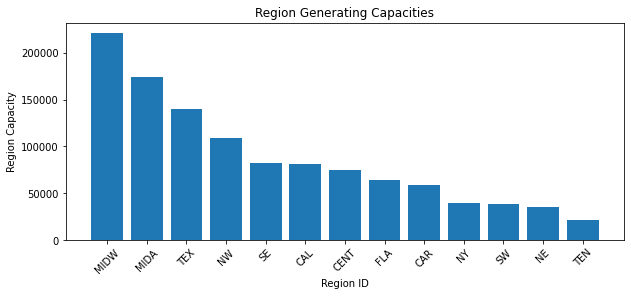

In [ ]:
indices = np.argsort(region_capacities)[::-1]
sorted_IDs = [IDs[i] for i in indices]
sorted_capacities = [region_capacities[i] for i in indices]

plt.figure(figsize=[10,4])
plt.bar(sorted_IDs, sorted_capacities)
plt.xlabel('Region ID')
plt.ylabel('Region Capacity')
plt.title('Region Generating Capacities')
plt.xticks(rotation=45)
plt.show()

In [ ]:
class Node:
    def __init__(self, name, ID, states, distribution, distribution_params, demand, generation, capacity): 
        self.name = name
        self.ID = ID
        self.states = states
        self.distribution = distribution
        self.distribution_params = distribution_params
        self.demand = demand
        self.generation = generation
        self.capacity = capacity
        
    def see_distribution(self):
        print(f"Based on Kolmogorov-Smirnov statistic:")
        print(f"{self.name} node follows -> {self.distribution} distribution")

In [ ]:
IDs = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]

region_names = ['California', 'Carolinas', 'Central','Florida',
                'Mid-Atlantic','Midwest','Northeast','Northwest','New York',
               'Southeast', 'Southwest','Tennessee','Texas']

seasonalDFs = [winterDFs, springDFs, summerDFs, fallDFs]

In [ ]:
'''
CAL_winter_node = Node(region_names[0], # name
                       list(region_states[0].values()), # states
                       CAL_distributions[0][0], # distribution
                       CAL_distributions[0][1], # distribution parameters
                       winter_region_DF.loc[IDs[0]]['Total Demand'], # demand
                       winter_region_DF.loc[IDs[0]]['Total Generation'], # generation
                       region_capacities[0]) 
''' 

#  CAL,"CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX" (0)

CAL_winter_node = Node(region_names[0], 
                       IDs[0],
                       list(region_states[0].values()),
                       CAL_distributions[0][0], 
                       CAL_distributions[0][1], 
                       winter_region_DF.loc['CAL']['Total Demand'],
                       winter_region_DF.loc['CAL']['Total Generation'],
                       region_capacities[0]) 

CAL_spring_node = Node(region_names[0],
                       IDs[0],
                       list(region_states[0].values()),
                       CAL_distributions[1][0],
                       CAL_distributions[1][1],
                       spring_region_DF.loc['CAL']['Total Demand'],
                       spring_region_DF.loc['CAL']['Total Generation'],
                      region_capacities[0]) 

CAL_summer_node = Node(region_names[0], 
                       IDs[0],
                       list(region_states[0].values()), 
                       CAL_distributions[2][0],
                       CAL_distributions[2][1], 
                       summer_region_DF.loc['CAL']['Total Demand'],
                       summer_region_DF.loc['CAL']['Total Generation'],
                       region_capacities[0]) 

CAL_fall_node = Node(region_names[0],
                     IDs[0],
                     list(region_states[0].values()),
                     CAL_distributions[3][0],
                     CAL_distributions[3][1], 
                     fall_region_DF.loc['CAL']['Total Demand'], 
                     fall_region_DF.loc['CAL']['Total Generation'],
                     region_capacities[0])

# "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX" (1)
    
CAR_winter_node = Node(region_names[1],
                       IDs[1],
                       list(region_states[1].values()),
                       CAR_distributions[0][0],
                       CAR_distributions[0][1], 
                       winter_region_DF.loc['CAR']['Total Demand'], 
                       winter_region_DF.loc['CAR']['Total Generation'],
                       region_capacities[1])

CAR_spring_node = Node(region_names[1],
                       IDs[1],
                       list(region_states[1].values()),
                       CAR_distributions[1][0],
                       CAR_distributions[1][1], 
                       spring_region_DF.loc['CAR']['Total Demand'], 
                       spring_region_DF.loc['CAR']['Total Generation'],
                       region_capacities[1])

CAR_summer_node = Node(region_names[1],
                       IDs[1],
                       list(region_states[1].values()),
                       CAR_distributions[2][0],
                       CAR_distributions[2][1], 
                       summer_region_DF.loc['CAR']['Total Demand'], 
                       summer_region_DF.loc['CAR']['Total Generation'],
                       region_capacities[1])

CAR_fall_node = Node(region_names[1],
                     IDs[1],
                       list(region_states[1].values()),
                       CAR_distributions[3][0],
                       CAR_distributions[3][1], 
                       fall_region_DF.loc['CAR']['Total Demand'], 
                       fall_region_DF.loc['CAR']['Total Generation'],
                       region_capacities[1])

# "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX" (2)

CENT_winter_node = Node(region_names[2],
                        IDs[2],
                       list(region_states[2].values()),
                       CENT_distributions[0][0],
                       CENT_distributions[0][1], 
                       winter_region_DF.loc['CENT']['Total Demand'], 
                       winter_region_DF.loc['CENT']['Total Generation'],
                       region_capacities[2])

CENT_spring_node = Node(region_names[2],
                        IDs[2],
                       list(region_states[2].values()),
                       CENT_distributions[1][0],
                       CENT_distributions[1][1], 
                       spring_region_DF.loc['CENT']['Total Demand'], 
                       spring_region_DF.loc['CENT']['Total Generation'],
                       region_capacities[2])

CENT_summer_node = Node(region_names[2],
                        IDs[2],
                       list(region_states[2].values()),
                       CENT_distributions[2][0],
                       CENT_distributions[2][1], 
                       summer_region_DF.loc['CENT']['Total Demand'], 
                       summer_region_DF.loc['CENT']['Total Generation'],
                       region_capacities[2])

CENT_fall_node = Node(region_names[2],
                      IDs[2],
                       list(region_states[2].values()),
                       CENT_distributions[3][0],
                       CENT_distributions[3][1], 
                       fall_region_DF.loc['CENT']['Total Demand'], 
                       fall_region_DF.loc['CENT']['Total Generation'],
                       region_capacities[2])

# FLA, "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX" (3)

FLA_winter_node = Node(region_names[3],
                       IDs[3],
                       list(region_states[3].values()),
                       FLA_distributions[0][0],
                       FLA_distributions[0][1], 
                       winter_region_DF.loc['FLA']['Total Demand'], 
                       winter_region_DF.loc['FLA']['Total Generation'],
                       region_capacities[3])

FLA_spring_node = Node(region_names[3],
                       IDs[3],
                       list(region_states[3].values()),
                       FLA_distributions[1][0],
                       FLA_distributions[1][1], 
                       spring_region_DF.loc['FLA']['Total Demand'], 
                       spring_region_DF.loc['FLA']['Total Generation'],
                       region_capacities[3])

FLA_summer_node = Node(region_names[3],
                       IDs[3],
                       list(region_states[3].values()),
                       FLA_distributions[2][0],
                       FLA_distributions[2][1], 
                       summer_region_DF.loc['FLA']['Total Demand'], 
                       summer_region_DF.loc['FLA']['Total Generation'],
                       region_capacities[3])

FLA_fall_node = Node(region_names[3],
                     IDs[3],
                       list(region_states[3].values()),
                       FLA_distributions[3][0],
                       FLA_distributions[3][1], 
                       fall_region_DF.loc['FLA']['Total Demand'], 
                       fall_region_DF.loc['FLA']['Total Generation'],
                       region_capacities[3])

# MIDA, MIDW, NE, NW, NY, SE, SW, TEN, TEX (4)

MIDA_winter_node = Node(region_names[4],
                        IDs[4],
                       list(region_states[4].values()),
                       MIDA_distributions[0][0],
                       MIDA_distributions[0][1], 
                       winter_region_DF.loc['MIDA']['Total Demand'], 
                       winter_region_DF.loc['MIDA']['Total Generation'],
                       region_capacities[4])

MIDA_spring_node = Node(region_names[4],
                        IDs[4],
                       list(region_states[4].values()),
                       MIDA_distributions[1][0],
                       MIDA_distributions[1][1], 
                       spring_region_DF.loc['MIDA']['Total Demand'], 
                       spring_region_DF.loc['MIDA']['Total Generation'],
                       region_capacities[4])

MIDA_summer_node = Node(region_names[4],
                        IDs[4],
                       list(region_states[4].values()),
                       MIDA_distributions[2][0],
                       MIDA_distributions[2][1], 
                       summer_region_DF.loc['MIDA']['Total Demand'], 
                       summer_region_DF.loc['MIDA']['Total Generation'],
                       region_capacities[4])

MIDA_fall_node = Node(region_names[4],
                      IDs[4],
                       list(region_states[4].values()),
                       MIDA_distributions[3][0],
                       MIDA_distributions[3][1], 
                       fall_region_DF.loc['MIDA']['Total Demand'], 
                       fall_region_DF.loc['MIDA']['Total Generation'],
                       region_capacities[4])

# MIDW, NE, NW, NY, SE, SW, TEN, TEX (5)

MIDW_winter_node = Node(region_names[5],
                        IDs[5],
                       list(region_states[5].values()),
                       MIDA_distributions[0][0],
                       MIDA_distributions[0][1], 
                       winter_region_DF.loc['MIDW']['Total Demand'], 
                       winter_region_DF.loc['MIDW']['Total Generation'],
                       region_capacities[5])

MIDW_spring_node = Node(region_names[5],
                        IDs[5],
                       list(region_states[5].values()),
                       MIDA_distributions[1][0],
                       MIDA_distributions[1][1], 
                       spring_region_DF.loc['MIDW']['Total Demand'], 
                       spring_region_DF.loc['MIDW']['Total Generation'],
                       region_capacities[5])

MIDW_summer_node = Node(region_names[5],
                        IDs[5],
                       list(region_states[5].values()),
                       MIDA_distributions[2][0],
                       MIDA_distributions[2][1], 
                       summer_region_DF.loc['MIDW']['Total Demand'], 
                       summer_region_DF.loc['MIDW']['Total Generation'],
                       region_capacities[5])

MIDW_fall_node = Node(region_names[5],
                      IDs[5],
                       list(region_states[5].values()),
                       MIDA_distributions[3][0],
                       MIDA_distributions[3][1], 
                       fall_region_DF.loc['MIDW']['Total Demand'], 
                       fall_region_DF.loc['MIDW']['Total Generation'],
                       region_capacities[5])

# NE, NW, NY, SE, SW, TEN, TEX (6)

NE_winter_node = Node(region_names[6],
                      IDs[6],
                       list(region_states[6].values()),
                       NE_distributions[0][0],
                       NE_distributions[0][1], 
                       winter_region_DF.loc['NE']['Total Demand'], 
                       winter_region_DF.loc['NE']['Total Generation'],
                       region_capacities[6])

NE_spring_node = Node(region_names[6],
                      IDs[6],
                       list(region_states[6].values()),
                       NE_distributions[1][0],
                       NE_distributions[1][1], 
                       spring_region_DF.loc['NE']['Total Demand'], 
                       spring_region_DF.loc['NE']['Total Generation'],
                       region_capacities[6])

NE_summer_node = Node(region_names[6],
                      IDs[6],
                       list(region_states[6].values()),
                       NE_distributions[2][0],
                       NE_distributions[2][1], 
                       summer_region_DF.loc['NE']['Total Demand'], 
                       summer_region_DF.loc['NE']['Total Generation'],
                       region_capacities[6])

NE_fall_node = Node(region_names[6],
                    IDs[6],
                       list(region_states[6].values()),
                       NE_distributions[3][0],
                       NE_distributions[3][1], 
                       fall_region_DF.loc['NE']['Total Demand'], 
                       fall_region_DF.loc['NE']['Total Generation'],
                       region_capacities[6])

# NW, NY, SE, SW, TEN, TEX (7)

NW_winter_node = Node(region_names[7],
                      IDs[7],
                       list(region_states[7].values()),
                       NW_distributions[0][0],
                       NW_distributions[0][1], 
                       winter_region_DF.loc['NW']['Total Demand'], 
                       winter_region_DF.loc['NW']['Total Generation'],
                       region_capacities[7])

NW_spring_node = Node(region_names[7],
                      IDs[7],
                       list(region_states[7].values()),
                       NW_distributions[1][0],
                       NW_distributions[1][1], 
                       spring_region_DF.loc['NW']['Total Demand'], 
                       spring_region_DF.loc['NW']['Total Generation'],
                       region_capacities[7])

NW_summer_node = Node(region_names[7],
                      IDs[7],
                       list(region_states[7].values()),
                       NW_distributions[2][0],
                       NW_distributions[2][1], 
                       summer_region_DF.loc['NW']['Total Demand'], 
                       summer_region_DF.loc['NW']['Total Generation'],
                       region_capacities[7])

NW_fall_node = Node(region_names[7],
                    IDs[7],
                       list(region_states[7].values()),
                       NW_distributions[3][0],
                       NW_distributions[3][1], 
                       fall_region_DF.loc['NW']['Total Demand'], 
                       fall_region_DF.loc['NW']['Total Generation'],
                       region_capacities[7])

# NY, SE, SW, TEN, TEX (8)

NY_winter_node = Node(region_names[8],
                      IDs[8],
                       list(region_states[8].values()),
                       NY_distributions[0][0],
                       NY_distributions[0][1], 
                       winter_region_DF.loc['NY']['Total Demand'], 
                       winter_region_DF.loc['NY']['Total Generation'],
                       region_capacities[8])

NY_spring_node = Node(region_names[8],
                      IDs[8],
                       list(region_states[8].values()),
                       NY_distributions[1][0],
                       NY_distributions[1][1], 
                       spring_region_DF.loc['NY']['Total Demand'], 
                       spring_region_DF.loc['NY']['Total Generation'],
                       region_capacities[8])

NY_summer_node = Node(region_names[8],
                      IDs[8],
                       list(region_states[8].values()),
                       NY_distributions[2][0],
                       NY_distributions[2][1], 
                       summer_region_DF.loc['NY']['Total Demand'], 
                       summer_region_DF.loc['NY']['Total Generation'],
                       region_capacities[8])

NY_fall_node = Node(region_names[8],
                    IDs[8],
                       list(region_states[8].values()),
                       NY_distributions[3][0],
                       NY_distributions[3][1], 
                       fall_region_DF.loc['NY']['Total Demand'], 
                       fall_region_DF.loc['NY']['Total Generation'],
                       region_capacities[8])

# SE, SW, TEN, TEX (9)

SE_winter_node = Node(region_names[9],
                      IDs[9],
                       list(region_states[9].values()),
                       SE_distributions[0][0],
                       SE_distributions[0][1], 
                       winter_region_DF.loc['SE']['Total Demand'], 
                       winter_region_DF.loc['SE']['Total Generation'],
                       region_capacities[9])

SE_spring_node = Node(region_names[9],
                      IDs[9],
                       list(region_states[9].values()),
                       SE_distributions[1][0],
                       SE_distributions[1][1], 
                       spring_region_DF.loc['SE']['Total Demand'], 
                       spring_region_DF.loc['SE']['Total Generation'],
                       region_capacities[9])

SE_summer_node = Node(region_names[9],
                      IDs[9],
                       list(region_states[9].values()),
                       SE_distributions[2][0],
                       SE_distributions[2][1], 
                       summer_region_DF.loc['SE']['Total Demand'], 
                       summer_region_DF.loc['SE']['Total Generation'],
                       region_capacities[9])

SE_fall_node = Node(region_names[9],
                    IDs[9],
                       list(region_states[9].values()),
                       SE_distributions[3][0],
                       SE_distributions[3][1], 
                       fall_region_DF.loc['SE']['Total Demand'], 
                       fall_region_DF.loc['SE']['Total Generation'],
                       region_capacities[9])

# SW, TEN, TEX (10)

SW_winter_node = Node(region_names[10],
                      IDs[10],
                       list(region_states[10].values()),
                       SW_distributions[0][0],
                       SW_distributions[0][1], 
                       winter_region_DF.loc['SW']['Total Demand'], 
                       winter_region_DF.loc['SW']['Total Generation'],
                       region_capacities[10])

SW_spring_node = Node(region_names[10],
                      IDs[10],
                       list(region_states[10].values()),
                       SW_distributions[1][0],
                       SW_distributions[1][1], 
                       spring_region_DF.loc['SW']['Total Demand'], 
                       spring_region_DF.loc['SW']['Total Generation'],
                       region_capacities[10])

SW_summer_node = Node(region_names[10],
                      IDs[10],
                       list(region_states[10].values()),
                       SW_distributions[2][0],
                       SW_distributions[2][1], 
                       summer_region_DF.loc['SW']['Total Demand'], 
                       summer_region_DF.loc['SW']['Total Generation'],
                       region_capacities[10])

SW_fall_node = Node(region_names[10],
                    IDs[10],
                       list(region_states[10].values()),
                       SW_distributions[3][0],
                       SW_distributions[3][1], 
                       fall_region_DF.loc['SW']['Total Demand'], 
                       fall_region_DF.loc['SW']['Total Generation'],
                       region_capacities[10])

# TEN, TEX (11)

TEN_winter_node = Node(region_names[11],
                       IDs[11],
                       list(region_states[11].values()),
                       TEN_distributions[0][0],
                       TEN_distributions[0][1], 
                       winter_region_DF.loc['TEN']['Total Demand'], 
                       winter_region_DF.loc['TEN']['Total Generation'],
                       region_capacities[11])

TEN_spring_node = Node(region_names[11],
                       IDs[11],
                       list(region_states[11].values()),
                       TEN_distributions[1][0],
                       TEN_distributions[1][1], 
                       spring_region_DF.loc['TEN']['Total Demand'], 
                       spring_region_DF.loc['TEN']['Total Generation'],
                       region_capacities[11])

TEN_summer_node = Node(region_names[11],
                       IDs[11],
                       list(region_states[11].values()),
                       TEN_distributions[2][0],
                       TEN_distributions[2][1], 
                       summer_region_DF.loc['TEN']['Total Demand'], 
                       summer_region_DF.loc['TEN']['Total Generation'],
                       region_capacities[11])

TEN_fall_node = Node(region_names[11],
                     IDs[11],
                       list(region_states[11].values()),
                       TEN_distributions[3][0],
                       TEN_distributions[3][1], 
                       fall_region_DF.loc['TEN']['Total Demand'], 
                       fall_region_DF.loc['TEN']['Total Generation'],
                       region_capacities[11])

# TEX (12)

TEX_winter_node = Node(region_names[12],
                       IDs[12],
                       list(region_states[12].values()),
                       TEX_distributions[0][0],
                       TEX_distributions[0][1], 
                       winter_region_DF.loc['TEX']['Total Demand'], 
                       winter_region_DF.loc['TEX']['Total Generation'],
                       region_capacities[12])

TEX_spring_node = Node(region_names[12],
                       IDs[12],
                       list(region_states[12].values()),
                       TEX_distributions[1][0],
                       TEX_distributions[1][1], 
                       spring_region_DF.loc['TEX']['Total Demand'], 
                       spring_region_DF.loc['TEX']['Total Generation'],
                       region_capacities[12])

TEX_summer_node = Node(region_names[12],
                       IDs[12],
                       list(region_states[12].values()),
                       TEX_distributions[2][0],
                       TEX_distributions[2][1], 
                       summer_region_DF.loc['TEX']['Total Demand'], 
                       summer_region_DF.loc['TEX']['Total Generation'],
                       region_capacities[12])

TEX_fall_node = Node(region_names[12],
                     IDs[12],
                       list(region_states[12].values()),
                       TEX_distributions[3][0],
                       TEX_distributions[3][1], 
                       fall_region_DF.loc['TEX']['Total Demand'], 
                       fall_region_DF.loc['TEX']['Total Generation'],
                       region_capacities[12])

In [ ]:
# # TRATANDO DE HACERLO ELEGANTE (me está dando un error que no debería estar pasando)

# season_region_DFs = [winter_region_DF, spring_region_DF, summer_region_DF, fall_region_DF]

# def get_nodes(season_region_DFs, region_distributions,num):
#     nodes = []
#     for i in range(len(season_region_DFs)):
#         node = Node(region_names[i], # name
#                list(region_states[i].values()), # states
#                region_distributions[i][0], # distribution
#                region_distributions[i][1], # distribution parameters
#                season_region_DFs[i].loc[IDs[i]]['Total Demand'], # demand
#                season_region_DFs[i].loc[IDs[i]]['Total Generation'], # generation
#                region_capacities[num]) #num para que no itere la capacidad de la región que ya se está probando
#         nodes.append(node)
#     return nodes

# CAL_nodes = get_nodes(winter_region_DF, CAL_distributions,0)

In [ ]:
print('Some Examples:')
print(NY_fall_node.distribution_params)
print(CAL_winter_node.demand)
print(FLA_summer_node.generation)

Some Examples:
{'a': 3.016041242388146, 'loc': 320087.9411638033, 'scale': 21059.034156729926}
61978549.0
75550862.0


In [ ]:
region_winter_nodes = [CAL_winter_node, CAR_winter_node , CENT_winter_node, 
                       FLA_winter_node, MIDA_winter_node, MIDW_winter_node, 
                       NE_winter_node , NW_winter_node  , NY_winter_node  , 
                       SE_winter_node , SW_winter_node  , TEN_winter_node , TEX_winter_node]

region_spring_nodes = [CAL_spring_node, CAR_spring_node , CENT_spring_node, 
                       FLA_spring_node, MIDA_spring_node, MIDW_spring_node, 
                       NE_spring_node , NW_spring_node  , NY_spring_node  , 
                       SE_spring_node , SW_spring_node  , TEN_spring_node , TEX_spring_node]

region_summer_nodes = [CAL_summer_node, CAR_summer_node , CENT_summer_node, 
                       FLA_summer_node, MIDA_summer_node, MIDW_summer_node, 
                       NE_summer_node  , NW_summer_node   , NY_summer_node  , 
                       SE_summer_node , SW_summer_node   , TEN_summer_node , TEX_summer_node]

region_fall_nodes = [CAL_fall_node, CAR_fall_node , CENT_fall_node, 
                       FLA_fall_node, MIDA_fall_node, MIDW_fall_node, 
                       NE_fall_node  , NW_fall_node   , NY_fall_node  , 
                       SE_fall_node , SW_fall_node   , TEN_fall_node , TEX_fall_node]

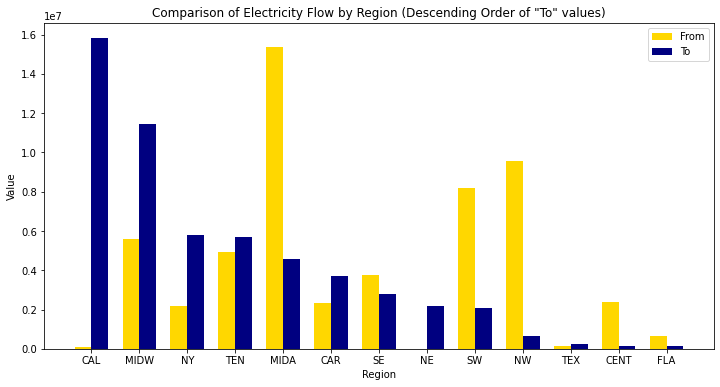

In [ ]:
IDs = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]

# Combine the "From" and "To" data into a single array
data = np.array([all_from_reg, all_to_reg])

# Sort indices based on the "To" values in descending order
sorted_indices = np.argsort(all_to_reg)[::-1] 

# Sort the data and X-axis labels based on the sorted indices
sorted_data = data[:, sorted_indices]
sorted_labels = [IDs[i] for i in sorted_indices]

bar_width = 0.35

x = np.arange(len(sorted_labels))

fig, ax = plt.subplots(figsize=(12, 6))

plt.bar(x, sorted_data[0], width=bar_width, label='From', color='gold')
plt.bar(x + bar_width, sorted_data[1], width=bar_width, label='To', color='navy')

plt.xlabel('Region')
plt.ylabel('Value')
plt.title('Comparison of Electricity Flow by Region (Descending Order of "To" values)')
plt.xticks(x + bar_width/2, sorted_labels)
plt.legend()

plt.show()

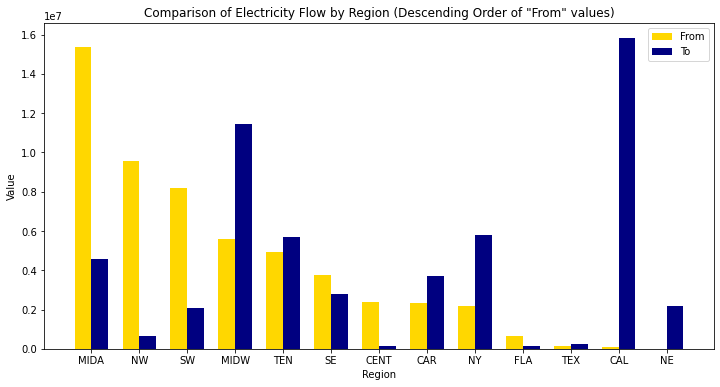

In [ ]:
# Combine the "From" and "To" data into a single array
data = np.array([all_from_reg, all_to_reg])

# Sort indices based on the "From" values in descending order
sorted_indices = np.argsort(all_from_reg)[::-1] 

# Sort the data and X-axis labels based on the sorted indices
sorted_data = data[:, sorted_indices]
sorted_labels = [IDs[i] for i in sorted_indices]

bar_width = 0.35

x = np.arange(len(sorted_labels))

fig, ax = plt.subplots(figsize=(12, 6))

plt.bar(x, sorted_data[0], width=bar_width, label='From', color='gold')
plt.bar(x + bar_width, sorted_data[1], width=bar_width, label='To', color='navy')

plt.xlabel('Region')
plt.ylabel('Value')
plt.title('Comparison of Electricity Flow by Region (Descending Order of "From" values)')
plt.xticks(x + bar_width/2, sorted_labels)
plt.legend()

plt.show()

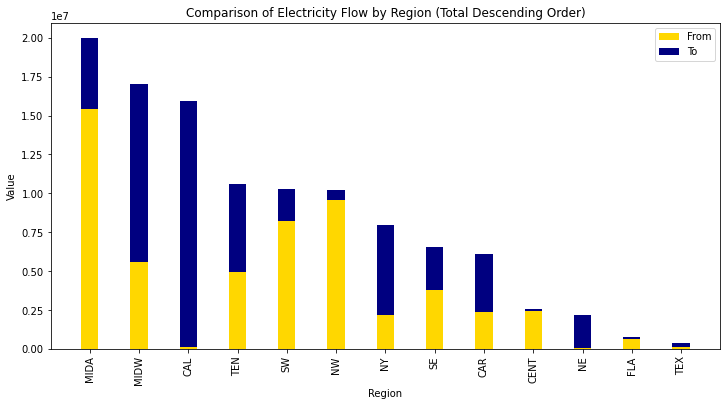

In [ ]:
data = np.array([all_from_reg, all_to_reg])

# sum of "To" values for each region
to_sum = np.sum(data, axis=0)

# Sort the indices based on the sum of "To" values in descending order
sorted_indices = np.argsort(to_sum)[::-1]

# Sort the data and X-axis labels based on the sorted indices
sorted_data = data[:, sorted_indices]
sorted_labels = [IDs[i] for i in sorted_indices]

bar_width = 0.35

x = np.arange(len(sorted_labels))

fig, ax = plt.subplots(figsize=(12, 6))

plt.bar(x, sorted_data[0], width=bar_width, label='From', color='gold')
plt.bar(x, sorted_data[1], width=bar_width, bottom=sorted_data[0], label='To', color='navy')

plt.xlabel('Region')
plt.ylabel('Value')
plt.title('Comparison of Electricity Flow by Region (Total Descending Order)')
plt.xticks(x, sorted_labels, rotation='vertical')
plt.legend()

plt.show()

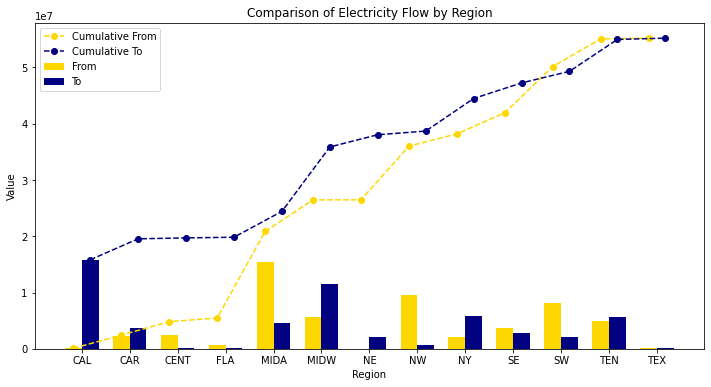

In [ ]:
from_color = 'gold'
to_color = 'navy'

bar_width = 0.35

x = np.arange(len(IDs)) # array of indices for the regions

fig, ax = plt.subplots(figsize=(12, 6))

plt.bar(x, all_from_reg, width=bar_width, label='From', color=from_color)
plt.bar(x + bar_width, all_to_reg, width=bar_width, label='To', color=to_color)


cumulative_from_reg = np.cumsum(all_from_reg)
cumulative_to_reg = np.cumsum(all_to_reg)

plt.plot(x, cumulative_from_reg, color=from_color, marker='o', linestyle='--', label='Cumulative From')
plt.plot(x + bar_width, cumulative_to_reg, color=to_color, marker='o', linestyle='--', label='Cumulative To')

# Add labels, title, and legend
plt.xlabel('Region')
plt.ylabel('Value')
plt.title('Comparison of Electricity Flow by Region')
plt.xticks(x + bar_width / 2, IDs)
plt.legend()

# Display the chart
plt.show()

In [ ]:
print(f"Total froms: {sum(all_from_reg)}")
print(f"Total to: {sum(all_to_reg)}")

Total froms: 55211695.0
Total to: 55211695.0


In [ ]:
# full seasonal from/to flow dfs

display(seasonal_winter_2022.style.set_caption("SEASONAL WINTER 2022 REGION [from/to] flows"))
print("\n" * 5)
display(seasonal_spring_2022.style.set_caption("SEASONAL SPRING 2022 REGION [from/to] flows"))
print("\n" * 5)
display(seasonal_summer_2022.style.set_caption("SEASONAL SUMMER 2022 REGION [from/to] flows"))
print("\n" * 5)
display(seasonal_fall_2022.style.set_caption("SEASONAL FALL 2022 REGION [from/to] flows"))

,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,94005.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,0.000000,0.000000,0.000000,0.000000,2316074.000000,0.000000,0.000000,0.000000,0.000000,11143.000000,0.000000,3966.000000,0.000000
CENT,0.000000,0.000000,0.000000,0.000000,0.000000,1489973.000000,0.000000,549376.000000,0.000000,0.000000,142729.000000,0.000000,220073.000000
FLA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,645701.000000,0.000000,0.000000,0.000000
MIDA,0.000000,168190.000000,0.000000,0.000000,0.000000,9347616.000000,0.000000,0.000000,5779822.000000,0.000000,0.000000,96161.000000,0.000000
MIDW,0.000000,0.000000,32828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1702.000000,0.000000,5569060.000000,0.000000
NE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12195.000000,0.000000,0.000000,0.000000,0.000000
NW,7616912.000000,0.000000,6088.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1918034.000000,0.000000,0.000000
NY,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2173811.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,0.000000,0.000000,0.000000,0.000000,798510.000000,0.000000,0.000000,0.000000,0.000000,80511.000000,0.000000,28645.000000,0.000000
CENT,0.000000,0.000000,0.000000,0.000000,0.000000,3207914.000000,0.000000,616005.000000,0.000000,0.000000,8029.000000,0.000000,465880.000000
FLA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61166.000000,0.000000,0.000000,0.000000
MIDA,0.000000,565226.000000,0.000000,0.000000,0.000000,9922402.000000,0.000000,0.000000,1883226.000000,0.000000,0.000000,38188.000000,0.000000
MIDW,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3839465.000000,0.000000
NE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,594757.000000,0.000000,0.000000,0.000000,0.000000
NW,7669756.000000,0.000000,7687.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2055845.000000,0.000000,0.000000
NY,0.000000,0.000000,0.000000,0.000000,4919.000000,0.000000,166330.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6215.000000,0.000000,0.000000
CAR,0.000000,0.000000,0.000000,0.000000,167374.000000,0.000000,0.000000,0.000000,0.000000,80421.000000,0.000000,3291.000000,0.000000
CENT,0.000000,0.000000,0.000000,0.000000,0.000000,2255879.000000,0.000000,236086.000000,0.000000,0.000000,77032.000000,0.000000,1047630.000000
FLA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MIDA,0.000000,2113062.000000,0.000000,0.000000,0.000000,12158442.000000,0.000000,0.000000,1360465.000000,0.000000,0.000000,229711.000000,0.000000
MIDW,0.000000,0.000000,2925.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10600.000000,0.000000,5657000.000000,0.000000
NE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,365944.000000,0.000000,0.000000,0.000000,0.000000
NW,12046834.000000,0.000000,59571.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2287271.000000,0.000000,0.000000
NY,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,236012.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18653.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,0.000000,0.000000,0.000000,0.000000,907917.000000,0.000000,0.000000,0.000000,0.000000,164058.000000,0.000000,9303.000000,0.000000
CENT,0.000000,0.000000,0.000000,0.000000,0.000000,936189.000000,0.000000,556416.000000,0.000000,0.000000,117367.000000,0.000000,230663.000000
FLA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,44917.000000,0.000000,0.000000,0.000000
MIDA,0.000000,516775.000000,0.000000,0.000000,0.000000,10617136.000000,0.000000,0.000000,1285984.000000,0.000000,0.000000,81649.000000,0.000000
MIDW,0.000000,0.000000,163560.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,62127.000000,0.000000,3667858.000000,0.000000
NE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,566355.000000,0.000000,0.000000,0.000000,0.000000
NW,5813572.000000,0.000000,5452.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1993103.000000,0.000000,0.000000
NY,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,151881.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
# Seasonal Information

display(winter_DF.style.set_caption("WINTER 2022 REGION INFORMATION"))
print("\n\n")
display(spring_DF.style.set_caption("SPRING 2022 REGION INFORMATION"))
print("\n\n")
display(summer_DF.style.set_caption("SUMMER 2022 REGION INFORMATION"))
print("\n\n")
display(fall_DF.style.set_caption("FALL 2022 REGION INFORMATION"))

,Total Generation,Total Demand,Consumed Electricity
From,,,
CAL,44912628.000000,61978549.000000,61012231.000000
CAR,57733201.000000,59115769.000000,59770328.000000
CENT,72250211.000000,70057789.000000,69995361.000000
FLA,48198701.000000,54291130.000000,47676861.000000
MIDA,222901489.000000,215218230.000000,212403561.000000
MIDW,184998980.000000,183942849.000000,189046871.000000
NE,24950503.000000,31092208.000000,31092306.000000
NW,98452833.000000,94707824.000000,90584544.000000
NY,31735258.000000,39023576.000000,39017166.000000


,Total Generation,Total Demand,Consumed Electricity
From,,,
CAL,46703811.000000,61207496.000000,60655786.000000
CAR,49815675.000000,50384524.000000,50915411.000000
CENT,67787236.000000,63679004.000000,63560187.000000
FLA,60194099.000000,60808568.000000,60805471.000000
MIDA,189706350.000000,184033013.000000,180751792.000000
MIDW,157915020.000000,165339009.000000,167865904.000000
NE,22620200.000000,26117437.000000,26117478.000000
NW,89284065.000000,82767061.000000,80017140.000000
NY,29164083.000000,34392378.000000,34385727.000000


,Total Generation,Total Demand,Consumed Electricity
From,,,
CAL,64081370.000000,80818550.000000,80193643.000000
CAR,63625035.000000,65368032.000000,66377179.000000
CENT,87197127.000000,83891239.000000,83738026.000000
FLA,75550862.000000,77131555.000000,77105729.000000
MIDA,236933402.000000,226981462.000000,221967190.000000
MIDW,194848606.000000,201623656.000000,205837295.000000
NE,29157529.000000,33339326.000000,33339481.000000
NW,106429686.000000,96515372.000000,94231949.000000
NY,35612040.000000,44357545.000000,44350860.000000


,Total Generation,Total Demand,Consumed Electricity
From,,,
CAL,55437229.000000,69877167.000000,69302766.000000
CAR,50510588.000000,50840815.000000,51633664.000000
CENT,66779308.000000,65430895.000000,65260500.000000
FLA,62265127.000000,63611232.000000,63594843.000000
MIDA,191529382.000000,184027892.000000,182110885.000000
MIDW,162970325.000000,165348688.000000,170940270.000000
NE,23477772.000000,26375358.000000,26375401.000000
NW,87349290.000000,85677124.000000,79852780.000000
NY,27833025.000000,34907860.000000,34901658.000000


## Balance Authorities

In [ ]:
# BAs = [AEC, AECI, AVA, AVRN, AZPS, BANC, BPAT, CHPD, CISO, CPLE, CPLW, DEAA, DOPD, DUK, EEI, EPE, ERCO, 
#        FMPP, FPC, FPL, GCPD, GLHB, GRID, GRIF, GRMA, GVL, GWA, HGMA, HST, IID, IPCO, ISNE, JEA, LDWP, 
#        LGEE, MISO, NEVP, NSB, NWMT, NYIS, OVEC, PACE, PACW, PGE, PJM, PNM, PSCO, PSEI, SC, SCEG, SCL, 
#        SEC, SEPA, SOCO, SPA, SRP, SWPP, TAL, TEC, TEPC, TIDC, TPWR, TVA, WACM,  WALC, WAUW, WWA, YAD]

# # All the IDs
# IDs = ['AEC', 'AECI', 'AVA', 'AVRN', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'CPLE', 'CPLW', 'DEAA', 'DOPD', 'DUK', 'EEI', 'EPE', 'ERCO', 
#        'FMPP', 'FPC', 'FPL', 'GCPD', 'GLHB', 'GRID', 'GRIF', 'GRMA', 'GVL', 'GWA', 'HGMA', 'HST', 'IID', 'IPCO', 'ISNE', 'JEA', 'LDWP', 
#        'LGEE', 'MISO', 'NEVP', 'NSB', 'NWMT', 'NYIS', 'OVEC', 'PACE', 'PACW', 'PGE', 'PJM', 'PNM', 'PSCO', 'PSEI', 'SC', 'SCEG', 'SCL', 
#        'SEC', 'SEPA', 'SOCO', 'SPA', 'SRP', 'SWPP', 'TAL', 'TEC', 'TEPC', 'TIDC', 'TPWR', 'TVA', 'WACM',  'WALC', 'WAUW', 'WWA', 'YAD']

# Just using the ones with complete 2022 data:
IDs = ['AECI', 'AVA', 'AVRN', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'CPLE', 'CPLW', 'DEAA', 'DOPD', 'DUK', 'EPE', 'ERCO', 
       'FMPP', 'FPC', 'FPL', 'GCPD', 'GRID', 'GRIF', 'GVL', 'GWA', 'HGMA', 'HST', 'IID', 'IPCO', 'ISNE', 'JEA', 'LDWP', 
       'LGEE', 'MISO', 'NEVP', 'NWMT', 'NYIS', 'PACE', 'PACW', 'PGE', 'PJM', 'PNM', 'PSCO', 'PSEI', 'SC', 'SCEG', 'SCL', 
       'SEC', 'SEPA', 'SOCO', 'SPA', 'SRP', 'SWPP', 'TAL', 'TEC', 'TEPC', 'TIDC', 'TPWR', 'TVA', 'WACM',  'WALC', 'WAUW', 'WWA', 'YAD']

ba_dfs = []
for ID in IDs:
    df = pd.read_csv(f"/Users/santiospina/Documents/REU 2023/Daily/{ID} Full D.csv",decimal=',')
    ba_dfs.append(df)

for df in ba_dfs:
    df.rename(columns={"BA": "From"}, inplace=True)
    df.set_index('From', inplace=True)

In [ ]:
# # Incomplete datasets

# for i in range(68):
#     print(f"{i}:{max(ba_dfs[i]['Local date'])}") 

# non = [0, 14, 21, 24, 37, 40] # < 2023 incomplete 2022

# for i in non:
#     print(ba_dfs[i].index[i])
    
# AEC, EEI, GLHB, GRMA, NSB, OVEC

In [ ]:
# # a way I made to locate where the errors were

# for i in range(62):
#     if(ba_dfs[i][ba_dfs[i]['Consumed Electricity'] == "-19,725"]).shape[0] > 0:
#         print(i)

In [ ]:
# These were not formatting in the right way

ba_dfs[14]["D"].replace(',', '', regex=True, inplace=True)
ba_dfs[14]["D"] = ba_dfs[14]["D"].astype(float)
ba_dfs[14]["D"] = ba_dfs[14]["D"] / 1000 

ba_dfs[31]["D"].replace(',', '', regex=True, inplace=True)
ba_dfs[31]["D"] = ba_dfs[31]["D"].astype(float)
ba_dfs[31]["D"] = ba_dfs[31]["D"] / 1000 # 1,771,845 -> 1771.845

ba_dfs[38]["D"].replace(',', '', regex=True, inplace=True)
ba_dfs[38]["D"] = ba_dfs[38]["D"].astype(float)
ba_dfs[38]["D"] = ba_dfs[38]["D"] / 1000 # 2,178,898 -> 2178.898

ba_dfs[50]["D"].replace(',', '', regex=True, inplace=True)
ba_dfs[50]["D"] = ba_dfs[50]["D"].astype(float)
ba_dfs[50]["D"] = ba_dfs[50]["D"] / 1000 # 728,48 -> 728.48

In [ ]:
demand_values = [ba_dfs[i]['D'].mean() for i in range(62)]

fig = go.Figure(data=go.Scatter(x=list(range(62)), y=demand_values, mode='lines'))
fig.update_layout(
    xaxis_title='Index',
    yaxis_title='Mean',
    title='Mean of Demand'
)
fig.show()

# Transformed 14,31,38,50

In [ ]:
# These were not formatting in the right way, so I had to "transform" them in a manual way, but are these ones which are giving the big or weird values 

ba_dfs[2]['Consumed Electricity'].replace(',', '', regex=True, inplace=True)
ba_dfs[2]['Consumed Electricity'] = ba_dfs[2]['Consumed Electricity'].astype(float)
ba_dfs[2]['Consumed Electricity'] = ba_dfs[2]['Consumed Electricity']/100 # Generation only

#Overall weird behavior

ba_dfs[4]['Consumed Electricity'].replace(',', '', regex=True, inplace=True)
ba_dfs[4]['Consumed Electricity'] = ba_dfs[4]['Consumed Electricity'].astype(float)
ba_dfs[4]['Consumed Electricity'] = (ba_dfs[4]['Consumed Electricity'])/10000

# Check this ones too

ba_dfs[14]['Consumed Electricity'].replace(',', '', regex=True, inplace=True)
ba_dfs[14]['Consumed Electricity'] = ba_dfs[14]['Consumed Electricity'].astype(float)
ba_dfs[14]['Consumed Electricity'] = (ba_dfs[14]['Consumed Electricity'])/10000

ba_dfs[31]['Consumed Electricity'].replace(',', '', regex=True, inplace=True)
ba_dfs[31]['Consumed Electricity'] = ba_dfs[31]['Consumed Electricity'].astype(float)
ba_dfs[31]['Consumed Electricity'] = (ba_dfs[31]['Consumed Electricity'])/1000

ba_dfs[38]['Consumed Electricity'].replace(',', '', regex=True, inplace=True)
ba_dfs[38]['Consumed Electricity'] = ba_dfs[38]['Consumed Electricity'].astype(float)
ba_dfs[38]['Consumed Electricity'] = (ba_dfs[38]['Consumed Electricity'])/1000

ba_dfs[50]['Consumed Electricity'].replace(',', '', regex=True, inplace=True)
ba_dfs[50]['Consumed Electricity'] = ba_dfs[50]['Consumed Electricity'].astype(float)
ba_dfs[50]['Consumed Electricity'] = (ba_dfs[50]['Consumed Electricity'])/1000

In [ ]:
mean_values = [ba_dfs[i]['Consumed Electricity'].mean() for i in range(62)]

fig = go.Figure(data=go.Scatter(x=list(range(62)), y=mean_values, mode='lines'))
fig.update_layout(
    xaxis_title='Index',
    yaxis_title='Mean',
    title='Mean of Consumed Electricity'
)
fig.show()

# Transformed 2 (generation only),4,14,31,38,50

In [ ]:
ba_dfs[14]["NG"].replace(',', '', regex=True, inplace=True)
ba_dfs[14]["NG"] = ba_dfs[14]["NG"].astype(float)
ba_dfs[14]["NG"] = ba_dfs[14]["NG"] / 1000 # 1,044,000 -> 1044.000

ba_dfs[31]["NG"].replace(',', '', regex=True, inplace=True)
ba_dfs[31]["NG"] = ba_dfs[31]["NG"].astype(float)
ba_dfs[31]["NG"] = ba_dfs[31]["NG"] / 1000 # 1,676,000 -> 1676.000

ba_dfs[38]["NG"].replace(',', '', regex=True, inplace=True)
ba_dfs[38]["NG"] = ba_dfs[38]["NG"].astype(float)
ba_dfs[38]["NG"] = ba_dfs[38]["NG"] / 1000 # 2,237,000 -> 2237.000

ba_dfs[50]["NG"].replace(',', '', regex=True, inplace=True)
ba_dfs[50]["NG"] = ba_dfs[50]["NG"].astype(float)
ba_dfs[50]["NG"] = ba_dfs[50]["NG"] / 1000 #700,000 -> 700.00

In [ ]:
generation_values = [ba_dfs[i]['NG'].mean() for i in range(62)]

fig = go.Figure(data=go.Scatter(x=list(range(62)), y=generation_values, mode='lines'))
fig.update_layout(
    xaxis_title='Index',
    yaxis_title='Mean',
    title='Mean of Net Generation'
)
fig.show()

# Transformed 14,31,38,50

In [ ]:
# FUNCIONES PARA CERCANIA 

def season_total_generation(df, season, kind):
    
    df['Local date'] = pd.to_datetime(df['Local date'])
    
    if kind.lower() == "ba" or kind.upper() == "BA":

#         df["Consumed Electricity"] = df["Consumed Electricity"].replace(',', '',inplace=True)
        
#         df["NG"] = df["NG"].replace(',', '',inplace=True) # AQUI HAY PROBLEMA, ESTOY DESTRUYENDO LA COLUMNA 
        df["NG"] = df["NG"].astype(float)
        
#         # PROBANDO /\/\/\/\/\/\/\/\/\/\/\/\
        
#         input_string = '3.14%'

#         to_convert = input_string.replace('%', '')

#         converted = float(to_convert)
#         print(converted)
        
        # /\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\

    if season == "winter":
        range1_start = pd.to_datetime('2022-12-01')
        range1_end = pd.to_datetime('2022-12-31')

        range2_start = pd.to_datetime('2022-01-01')
        range2_end = pd.to_datetime('2022-02-28')

        winter_df = df[
            ((df['Local date'] >= range1_start) & (df['Local date'] <= range1_end)) |
            ((df['Local date'] >= range2_start) & (df['Local date'] <= range2_end))
        ]

        winter_NG = winter_df['NG'].sum()
        return winter_NG
    
    elif season == "spring":
        range_start = pd.to_datetime('2022-03-01')
        range_end = pd.to_datetime('2022-05-31')
        
    elif season == "summer":
        range_start = pd.to_datetime('2022-06-01')
        range_end = pd.to_datetime('2022-08-31')
    
    elif season == "fall":
        range_start = pd.to_datetime('2022-09-01')
        range_end = pd.to_datetime('2022-11-30')
    
    season_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
#     season_NG = season_df['Sum (NG)'].sum()
    season_NG = season_df['NG'].sum()
    
    return season_NG

# --------------------------------------------------------------------------------------------------------------------------

def season_rows(df, season,kind):
    
    df['Local date'] = pd.to_datetime(df['Local date'])
    
    if kind.lower() == "ba" or kind.upper() == "BA":
#         df["Consumed Electricity"] = df["Consumed Electricity"].replace(',', '',inplace=True)
        df["Consumed Electricity"] = df["Consumed Electricity"].astype(float)
    
    if season == "winter":
        range1_start = pd.to_datetime('2022-12-01')
        range1_end = pd.to_datetime('2022-12-31')

        range2_start = pd.to_datetime('2022-01-01')
        range2_end = pd.to_datetime('2022-02-28')

        winter_df = df[
            ((df['Local date'] >= range1_start) & (df['Local date'] <= range1_end)) |
            ((df['Local date'] >= range2_start) & (df['Local date'] <= range2_end))]
        return winter_df
    
    elif season == "spring":
        range_start = pd.to_datetime('2022-03-01')
        range_end = pd.to_datetime('2022-05-31')
        
    elif season == "summer":
        range_start = pd.to_datetime('2022-06-01')
        range_end = pd.to_datetime('2022-08-31')
        
    elif season == "fall":
        range_start = pd.to_datetime('2022-09-01')
        range_end = pd.to_datetime('2022-11-30')
        
    season_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    return season_df

# --------------------------------------------------------------------------------------------------------------------------

def season_total_demand(df, season, kind):
    
    df['Local date'] = pd.to_datetime(df['Local date'])
#     df["Consumed Electricity"] = df["Consumed Electricity"].replace(',', '')

    
    if kind.lower() == "ba" or kind.upper() == "BA":
#         df["Consumed Electricity"] = df["Consumed Electricity"].replace(',', '',inplace=True)
        df["Consumed Electricity"] = df["Consumed Electricity"].astype(float)
#         df["D"] = df["D"].replace(',', '',inplace=True) #we will see if replacing by "" or "."
        df["D"] = df["D"].astype(float)
    
    if season == "winter":
        range1_start = pd.to_datetime('2022-12-01')
        range1_end = pd.to_datetime('2022-12-31')

        range2_start = pd.to_datetime('2022-01-01')
        range2_end = pd.to_datetime('2022-02-28')

        winter_df = df[
            ((df['Local date'] >= range1_start) & (df['Local date'] <= range1_end)) |
            ((df['Local date'] >= range2_start) & (df['Local date'] <= range2_end))
        ]

        winter_demand = winter_df['D'].sum()
        return winter_demand
    
    elif season == "spring":
        range_start = pd.to_datetime('2022-03-01')
        range_end = pd.to_datetime('2022-05-31')
        
    elif season == "summer":
        range_start = pd.to_datetime('2022-06-01')
        range_end = pd.to_datetime('2022-08-31')
        
    elif season == "fall":
        range_start = pd.to_datetime('2022-09-01')
        range_end = pd.to_datetime('2022-11-30')
        
    season_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    season_demand = season_df['D'].sum()

    return season_demand

# --------------------------------------------------------------------------------------------------------------------------

def season_consumed_electricity(df, season, kind):
    
    df['Local date'] = pd.to_datetime(df['Local date'])
#     df["Consumed Electricity"] = df["Consumed Electricity"].replace(',', '',inplace=True)
    df["D"] = df["D"].astype(float)

    
    if kind.lower() == "ba" or kind.upper() == "BA":
#         df["Consumed Electricity"] = df["Consumed Electricity"].replace(',', '')
        df["D"] = df["D"].astype(float)
    
    if season == "winter":
        range1_start = pd.to_datetime('2022-12-01')
        range1_end = pd.to_datetime('2022-12-31')

        range2_start = pd.to_datetime('2022-01-01')
        range2_end = pd.to_datetime('2022-02-28')

        winter_df = df[
            ((df['Local date'] >= range1_start) & (df['Local date'] <= range1_end)) |
            ((df['Local date'] >= range2_start) & (df['Local date'] <= range2_end))
        ]

        winter_consumption = winter_df['Consumed Electricity'].sum()

        return winter_consumption
    
    elif season == "spring":
        range_start = pd.to_datetime('2022-03-01')
        range_end = pd.to_datetime('2022-05-31')
        
    elif season == "summer":
        range_start = pd.to_datetime('2022-06-01')
        range_end = pd.to_datetime('2022-08-31')
        
    elif season == "fall":
        range_start = pd.to_datetime('2022-09-01')
        range_end = pd.to_datetime('2022-11-30')
        
    season_df = df[
        ((df['Local date'] >= range_start) & (df['Local date'] <= range_end))
    ]
    
    season_consumption = season_df['Consumed Electricity'].sum()

    return season_consumption

In [ ]:
# daily_IDs = ba_dfs

winterConsumedElectricity = []
springConsumedElectricity = []
summerConsumedElectricity = []
fallConsumedElectricity   = []

winterTotalGenerations = []
springTotalGenerations = []
summerTotalGenerations = []
fallTotalGenerations   = []

winterTotalDemands = []
springTotalDemands = []
summerTotalDemands = []
fallTotalDemands   = []

# for df in daily_IDs:
for df in ba_dfs:
    
    winter_NG = season_total_generation(df,"winter","BA")
    winterTotalGenerations.append(winter_NG)
    
    spring_NG = season_total_generation(df,"spring","BA")
    springTotalGenerations.append(spring_NG)
    
    summer_NG = season_total_generation(df,"summer","BA")
    summerTotalGenerations.append(summer_NG)
    
    fall_NG = season_total_generation(df,"fall","BA")
    fallTotalGenerations.append(fall_NG)
    
    # --------------------------------------------------- 
    
    winter_demand = season_total_demand(df,"winter","BA")
    winterTotalDemands.append(winter_demand)
    
    spring_demand = season_total_demand(df,"spring","BA")
    springTotalDemands.append(spring_demand)
    
    summer_demand = season_total_demand(df,"summer","BA")
    summerTotalDemands.append(summer_demand)
    
    fall_demand = season_total_demand(df,"fall","BA")
    fallTotalDemands.append(fall_demand)
    
    # --------------------------------------------------- 
    
    winter_consumption = season_consumed_electricity(df,"winter","BA")
    winterConsumedElectricity.append(winter_consumption)
    
    spring_consumption = season_consumed_electricity(df,"spring","BA")
    springConsumedElectricity.append(spring_consumption)
    
    summer_consumption = season_consumed_electricity(df,"summer","BA")
    summerConsumedElectricity.append(summer_consumption)
    
    fall_consumption = season_consumed_electricity(df,"fall","BA")
    fallConsumedElectricity.append(fall_consumption)
    
    
winter_DF = pd.DataFrame()
spring_DF = pd.DataFrame()
summer_DF = pd.DataFrame()
fall_DF = pd.DataFrame()

IDs = ['AECI', 'AVA', 'AVRN', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'CPLE', 'CPLW', 'DEAA', 'DOPD', 'DUK', 'EPE', 'ERCO', 
       'FMPP', 'FPC', 'FPL', 'GCPD', 'GRID', 'GRIF', 'GVL', 'GWA', 'HGMA', 'HST', 'IID', 'IPCO', 'ISNE', 'JEA', 'LDWP', 
       'LGEE', 'MISO', 'NEVP', 'NWMT', 'NYIS', 'PACE', 'PACW', 'PGE', 'PJM', 'PNM', 'PSCO', 'PSEI', 'SC', 'SCEG', 'SCL', 
       'SEC', 'SEPA', 'SOCO', 'SPA', 'SRP', 'SWPP', 'TAL', 'TEC', 'TEPC', 'TIDC', 'TPWR', 'TVA', 'WACM',  'WALC', 'WAUW', 'WWA', 'YAD']

winter_DF["From"] = IDs 
winter_DF["Total Generation"] = winterTotalGenerations
winter_DF["Total Demand"] = winterTotalDemands 
winter_DF["Consumed Electricity"] = winterConsumedElectricity
winter_DF.set_index("From", inplace=True)

spring_DF["From"] = IDs 
spring_DF["Total Generation"] = springTotalGenerations
spring_DF["Total Demand"] = springTotalDemands
spring_DF["Consumed Electricity"] = springConsumedElectricity
spring_DF.set_index("From", inplace=True)

summer_DF["From"] = IDs 
summer_DF["Total Generation"] = summerTotalGenerations
summer_DF["Total Demand"] = summerTotalDemands 
summer_DF["Consumed Electricity"] = summerConsumedElectricity
summer_DF.set_index("From", inplace=True)

fall_DF["From"] = IDs 
fall_DF["Total Generation"] = fallTotalGenerations
fall_DF["Total Demand"] = fallTotalDemands 
fall_DF["Consumed Electricity"] = fallConsumedElectricity
fall_DF.set_index("From", inplace=True)

In [ ]:
winter_ba_dfs = []
spring_ba_dfs = []
summer_ba_dfs = []
fall_ba_dfs = []

for df in ba_dfs:
    winter_df = df[(df['Local date'].dt.year == 2022) & ((df['Local date'].dt.month == 12) | (df['Local date'].dt.month.isin([1, 2])))]
    winter_ba_dfs.append(winter_df)
    
    spring_df = df[(df['Local date'].dt.year == 2022) & (df['Local date'].dt.month.isin([3, 4, 5]))]
    spring_ba_dfs.append(spring_df)
    
    summer_df = df[(df['Local date'].dt.year == 2022) & (df['Local date'].dt.month.isin([6, 7, 8]))]
    summer_ba_dfs.append(summer_df)
    
    fall_df = df[(df['Local date'].dt.year == 2022) & (df['Local date'].dt.month.isin([9, 10, 11]))]
    fall_ba_dfs.append(fall_df)
    

In [ ]:
ba_states = ['In process']

bigM = 10000000000

ba_columns = ['AECI', 'AVA', 'AVRN', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'CPLE', 'CPLW', 'DEAA', 'DOPD', 'DUK', 'EPE', 'ERCO',
              'FMPP', 'FPC', 'FPL', 'GCPD', 'GRID', 'GRIF', 'GVL', 'GWA', 'HGMA', 'HST', 'IID', 'IPCO', 'ISNE', 'JEA', 'LDWP',
              'LGEE', 'MISO', 'NEVP', 'NWMT', 'NYIS', 'PACE', 'PACW', 'PGE', 'PJM', 'PNM', 'PSCO', 'PSEI', 'SC', 'SCEG', 'SCL',
              'SEC', 'SEPA', 'SOCO', 'SPA', 'SRP', 'SWPP', 'TAL', 'TEC', 'TEPC', 'TIDC', 'TPWR', 'TVA', 'WACM', 'WALC', 'WAUW',
              'WWA', 'YAD']

ba_names = ['AECI Name', 'AVA Name', 'AVRN', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'CPLE', 'CPLW', 'DEAA', 'DOPD', 'DUK', 'EPE', 'ERCO',
              'FMPP', 'FPC', 'FPL', 'GCPD', 'GRID', 'GRIF', 'GVL', 'GWA', 'HGMA', 'HST', 'IID', 'IPCO', 'ISNE', 'JEA', 'LDWP',
              'LGEE', 'MISO', 'NEVP', 'NWMT', 'NYIS', 'PACE', 'PACW', 'PGE', 'PJM', 'PNM', 'PSCO', 'PSEI', 'SC', 'SCEG', 'SCL',
              'SEC', 'SEPA', 'SOCO', 'SPA', 'SRP', 'SWPP', 'TAL', 'TEC', 'TEPC', 'TIDC', 'TPWR', 'TVA', 'WACM', 'WALC', 'WAUW',
              'WWA', 'YAD']

In [ ]:
AECI_winter_node = Node(ba_names[0],
                       ba_columns[0],
                       list(ba_states[0]), #.values()# changing value
                       ['Distribution in process'],# TEN_distributions[0][0], #
                       ['Distribution params in process'],# TEN_distributions[0][1], #
                       winter_DF.loc['AECI']['Total Demand'], 
                       winter_DF.loc['AECI']['Total Generation'],
                       bigM)

### Energy Flows Balancing Authorities

In [ ]:
IDs = []

for BA in ba_dfs:
    BA_IDs = []
    for i in BA.columns:
        if i in ba_columns:
            BA_IDs.append(i)
    IDs.append(BA_IDs)

In [ ]:
i = 0 
ba_flow_dfs = []

# for df in ba_dfs:
#     df = df[['Local date','Generation only?'] + IDs[i]].copy()
#     ba_flow_dfs.append(df)
#     i += 1
    
for df in ba_dfs:
    df = df[['Local date']+IDs[i]].copy()
    ba_flow_dfs.append(df)
    i += 1

In [ ]:
winter_ba_flows = []
spring_ba_flows = []
summer_ba_flows = []
fall_ba_flows = []

for df in ba_flow_dfs:
    winter_df = winter_rows(df).copy()
    winter_ba_flows.append(winter_df)
    
    spring_df = spring_rows(df).copy()
    spring_ba_flows.append(spring_df)
    
    summer_df = summer_rows(df).copy()
    summer_ba_flows.append(summer_df)

    fall_df = fall_rows(df).copy()
    fall_ba_flows.append(fall_df)

In [ ]:
print(f"Winter: {winter_ba_flows[1].shape[0]}")
print(f"Spring: {spring_ba_flows[1].shape[0]}")
print(f"Summer: {summer_ba_flows[1].shape[0]}")
print(f"Fall: {fall_ba_flows[1].shape[0]}")

Winter: 90
Spring: 92
Summer: 92
Fall: 91


NaNs and negative values -> 0

In [ ]:
for i in range(len(winter_ba_flows)):
    winter_ba_flows[i] = winter_ba_flows[i].fillna(0)
    num = winter_ba_flows[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    spring_ba_flows[i] = spring_ba_flows[i].fillna(0)
    num = spring_ba_flows[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    summer_ba_flows[i] = summer_ba_flows[i].fillna(0)
    num = summer_ba_flows[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    fall_ba_flows[i] = fall_ba_flows[i].fillna(0)
    num = fall_ba_flows[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0

In [ ]:
for i in range(len(daily_winterDFs)):
    daily_winterDFs[i] = daily_winterDFs[i].fillna(0)  #NaN -> 0
    num = daily_winterDFs[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    daily_springDFs[i] = daily_springDFs[i].fillna(0)  #NaN -> 0
    num = daily_springDFs[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    daily_summerDFs[i] = daily_summerDFs[i].fillna(0)  #NaN -> 0
    num = daily_summerDFs[i]._get_numeric_data() #Negative flows -> 0
    num[num < 0] = 0
    
    daily_fallDFs[i] = daily_fallDFs[i].fillna(0)      #NaN -> 0
    num = daily_fallDFs[i]._get_numeric_data()   #Negative flows -> 0
    num[num < 0] = 0

In [ ]:
print("No NAN check:\n")

nan_found = False
for df in winter_ba_flows:
    if df.isna().sum().sum() > 0:
        print(f"There are NaNs at {df.index[0]}")
        nan_found = True

if not nan_found:
    print("No NaNs at winter!")


nan_found = False
for df in spring_ba_flows:
    if df.isna().sum().sum() > 0:
        print(f"There are NaNs at {df.index[0]}")
        nan_found = True

if not nan_found:
    print("No NaNs at spring!")


nan_found = False
for df in summer_ba_flows:
    if df.isna().sum().sum() > 0:
        print(f"There are NaNs at {df.index[0]}")
        nan_found = True

if not nan_found:
    print("No NaNs at summer!")

nan_found = False
for df in fall_ba_flows:
    if df.isna().sum().sum() > 0:
        print(f"There are NaNs at {df.index[0]}")
        nan_found = True

if not nan_found:
    print("No NaNs at fall!")

No NAN check:

No NaNs at winter!
No NaNs at spring!
No NaNs at summer!
No NaNs at fall!


In [ ]:
ba_columns = ['AECI', 'AVA', 'AVRN', 'AZPS', 'BANC', 'BPAT', 'CHPD', 'CISO', 'CPLE', 'CPLW', 'DEAA', 'DOPD', 'DUK', 'EPE', 'ERCO',
              'FMPP', 'FPC', 'FPL', 'GCPD', 'GRID', 'GRIF', 'GVL', 'GWA', 'HGMA', 'HST', 'IID', 'IPCO', 'ISNE', 'JEA', 'LDWP',
              'LGEE', 'MISO', 'NEVP', 'NWMT', 'NYIS', 'PACE', 'PACW', 'PGE', 'PJM', 'PNM', 'PSCO', 'PSEI', 'SC', 'SCEG', 'SCL',
              'SEC', 'SEPA', 'SOCO', 'SPA', 'SRP', 'SWPP', 'TAL', 'TEC', 'TEPC', 'TIDC', 'TPWR', 'TVA', 'WACM', 'WALC', 'WAUW',
              'WWA', 'YAD']

winter_2022_ba_df = pd.DataFrame(columns=ba_columns, index=ba_columns)
winter_2022_ba_df.columns.name = 'To'
winter_2022_ba_df.index.name = 'From'

spring_2022_ba_df = pd.DataFrame(columns=ba_columns, index=ba_columns)
spring_2022_ba_df.columns.name = 'To'
spring_2022_ba_df.index.name = 'From'

summer_2022_ba_df = pd.DataFrame(columns=ba_columns, index=ba_columns)
summer_2022_ba_df.columns.name = 'To'
summer_2022_ba_df.index.name = 'From'

fall_2022_ba_df = pd.DataFrame(columns=ba_columns, index=ba_columns)
fall_2022_ba_df.columns.name = 'To'
fall_2022_ba_df.index.name = 'From'

In [ ]:
winter2022totals = []
spring2022totals = []
summer2022totals = []
fall2022totals = []
    
for i in range(len(winter_ba_flows)):
    
    winter_ba_flows[i] = winter_ba_flows[i].drop('Local date', axis=1)
    winter2022totals.append(winter_ba_flows[i])
    
    spring_ba_flows[i] = spring_ba_flows[i].drop('Local date', axis=1)
    spring2022totals.append(spring_ba_flows[i])
    
    summer_ba_flows[i] = summer_ba_flows[i].drop('Local date', axis=1)
    summer2022totals.append(summer_ba_flows[i])
    
    fall_ba_flows[i] = fall_ba_flows[i].drop('Local date', axis=1)
    fall2022totals.append(fall_ba_flows[i])
    
# For getting the total seasonal flow to each

i = 0
for i in range(len(winter2022totals)):
    
    winter2022totals[i] = winter2022totals[i].groupby(winter2022totals[i].index).sum(numeric_only=True)
    spring2022totals[i] = spring2022totals[i].groupby(spring2022totals[i].index).sum(numeric_only=True)
    summer2022totals[i] = summer2022totals[i].groupby(summer2022totals[i].index).sum(numeric_only=True)
    fall2022totals[i]   = fall2022totals[i].groupby(fall2022totals[i].index).sum(numeric_only=True)
    
    i += 1

# Merge dataframes horizontally

winter2022total = pd.concat(winter2022totals, axis=1)
spring2022total = pd.concat(spring2022totals, axis=1)
summer2022total = pd.concat(summer2022totals, axis=1)
fall2022total = pd.concat(fall2022totals, axis=1)

# Group to totals

winter2022total = winter2022total.groupby(level=0, axis=1).sum()
spring2022total = spring2022total.groupby(level=0, axis=1).sum()
summer2022total = summer2022total.groupby(level=0, axis=1).sum()
fall2022total = fall2022total.groupby(level=0, axis=1).sum()

In [ ]:
winter2022std = []
spring2022std = []
summer2022std = []
fall2022std = []
    
for i in range(len(winter_ba_flows)):
    
    winter_ba_flows[i] = winter_ba_flows[i]
    winter2022std.append(winter_ba_flows[i])
    
    spring_ba_flows[i] = spring_ba_flows[i]
    spring2022std.append(spring_ba_flows[i])
    
    summer_ba_flows[i] = summer_ba_flows[i]
    summer2022std.append(summer_ba_flows[i])
    
    fall_ba_flows[i] = fall_ba_flows[i]
    fall2022std.append(fall_ba_flows[i])
    
# For getting variance to each

i = 0
for i in range(len(winter2022std)):
    
    # winter2022std[i] = winter2022std[i].groupby(winter2022std[i].index).var(numeric_only=True)
    # spring2022std[i] = spring2022std[i].groupby(spring2022std[i].index).var(numeric_only=True)
    # summer2022std[i] = summer2022std[i].groupby(summer2022std[i].index).var(numeric_only=True)
    # fall2022std[i]   = fall2022std[i].groupby(fall2022std[i].index).var(numeric_only=True)
    
    winter2022std[i] = winter2022std[i].groupby(winter2022std[i].index).var()
    spring2022std[i] = spring2022std[i].groupby(spring2022std[i].index).var()
    summer2022std[i] = summer2022std[i].groupby(summer2022std[i].index).var()
    fall2022std[i]   = fall2022std[i].groupby(fall2022std[i].index).var()
    
    i += 1

# Merge dataframes horizontally

winter2022std = pd.concat(winter2022std, axis=1)
spring2022std = pd.concat(spring2022std, axis=1)
summer2022std = pd.concat(summer2022std, axis=1)
fall2022std = pd.concat(fall2022std, axis=1)

# Group to totals

winter2022std = winter2022std.groupby(level=0, axis=1).sum()
spring2022std = spring2022std.groupby(level=0, axis=1).sum()
summer2022std = summer2022std.groupby(level=0, axis=1).sum()
fall2022std = fall2022std.groupby(level=0, axis=1).sum()

In [ ]:
winter2022var = []
spring2022var = []
summer2022var = []
fall2022var = []
    
for i in range(len(winter_ba_flows)):
    
    winter_ba_flows[i] = winter_ba_flows[i]
    winter2022var.append(winter_ba_flows[i])
    
    spring_ba_flows[i] = spring_ba_flows[i]
    spring2022var.append(spring_ba_flows[i])
    
    summer_ba_flows[i] = summer_ba_flows[i]
    summer2022var.append(summer_ba_flows[i])
    
    fall_ba_flows[i] = fall_ba_flows[i]
    fall2022var.append(fall_ba_flows[i])
    
# For getting variance to each

i = 0
for i in range(len(winter2022var)):
    
    # winter2022var[i] = winter2022var[i].groupby(winter2022var[i].index).var(numeric_only=True)
    # spring2022var[i] = spring2022var[i].groupby(spring2022var[i].index).var(numeric_only=True)
    # summer2022var[i] = summer2022var[i].groupby(summer2022var[i].index).var(numeric_only=True)
    # fall2022var[i]   = fall2022var[i].groupby(fall2022var[i].index).var(numeric_only=True)

    winter2022var[i] = winter2022var[i].groupby(winter2022var[i].index).var()
    spring2022var[i] = spring2022var[i].groupby(spring2022var[i].index).var()
    summer2022var[i] = summer2022var[i].groupby(summer2022var[i].index).var()
    fall2022var[i]   = fall2022var[i].groupby(fall2022var[i].index).var()
    
    i += 1

# Merge dataframes horizontally

winter2022var = pd.concat(winter2022var, axis=1)
spring2022var = pd.concat(spring2022var, axis=1)
summer2022var = pd.concat(summer2022var, axis=1)
fall2022var = pd.concat(fall2022var, axis=1)

# Group to totals

winter2022var = winter2022var.groupby(level=0, axis=1).sum()
spring2022var = spring2022var.groupby(level=0, axis=1).sum()
summer2022var = summer2022var.groupby(level=0, axis=1).sum()
fall2022var = fall2022var.groupby(level=0, axis=1).sum()

### Balancing authorities information display:

In [ ]:
display(winter2022total.style.set_caption("FLOWS - SEASONAL WINTER 2022 BALANCING AUTHORITIES [from/to]"))
print('\n\n')
display(spring2022total.style.set_caption("FLOWS - SEASONAL SPRING 2022 BALANCING AUTHORITIES [from/to]"))
print('\n\n')
display(summer2022total.style.set_caption("FLOWS - SEASONAL SUMMER 2022 BALANCING AUTHORITIES [from/to]"))
print('\n\n')
display(fall2022total.style.set_caption("FLOWS - SEASONAL FALL 2022 BALANCING AUTHORITIES [from/to]"))

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2843.768000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1003.534000,0.000000,1984.281000,0.000000,0.000000,0.000000,0.000000,0.000000,503.416000,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2104.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8310.669000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,521.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3531.000000,0.000000,0.000000,7306.025000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,808.158000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2421.073000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6867.000000,0.000000,0.000000,0.000000,1047.105000,0.000000,0.000000,0.000000,0.000000,0.000000,6762.410000,0.000000,0.000000,0.000000,729.445000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4068.445000,0.000000,0.000000,0.000000,1.867000,1871.216000,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,22.761000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,2109.606000,2155.000000,0.000000,2319.232000,0.000000,0.000000,2768.620000,0.000000,0.000000,0.000000,625.467000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,214.975000,550.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9230.674000,0.000000,0.000000,3777.366000,0.000000,0.000000,9032.855000,0.000000,0.000000,0.000000,2799.061000,4274.380000,0.000000,0.000000,0.000000,5885.962000,0.000000,0.000000,2210.471000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,927.929000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,30269.000000,0.000000,0.000000,0.000000,1461.195000,0.000000,0.000000,0.000000,0.000000,0.000000,12357.339000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3135.640000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2835.214000,0.000000,770.024000,0.000000,0.000000,0.000000,0.000000,0.000000,491.013000,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,331.218000,9479.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9467.322000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5449.447000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,387.000000,0.000000,0.000000,6758.873000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7036.164000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1529.857000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,755.755000,0.000000,0.000000,0.000000,0.000000,0.000000,5853.201000,0.000000,0.000000,0.000000,1651.478000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1067.874000,0.000000,0.000000,0.000000,3333.787000,1531.563000,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,1004.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,943.085000,152.000000,0.000000,1926.393000,0.000000,0.000000,2742.323000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1247.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15261.970000,0.000000,0.000000,3419.016000,0.000000,0.000000,9985.440000,822.876000,0.000000,0.000000,2129.701000,3847.386000,0.000000,0.000000,0.000000,4819.325000,0.000000,0.000000,1984.578000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,724.001000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,9691.000000,0.000000,0.000000,0.000000,1450.745000,0.000000,0.000000,0.000000,0.000000,0.000000,12995.226000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2644.988000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,995.000000,0.000000,0.000000,0.000000,0.000000,0.000000,478.723000,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,402.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2317.737000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,525.772000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15057.964000,0.000000,0.000000,1581.348000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4512.541000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1906.043000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1736.141000,0.000000,0.000000,0.000000,0.000000,0.000000,4252.604000,0.000000,0.000000,0.000000,3604.957000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,677.852000,0.000000,0.000000,0.000000,4253.782000,1494.439000,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,1997.075000,0.000000,0.000000,2870.944000,0.000000,0.000000,4277.655000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1278.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4428.885000,0.000000,0.000000,5524.635000,0.000000,0.000000,4541.262000,1240.638000,0.000000,0.000000,3686.653000,4518.287000,0.000000,0.000000,0.000000,4151.522000,0.000000,0.000000,1532.275000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,679.699000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,20437.000000,0.000000,0.000000,0.000000,2000.022000,0.000000,0.000000,0.000000,0.000000,0.000000,5377.783000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3199.711000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7217.599000,0.000000,3365.867000,0.000000,0.000000,0.000000,0.000000,0.000000,386.644000,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1346.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11021.301000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10671.205000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,976.000000,0.000000,0.000000,11274.725000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,808.684000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2139.595000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1810.000000,0.000000,0.000000,0.000000,969.300000,0.000000,0.000000,0.000000,0.000000,0.000000,3521.417000,0.000000,0.000000,0.000000,2339.613000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3655.497000,0.000000,0.000000,0.000000,1194.514000,1838.065000,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,546.333000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,1666.364000,103.000000,0.000000,2130.804000,0.000000,0.000000,2660.367000,0.000000,0.000000,0.000000,385.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3414.173000,244.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1110.444000,0.000000,0.000000,2145.499000,0.000000,0.000000,16873.881000,0.000000,0.000000,0.000000,1499.547000,4070.406000,0.000000,0.000000,0.000000,3976.292000,0.000000,0.000000,1720.506000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,879.188000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,22578.000000,0.000000,0.000000,0.000000,914.311000,0.000000,0.000000,0.000000,0.000000,0.000000,16195.689000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00

In [ ]:
display(winter2022std.style.set_caption("STANDARD DEVIATION - SEASONAL WINTER 2022 BALANCING AUTHORITIES [from/to]"))
print('\n\n')
display(spring2022std.style.set_caption("STANDARD DEVIATION - SEASONAL SPRING 2022 BALANCING AUTHORITIES [from/to]"))
print('\n\n')
display(summer2022std.style.set_caption("STANDARD DEVIATION - SEASONAL SUMMER 2022 BALANCING AUTHORITIES [from/to]"))
print('\n\n')
display(fall2022std.style.set_caption("STANDARD DEVIATION - SEASONAL FALL 2022 BALANCING AUTHORITIES [from/to]"))

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18885.173607,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4555.937671,0.000000,15845.163917,0.000000,0.000000,0.000000,0.000000,0.000000,2.978972,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2766.395006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,55866.324919,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1696.820100,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21200.046067,0.000000,0.000000,45625.389656,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.390390,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,56.485148,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30509.695506,0.000000,0.000000,0.000000,9.708745,0.000000,0.000000,0.000000,0.000000,0.000000,45036.524202,0.000000,0.000000,0.000000,5055.839627,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28597.891394,0.000000,0.000000,0.000000,0.038730,31.106471,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,1.201556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,13.488542,4241.176654,0.000000,6068.835152,0.000000,0.000000,291.529571,0.000000,0.000000,0.000000,4298.245479,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,499.318640,253.156055,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,68886.308872,0.000000,0.000000,7697.402973,0.000000,0.000000,57884.233582,0.000000,0.000000,0.000000,70.390634,16.033459,0.000000,0.000000,0.000000,37.185414,0.000000,0.000000,10.308501,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.186731,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,55898.378152,0.000000,0.000000,0.000000,27.266544,0.000000,0.000000,0.000000,0.000000,0.000000,75920.433483,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20745.848762,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23741.787135,0.000000,5093.709070,0.000000,0.000000,0.000000,0.000000,0.000000,1.936448,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,1126.716976,14215.284639,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,65143.502715,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,35453.473142,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,689.770067,0.000000,0.000000,56620.074368,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18413.209860,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.502802,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.491903,0.000000,0.000000,0.000000,0.000000,0.000000,36392.986769,0.000000,0.000000,0.000000,7909.157173,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5735.595742,0.000000,0.000000,0.000000,21214.937731,28.169521,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,5836.695652,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,17.532057,166.734830,0.000000,972.962131,0.000000,0.000000,230.039138,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,658.821190,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,86252.973422,0.000000,0.000000,2633.603631,0.000000,0.000000,65109.791789,6201.442340,0.000000,0.000000,53.483505,15.296984,0.000000,0.000000,0.000000,38.396386,0.000000,0.000000,6.701005,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.703356,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,31174.006092,0.000000,0.000000,0.000000,17.083268,0.000000,0.000000,0.000000,0.000000,0.000000,74719.145517,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13760.520760,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10761.141304,0.000000,0.000000,0.000000,0.000000,0.000000,0.343049,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,329.927855,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9354.339298,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.367302,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,79059.374594,0.000000,0.000000,10646.703802,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19921.346190,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4420.095981,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4888.579413,0.000000,0.000000,0.000000,0.000000,0.000000,25494.358279,0.000000,0.000000,0.000000,19944.485556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.604324,0.000000,0.000000,0.000000,33517.778918,21.944659,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,60.911307,0.000000,0.000000,36.582003,0.000000,0.000000,151.696536,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,633.768275,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34729.878874,0.000000,0.000000,181.385716,0.000000,0.000000,39288.937590,7023.508242,0.000000,0.000000,91.393310,30.570388,0.000000,0.000000,0.000000,16.685713,0.000000,0.000000,9.629476,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.363126,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,9525.067726,0.000000,0.000000,0.000000,10.890044,0.000000,0.000000,0.000000,0.000000,0.000000,28964.899967,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13929.089004,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,59681.919661,0.000000,29517.225582,0.000000,0.000000,0.000000,0.000000,0.000000,0.721198,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2336.233700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,64466.194921,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,59358.977004,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4791.090354,0.000000,0.000000,72069.996936,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19.782306,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30.413587,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7276.254457,0.000000,0.000000,0.000000,2.577075,0.000000,0.000000,0.000000,0.000000,0.000000,22401.331291,0.000000,0.000000,0.000000,16909.545309,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18138.351935,0.000000,0.000000,0.000000,5768.027846,16.173623,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,3203.878137,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,23.650967,116.582418,0.000000,8205.961645,0.000000,0.000000,220.781012,0.000000,0.000000,0.000000,1282.312821,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25738.382662,100.508425,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3747.391602,0.000000,0.000000,2377.913587,0.000000,0.000000,88434.480214,0.000000,0.000000,0.000000,77.704377,35.165260,0.000000,0.000000,0.000000,92.669952,0.000000,0.000000,14.983668,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.780531,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,27458.476679,0.000000,0.000000,0.000000,8.563801,0.000000,0.000000,0.000000,0.000000,0.000000,91281.027456,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,

In [ ]:
display(winter2022var.style.set_caption("VARIANCE - SEASONAL WINTER 2022 BALANCING AUTHORITIES [from/to]"))
print('\n\n')
display(spring2022var.style.set_caption("VARIANCE - SEASONAL SPRING 2022 BALANCING AUTHORITIES [from/to]"))
print('\n\n')
display(summer2022var.style.set_caption("VARIANCE - SEASONAL SUMMER 2022 BALANCING AUTHORITIES [from/to]"))
print('\n\n')
display(fall2022var.style.set_caption("VARIANCE - SEASONAL FALL 2022 BALANCING AUTHORITIES [from/to]"))

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18885.173607,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4555.937671,0.000000,15845.163917,0.000000,0.000000,0.000000,0.000000,0.000000,2.978972,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2766.395006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,55866.324919,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1696.820100,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21200.046067,0.000000,0.000000,45625.389656,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.390390,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,56.485148,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30509.695506,0.000000,0.000000,0.000000,9.708745,0.000000,0.000000,0.000000,0.000000,0.000000,45036.524202,0.000000,0.000000,0.000000,5055.839627,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28597.891394,0.000000,0.000000,0.000000,0.038730,31.106471,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,1.201556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,13.488542,4241.176654,0.000000,6068.835152,0.000000,0.000000,291.529571,0.000000,0.000000,0.000000,4298.245479,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,499.318640,253.156055,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,68886.308872,0.000000,0.000000,7697.402973,0.000000,0.000000,57884.233582,0.000000,0.000000,0.000000,70.390634,16.033459,0.000000,0.000000,0.000000,37.185414,0.000000,0.000000,10.308501,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.186731,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,55898.378152,0.000000,0.000000,0.000000,27.266544,0.000000,0.000000,0.000000,0.000000,0.000000,75920.433483,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20745.848762,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23741.787135,0.000000,5093.709070,0.000000,0.000000,0.000000,0.000000,0.000000,1.936448,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,1126.716976,14215.284639,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,65143.502715,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,35453.473142,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,689.770067,0.000000,0.000000,56620.074368,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18413.209860,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.502802,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.491903,0.000000,0.000000,0.000000,0.000000,0.000000,36392.986769,0.000000,0.000000,0.000000,7909.157173,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5735.595742,0.000000,0.000000,0.000000,21214.937731,28.169521,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,5836.695652,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,17.532057,166.734830,0.000000,972.962131,0.000000,0.000000,230.039138,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,658.821190,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,86252.973422,0.000000,0.000000,2633.603631,0.000000,0.000000,65109.791789,6201.442340,0.000000,0.000000,53.483505,15.296984,0.000000,0.000000,0.000000,38.396386,0.000000,0.000000,6.701005,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.703356,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,31174.006092,0.000000,0.000000,0.000000,17.083268,0.000000,0.000000,0.000000,0.000000,0.000000,74719.145517,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13760.520760,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10761.141304,0.000000,0.000000,0.000000,0.000000,0.000000,0.343049,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,329.927855,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9354.339298,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.367302,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,79059.374594,0.000000,0.000000,10646.703802,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19921.346190,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4420.095981,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4888.579413,0.000000,0.000000,0.000000,0.000000,0.000000,25494.358279,0.000000,0.000000,0.000000,19944.485556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.604324,0.000000,0.000000,0.000000,33517.778918,21.944659,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,60.911307,0.000000,0.000000,36.582003,0.000000,0.000000,151.696536,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,633.768275,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34729.878874,0.000000,0.000000,181.385716,0.000000,0.000000,39288.937590,7023.508242,0.000000,0.000000,91.393310,30.570388,0.000000,0.000000,0.000000,16.685713,0.000000,0.000000,9.629476,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.363126,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,9525.067726,0.000000,0.000000,0.000000,10.890044,0.000000,0.000000,0.000000,0.000000,0.000000,28964.899967,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13929.089004,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,59681.919661,0.000000,29517.225582,0.000000,0.000000,0.000000,0.000000,0.000000,0.721198,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2336.233700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,64466.194921,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,59358.977004,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4791.090354,0.000000,0.000000,72069.996936,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19.782306,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30.413587,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7276.254457,0.000000,0.000000,0.000000,2.577075,0.000000,0.000000,0.000000,0.000000,0.000000,22401.331291,0.000000,0.000000,0.000000,16909.545309,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18138.351935,0.000000,0.000000,0.000000,5768.027846,16.173623,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,3203.878137,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,23.650967,116.582418,0.000000,8205.961645,0.000000,0.000000,220.781012,0.000000,0.000000,0.000000,1282.312821,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25738.382662,100.508425,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3747.391602,0.000000,0.000000,2377.913587,0.000000,0.000000,88434.480214,0.000000,0.000000,0.000000,77.704377,35.165260,0.000000,0.000000,0.000000,92.669952,0.000000,0.000000,14.983668,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.780531,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,27458.476679,0.000000,0.000000,0.000000,8.563801,0.000000,0.000000,0.000000,0.000000,0.000000,91281.027456,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,

In [ ]:
winter_DF['Total Generation'][winter_DF['Total Generation'] < 0] = 0
spring_DF['Total Generation'][spring_DF['Total Generation'] < 0] = 0
summer_DF['Total Generation'][summer_DF['Total Generation'] < 0] = 0
fall_DF['Total Generation'][fall_DF['Total Generation'] < 0] = 0

In [ ]:
display(winter_DF.style.set_caption("WINTER 2022 BALANCING AUTHORITIES INFORMATION"))
print("\n\n")
display(spring_DF.style.set_caption("SPRING 2022 BALANCING AUTHORITIES INFORMATION"))
print("\n\n")
display(summer_DF.style.set_caption("SUMMER 2022 BALANCING AUTHORITIES INFORMATION"))
print("\n\n")
display(fall_DF.style.set_caption("FALL 2022 BALANCING AUTHORITIES INFORMATION"))

,Total Generation,Total Demand,Consumed Electricity
From,,,
AECI,7290.398000,7457.872000,7457.868000
AVA,1897.655000,3737.944000,3737.937000
AVRN,1439.229000,0.000000,31.620000
AZPS,4858.558000,6550.752000,6550.752000
BANC,2799.919000,4018.485000,401.278900
BPAT,26389.627000,16555.800000,7701.927000
CHPD,2590.573000,723.632000,723.647000
CISO,35627.648000,50824.555000,49875.968000
CPLE,16778.071000,16656.666000,16663.163000


,Total Generation,Total Demand,Consumed Electricity
From,,,
AECI,5211.394000,5452.932000,5450.429000
AVA,2499.841000,3014.647000,3015.501000
AVRN,2280.067000,0.000000,8.080000
AZPS,4448.608000,6863.986000,6863.979000
BANC,2267.659000,3770.675000,369.515800
BPAT,22771.953000,13936.139000,5936.382000
CHPD,2320.559000,419.915000,419.915000
CISO,37796.417000,49555.528000,49043.880000
CPLE,14302.648000,13535.270000,13393.288000


,Total Generation,Total Demand,Consumed Electricity
From,,,
AECI,6035.566000,6905.598000,6905.584000
AVA,2281.799000,3215.548000,3216.950000
AVRN,1401.054000,0.000000,-40.140000
AZPS,6167.435000,10800.898000,10800.898000
BANC,2909.618000,5362.317000,536.134500
BPAT,29510.485000,14258.272000,7127.171000
CHPD,2790.975000,403.698000,401.200000
CISO,52040.119000,65734.840000,65111.181000
CPLE,18039.012000,18082.669000,18084.271000


,Total Generation,Total Demand,Consumed Electricity
From,,,
AECI,6061.315000,5557.339000,5557.307000
AVA,1816.873000,3099.772000,3099.772000
AVRN,1319.429000,0.000000,-28.570000
AZPS,5836.048000,7803.653000,7803.653000
BANC,2536.492000,4313.904000,431.399100
BPAT,19547.067000,13580.791000,4311.836000
CHPD,1765.000000,451.899000,451.899000
CISO,44671.885000,57547.540000,56974.654000
CPLE,13509.935000,13664.240000,13686.265000


In [ ]:
display(winter2022total.style.set_caption("SEASONAL WINTER 2022 BA [from/to] flows"))
print('\n\n')
display(spring2022total.style.set_caption("SEASONAL SPRING 2022 BA [from/to] flows"))
print('\n\n')
display(summer2022total.style.set_caption("SEASONAL SUMMER 2022 BA [from/to] flows"))
print('\n\n')
display(fall2022total.style.set_caption("SEASONAL FALL 2022 BA [from/to] flows"))

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2843.768000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1003.534000,0.000000,1984.281000,0.000000,0.000000,0.000000,0.000000,0.000000,503.416000,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2104.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8310.669000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,521.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3531.000000,0.000000,0.000000,7306.025000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,808.158000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2421.073000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6867.000000,0.000000,0.000000,0.000000,1047.105000,0.000000,0.000000,0.000000,0.000000,0.000000,6762.410000,0.000000,0.000000,0.000000,729.445000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4068.445000,0.000000,0.000000,0.000000,1.867000,1871.216000,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,22.761000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,2109.606000,2155.000000,0.000000,2319.232000,0.000000,0.000000,2768.620000,0.000000,0.000000,0.000000,625.467000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,214.975000,550.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9230.674000,0.000000,0.000000,3777.366000,0.000000,0.000000,9032.855000,0.000000,0.000000,0.000000,2799.061000,4274.380000,0.000000,0.000000,0.000000,5885.962000,0.000000,0.000000,2210.471000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,927.929000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,30269.000000,0.000000,0.000000,0.000000,1461.195000,0.000000,0.000000,0.000000,0.000000,0.000000,12357.339000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3135.640000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2835.214000,0.000000,770.024000,0.000000,0.000000,0.000000,0.000000,0.000000,491.013000,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,331.218000,9479.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9467.322000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5449.447000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,387.000000,0.000000,0.000000,6758.873000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7036.164000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1529.857000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,755.755000,0.000000,0.000000,0.000000,0.000000,0.000000,5853.201000,0.000000,0.000000,0.000000,1651.478000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1067.874000,0.000000,0.000000,0.000000,3333.787000,1531.563000,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,1004.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,943.085000,152.000000,0.000000,1926.393000,0.000000,0.000000,2742.323000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1247.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15261.970000,0.000000,0.000000,3419.016000,0.000000,0.000000,9985.440000,822.876000,0.000000,0.000000,2129.701000,3847.386000,0.000000,0.000000,0.000000,4819.325000,0.000000,0.000000,1984.578000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,724.001000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,9691.000000,0.000000,0.000000,0.000000,1450.745000,0.000000,0.000000,0.000000,0.000000,0.000000,12995.226000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2644.988000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,995.000000,0.000000,0.000000,0.000000,0.000000,0.000000,478.723000,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,402.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2317.737000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,525.772000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15057.964000,0.000000,0.000000,1581.348000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4512.541000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1906.043000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1736.141000,0.000000,0.000000,0.000000,0.000000,0.000000,4252.604000,0.000000,0.000000,0.000000,3604.957000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,677.852000,0.000000,0.000000,0.000000,4253.782000,1494.439000,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,1997.075000,0.000000,0.000000,2870.944000,0.000000,0.000000,4277.655000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1278.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4428.885000,0.000000,0.000000,5524.635000,0.000000,0.000000,4541.262000,1240.638000,0.000000,0.000000,3686.653000,4518.287000,0.000000,0.000000,0.000000,4151.522000,0.000000,0.000000,1532.275000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,679.699000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,20437.000000,0.000000,0.000000,0.000000,2000.022000,0.000000,0.000000,0.000000,0.000000,0.000000,5377.783000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

,AECI,AVA,AVRN,AZPS,BANC,BPAT,CHPD,CISO,CPLE,CPLW,DEAA,DOPD,DUK,EPE,ERCO,FMPP,FPC,FPL,GCPD,GRID,GRIF,GVL,GWA,HGMA,HST,IID,IPCO,ISNE,JEA,LDWP,LGEE,MISO,NEVP,NWMT,NYIS,PACE,PACW,PGE,PJM,PNM,PSCO,PSEI,SC,SCEG,SCL,SEC,SEPA,SOCO,SPA,SRP,SWPP,TAL,TEC,TEPC,TIDC,TPWR,TVA,WACM,WALC,WAUW,WWA,YAD
From,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
AECI,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3199.711000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7217.599000,0.000000,3365.867000,0.000000,0.000000,0.000000,0.000000,0.000000,386.644000,0.000000,0.000000,0.000000,0.000000,0.000000
AVA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1346.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11021.301000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10671.205000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,976.000000,0.000000,0.000000,11274.725000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AVRN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,808.684000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AZPS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2139.595000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1810.000000,0.000000,0.000000,0.000000,969.300000,0.000000,0.000000,0.000000,0.000000,0.000000,3521.417000,0.000000,0.000000,0.000000,2339.613000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3655.497000,0.000000,0.000000,0.000000,1194.514000,1838.065000,0.000000,0.000000,0.000000
BANC,0.000000,0.000000,0.000000,0.000000,0.000000,546.333000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BPAT,0.000000,1666.364000,103.000000,0.000000,2130.804000,0.000000,0.000000,2660.367000,0.000000,0.000000,0.000000,385.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3414.173000,244.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1110.444000,0.000000,0.000000,2145.499000,0.000000,0.000000,16873.881000,0.000000,0.000000,0.000000,1499.547000,4070.406000,0.000000,0.000000,0.000000,3976.292000,0.000000,0.000000,1720.506000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,879.188000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CHPD,0.000000,22578.000000,0.000000,0.000000,0.000000,914.311000,0.000000,0.000000,0.000000,0.000000,0.000000,16195.689000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00

## Standard Deviation and Variance

In [ ]:
def variance_matrix(df):
    daily_variance_season2022 = df.drop(columns=['Local date'])
    # daily_variance_season2022 = daily_variance_season2022.groupby(daily_variance_season2022.index).var(numeric_only=True)
    daily_variance_season2022 = daily_variance_season2022.groupby(daily_variance_season2022.index).var()
    return daily_variance_season2022

def standard_deviation_matrix(df):
    daily_variance_season2022 = df.drop(columns=['Local date'])
    # daily_variance_season2022 = daily_variance_season2022.groupby(daily_variance_season2022.index).std(numeric_only=True)
    daily_variance_season2022 = daily_variance_season2022.groupby(daily_variance_season2022.index).std()
    return daily_variance_season2022

In [ ]:
variance_winter2022 = variance_matrix(daily_winter2022)
variance_spring2022 = variance_matrix(daily_spring2022)
variance_summer2022 = variance_matrix(daily_summer2022)
variance_fall2022 = variance_matrix(daily_fall2022)

std_winter2022 = standard_deviation_matrix(daily_winter2022)
std_spring2022 = standard_deviation_matrix(daily_spring2022)
std_summer2022 = standard_deviation_matrix(daily_summer2022)
std_fall2022 = standard_deviation_matrix(daily_fall2022)

In [ ]:
# Information Display

display(seasonal_winter_2022.style.set_caption("TOTAL FLOWS [from/to] Seasonal Winter 2022 Regional"))
print('\n\n')
display(std_winter2022.style.set_caption("STANDARD DEVIATION [from/to] Seasonal Winter 2022 Regional"))
print('\n\n')
display(variance_winter2022.style.set_caption("VARIANCE [from/to] Seasonal Winter 2022 Regional"))

display(seasonal_spring_2022.style.set_caption("TOTAL FLOWS [from/to] Seasonal Spring 2022 Regional"))
print('\n\n')
display(std_spring2022.style.set_caption("STANDARD DEVIATION [from/to] Seasonal Spring 2022 Regional"))
print('\n\n')
display(variance_spring2022.style.set_caption("VARIANCE [from/to] Seasonal Spring 2022 Regional"))

display(seasonal_summer_2022.style.set_caption("TOTAL FLOWS [from/to] Seasonal Summer 2022 Regional"))
print('\n\n')
display(std_summer2022.style.set_caption("STANDARD DEVIATION [from/to] Seasonal Summer 2022 Regional"))
print('\n\n')
display(variance_summer2022.style.set_caption("VARIANCE [from/to] Seasonal Summer 2022 Regional"))

display(seasonal_fall_2022.style.set_caption("TOTAL FLOWS [from/to] Seasonal Fall 2022 Regional"))
print('\n\n')
display(std_fall2022.style.set_caption("STANDARD DEVIATION [from/to] Seasonal Fall 2022 Regional"))
print('\n\n')
display(variance_fall2022.style.set_caption("VARIANCE [from/to] Seasonal Fall 2022 Regional"))
    

,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,94005.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,0.000000,0.000000,0.000000,0.000000,2316074.000000,0.000000,0.000000,0.000000,0.000000,11143.000000,0.000000,3966.000000,0.000000
CENT,0.000000,0.000000,0.000000,0.000000,0.000000,1489973.000000,0.000000,549376.000000,0.000000,0.000000,142729.000000,0.000000,220073.000000
FLA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,645701.000000,0.000000,0.000000,0.000000
MIDA,0.000000,168190.000000,0.000000,0.000000,0.000000,9347616.000000,0.000000,0.000000,5779822.000000,0.000000,0.000000,96161.000000,0.000000
MIDW,0.000000,0.000000,32828.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1702.000000,0.000000,5569060.000000,0.000000
NE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12195.000000,0.000000,0.000000,0.000000,0.000000
NW,7616912.000000,0.000000,6088.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1918034.000000,0.000000,0.000000
NY,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2173811.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,
CAL,39139.548304,68132.047502,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4904.015397,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,96791.495308,85033.712805,0.000000,0.000000,0.000000,0.000000,10631.793656,0.000000,0.000000,0.000000,0.000000,861.379412,0.000000,224.460792,0.000000
CENT,69699.846782,67358.205331,0.000000,0.000000,0.000000,0.000000,0.000000,10808.605033,0.000000,4113.514516,0.000000,0.000000,2225.952637,0.000000,3647.962243
FLA,64748.489029,151663.728379,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6597.870832,0.000000,0.000000,0.000000
MIDA,211660.195278,198744.398014,0.000000,8171.818093,0.000000,0.000000,0.000000,68217.332299,0.000000,0.000000,34486.106418,0.000000,0.000000,6516.173907,0.000000
MIDW,156433.069102,182451.358846,0.000000,0.000000,2056.087576,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,150.127784,0.000000,18688.675330,0.000000
NE,25759.622057,26154.780704,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,928.965684,0.000000,0.000000,0.000000,0.000000
NW,70624.198206,57897.946820,50991.044520,0.000000,378.647632,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7551.531654,0.000000,0.000000
NY,27124.340835,29586.501379,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11155.633670,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,
CAL,1531904241.441820,4641975896.857553,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24049367.016854,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,9368593563.951189,7230732313.325839,0.000000,0.000000,0.000000,0.000000,113035036.335081,0.000000,0.000000,0.000000,0.000000,741974.492010,0.000000,50382.647191,0.000000
CENT,4858068641.389386,4537127825.448193,0.000000,0.000000,0.000000,0.000000,0.000000,116825942.754182,0.000000,16921001.675905,0.000000,0.000000,4954865.142197,0.000000,13307628.529463
FLA,4192366831.523097,23001886505.808872,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,43531899.509238,0.000000,0.000000,0.000000
MIDA,44800038265.033707,39499335742.062996,0.000000,66778610.938826,0.000000,0.000000,0.000000,4653604425.950559,0.000000,0.000000,1189291535.849688,0.000000,0.000000,42460522.385643,0.000000
MIDW,24471305108.742691,33288498344.726101,0.000000,0.000000,4227496.119351,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22538.351561,0.000000,349266585.575530,0.000000
NE,663558128.538827,684072553.663546,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,862977.241573,0.000000,0.000000,0.000000,0.000000
NW,4987777372.222718,3352172245.987644,2600086621.287889,0.000000,143374.029463,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,57025630.320100,0.000000,0.000000
NY,735729865.758302,875361063.870785,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,124448162.587890,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,0.000000,0.000000,0.000000,0.000000,798510.000000,0.000000,0.000000,0.000000,0.000000,80511.000000,0.000000,28645.000000,0.000000
CENT,0.000000,0.000000,0.000000,0.000000,0.000000,3207914.000000,0.000000,616005.000000,0.000000,0.000000,8029.000000,0.000000,465880.000000
FLA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61166.000000,0.000000,0.000000,0.000000
MIDA,0.000000,565226.000000,0.000000,0.000000,0.000000,9922402.000000,0.000000,0.000000,1883226.000000,0.000000,0.000000,38188.000000,0.000000
MIDW,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3839465.000000,0.000000
NE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,594757.000000,0.000000,0.000000,0.000000,0.000000
NW,7669756.000000,0.000000,7687.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2055845.000000,0.000000,0.000000
NY,0.000000,0.000000,0.000000,0.000000,4919.000000,0.000000,166330.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,
CAL,51335.285944,52466.439323,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,54815.288495,48199.257418,0.000000,0.000000,0.000000,0.000000,9027.622331,0.000000,0.000000,0.000000,0.000000,2440.097300,0.000000,577.532751,0.000000
CENT,59008.484219,58543.372050,0.000000,0.000000,0.000000,0.000000,0.000000,13197.673528,0.000000,4073.544998,0.000000,0.000000,294.578526,0.000000,4283.710061
FLA,75089.364127,70667.992332,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1651.888110,0.000000,0.000000,0.000000
MIDA,160912.477590,168473.304827,0.000000,12759.570112,0.000000,0.000000,0.000000,51300.691189,0.000000,0.000000,30027.203121,0.000000,0.000000,1952.510993,0.000000
MIDW,123034.555752,126075.549656,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16348.056863,0.000000
NE,26026.486582,24458.893303,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5857.879956,0.000000,0.000000,0.000000,0.000000
NW,47112.881705,68793.996904,39139.379901,0.000000,429.534078,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7130.707180,0.000000,0.000000
NY,29950.009629,28305.157689,0.000000,0.000000,0.000000,0.000000,441.120438,0.000000,4722.851055,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,
CAL,2635311582.905878,2752727255.281890,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,3004715852.839938,2323168415.681197,0.000000,0.000000,0.000000,0.000000,81497964.954133,0.000000,0.000000,0.000000,0.000000,5954074.831701,0.000000,333544.078715,0.000000
CENT,3482001209.838515,3427326410.987457,0.000000,0.000000,0.000000,0.000000,0.000000,174178586.543239,0.000000,16593768.846990,0.000000,0.000000,86776.507764,0.000000,18350171.882465
FLA,5638412604.961274,4993965140.274593,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2728734.328237,0.000000,0.000000,0.000000
MIDA,25892825444.071999,28383254439.167271,0.000000,162806629.436694,0.000000,0.000000,0.000000,2631760916.466792,0.000000,0.000000,901632927.251314,0.000000,0.000000,3812299.179169,0.000000
MIDW,15137501909.001802,15895044220.955931,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,267258963.207238,0.000000
NE,677378003.778667,598237461.616221,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34314757.574176,0.000000,0.000000,0.000000,0.000000
NW,2219623622.537390,4732614009.986030,1531891059.003344,0.000000,184499.524486,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50846984.891902,0.000000,0.000000
NY,897003076.796465,801181951.776397,0.000000,0.000000,0.000000,0.000000,194587.240683,0.000000,22305322.083612,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6215.000000,0.000000,0.000000
CAR,0.000000,0.000000,0.000000,0.000000,167374.000000,0.000000,0.000000,0.000000,0.000000,80421.000000,0.000000,3291.000000,0.000000
CENT,0.000000,0.000000,0.000000,0.000000,0.000000,2255879.000000,0.000000,236086.000000,0.000000,0.000000,77032.000000,0.000000,1047630.000000
FLA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MIDA,0.000000,2113062.000000,0.000000,0.000000,0.000000,12158442.000000,0.000000,0.000000,1360465.000000,0.000000,0.000000,229711.000000,0.000000
MIDW,0.000000,0.000000,2925.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10600.000000,0.000000,5657000.000000,0.000000
NE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,365944.000000,0.000000,0.000000,0.000000,0.000000
NW,12046834.000000,0.000000,59571.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2287271.000000,0.000000,0.000000
NY,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,236012.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,
CAL,82373.695433,85722.549280,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,647.958542,0.000000,0.000000
CAR,61849.248044,53387.052051,0.000000,0.000000,0.000000,0.000000,3359.613401,0.000000,0.000000,0.000000,0.000000,2211.750187,0.000000,153.570695,0.000000
CENT,83061.336742,82198.206742,0.000000,0.000000,0.000000,0.000000,0.000000,11741.451488,0.000000,2745.045407,0.000000,0.000000,1034.278532,0.000000,4578.821170
FLA,55755.717560,50297.723364,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MIDA,252750.596984,243299.337248,0.000000,19306.334245,0.000000,0.000000,0.000000,51321.968311,0.000000,0.000000,15842.063054,0.000000,0.000000,4593.656583,0.000000
MIDW,176001.320805,201990.156999,0.000000,0.000000,217.662938,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,595.647341,0.000000,18344.429899,0.000000
NE,58503.489108,50832.973005,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4152.552173,0.000000,0.000000,0.000000,0.000000
NW,80354.855710,64097.089925,27346.636738,0.000000,1477.312287,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5675.836149,0.000000,0.000000
NY,62905.993606,56702.010377,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4921.763852,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,
CAL,6785425699.285731,7348355455.013399,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,419850.271739,0.000000,0.000000
CAR,3825329483.662681,2850177326.655043,0.000000,0.000000,0.000000,0.000000,11287002.204969,0.000000,0.000000,0.000000,0.000000,4891838.891902,0.000000,23583.958313,0.000000
CENT,6899185661.374459,6756545191.645494,0.000000,0.000000,0.000000,0.000000,0.000000,137861683.038103,0.000000,7535274.284281,0.000000,0.000000,1069732.082179,0.000000,20965603.303870
FLA,3108700040.669254,2529860975.628646,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MIDA,63882864275.521782,59194567505.497963,0.000000,372734541.995700,0.000000,0.000000,0.000000,2633944431.296227,0.000000,0.000000,250970961.808290,0.000000,0.000000,21101680.803989,0.000000
MIDW,30976464925.131435,40800023524.644501,0.000000,0.000000,47377.154682,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,354795.754419,0.000000,336518108.312470,0.000000
NE,3422658237.867661,2583991144.570943,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17243689.548017,0.000000,0.000000,0.000000,0.000000
NW,6456902836.246543,4108436936.841241,747838540.877688,0.000000,2182451.593287,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,32215115.990803,0.000000,0.000000
NY,3957164031.496776,3215117980.808886,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24223759.416149,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18653.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,0.000000,0.000000,0.000000,0.000000,907917.000000,0.000000,0.000000,0.000000,0.000000,164058.000000,0.000000,9303.000000,0.000000
CENT,0.000000,0.000000,0.000000,0.000000,0.000000,936189.000000,0.000000,556416.000000,0.000000,0.000000,117367.000000,0.000000,230663.000000
FLA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,44917.000000,0.000000,0.000000,0.000000
MIDA,0.000000,516775.000000,0.000000,0.000000,0.000000,10617136.000000,0.000000,0.000000,1285984.000000,0.000000,0.000000,81649.000000,0.000000
MIDW,0.000000,0.000000,163560.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,62127.000000,0.000000,3667858.000000,0.000000
NE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,566355.000000,0.000000,0.000000,0.000000,0.000000
NW,5813572.000000,0.000000,5452.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1993103.000000,0.000000,0.000000
NY,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,151881.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,
CAL,135830.266977,111543.055301,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1485.117765,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,67732.207177,60480.984903,0.000000,0.000000,0.000000,0.000000,11070.464656,0.000000,0.000000,0.000000,0.000000,3639.679108,0.000000,308.184291,0.000000
CENT,72674.060181,77477.168561,0.000000,0.000000,0.000000,0.000000,0.000000,9628.991207,0.000000,3111.895786,0.000000,0.000000,1132.185110,0.000000,3069.960475
FLA,90331.048536,82405.128174,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2089.068330,0.000000,0.000000,0.000000
MIDA,196219.122210,211491.862429,0.000000,10739.589068,0.000000,0.000000,0.000000,56215.547498,0.000000,0.000000,16809.363667,0.000000,0.000000,6963.401029,0.000000
MIDW,165964.439133,171735.097827,0.000000,0.000000,4617.599455,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2043.695195,0.000000,13749.237813,0.000000
NE,24626.516335,25876.499005,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5689.825389,0.000000,0.000000,0.000000,0.000000
NW,82022.454046,72836.422506,38892.338455,0.000000,311.240338,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7803.724026,0.000000,0.000000
NY,35288.985365,31089.054959,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3569.230664,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,D,NG,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,,,
CAL,18449861427.064693,12441853185.817085,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2205574.777289,0.000000,0.000000,0.000000,0.000000,0.000000
CAR,4587651889.023684,3657949534.805855,0.000000,0.000000,0.000000,0.000000,122555187.698901,0.000000,0.000000,0.000000,0.000000,13247264.005861,0.000000,94977.557265,0.000000
CENT,5281519023.213185,6002711648.233211,0.000000,0.000000,0.000000,0.000000,0.000000,92717471.655922,0.000000,9683895.384615,0.000000,0.000000,1281843.124298,0.000000,9424657.318681
FLA,8159698329.696469,6790605149.406343,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4364206.488400,0.000000,0.000000,0.000000
MIDA,38501943920.874336,44728807873.594757,0.000000,115338773.353846,0.000000,0.000000,0.000000,3160187780.479850,0.000000,0.000000,282554706.904273,0.000000,0.000000,48488953.896459,0.000000
MIDW,27544195056.716991,29492943825.522114,0.000000,0.000000,21322224.722589,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4176690.050794,0.000000,189041540.426862,0.000000
NE,606465306.779000,669593200.755067,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,32374112.952869,0.000000,0.000000,0.000000,0.000000
NW,6727682967.723817,5305144443.472525,1512613990.532844,0.000000,96870.547741,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,60898108.668376,0.000000,0.000000
NY,1245312488.123813,966529338.271796,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12739407.532845,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


# NetworkX

## Network Model

In [ ]:
# total_summer_gen = 0
# total_summer_dem = 0

# total_winter_gen = 0
# total_winter_dem = 0

# total_fall_gen = 0
# total_fall_dem = 0

# total_spring_gen = 0
# total_spring_dem = 0

# for node in region_winter_nodes:
#     total_winter_gen += node.generation
#     total_winter_dem += node.demand

# for node in region_spring_nodes:
#     total_spring_gen += node.generation
#     total_spring_dem += node.demand

# for node in region_summer_nodes:
#     total_summer_gen += node.generation
#     total_summer_dem += node.demand

# for node in region_fall_nodes:
#     total_fall_gen += node.generation
#     total_fall_dem += node.demand

In [ ]:
# winter_generator_nodes = [node for node in region_winter_nodes if node.generation > node.demand]

# for node in winter_generator_nodes:
#     node.generation += ((total_winter_dem - total_winter_gen)/(len(winter_generator_nodes)))

# for node in winter_generator_nodes:
#     if (total_winter_dem - total_winter_gen) != 0 and ((total_winter_dem > total_winter_gen)):
#         node.generation += (total_winter_dem - total_winter_gen)
#     elif (total_winter_dem - total_winter_gen) != 0 and ((total_winter_dem < total_winter_gen)):
#         node.generation += (total_winter_gen - total_winter_dem)

In [ ]:
def balance_demand_generation(season_nodes):
    total_gen = 0
    total_dem = 0

    for node in season_nodes:
        total_gen += node.generation
        total_dem += node.demand

    generator_nodes = [node for node in season_nodes if node.generation > node.demand]

    for node in generator_nodes:
        node.generation += ((total_dem - total_gen)/(len(generator_nodes)))
    for node in generator_nodes:
        if (total_dem - total_gen) != 0 and ((total_dem > total_gen)):
            node.generation += (total_dem - total_gen)
        elif (total_dem - total_gen) != 0 and ((total_dem < total_gen)):
            node.generation += (total_gen - total_dem)

In [ ]:
# balance_demand_generation(region_winter_nodes)
# balance_demand_generation(region_spring_nodes)
# balance_demand_generation(region_summer_nodes)
# balance_demand_generation(region_fall_nodes)

In [ ]:
### Distance between regions

IDs = ["CAL", "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX"]

region_distances = pd.DataFrame(columns=IDs, index=IDs)
region_distances.columns.name = 'To'
region_distances.index.name = 'From'

# ---------------------------

region_distances

# ---------------------------

def haversine(region1, region2):
    
    # Geographic distance using latitude and longitude
    lat1 = region1[0]
    lon1 = region1[1]
    
    lat2 = region2[0]
    lon2 = region2[1]
    
    lat1, lon1, lat2, lon2 = map(math.radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = math.sin(dlat / 2) ** 2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2) ** 2
    c = 2 * math.asin(math.sqrt(a))

    # Radius of Earth in miles
    R = 3958.8

    distance = R * c
    return distance

# ---------------------------

lat_lon = [
    [34.0522, -118.2437],   # Los Angeles (CAL)
    [35.227085, -80.843124],   # Charlotte (CAR)
    [41.500000, -100.000000],   # Nebraska (CENT)
    [25.761681, -80.191788],   # Miami (FLA)
    [40.440624, -79.995888],   # Pittsburgh (MIDA)
    [41.977879, -91.665627],   # Cedar Rapids (kind of in the center of MIDW)
    [42.361145, -71.057083],   # Boston (NE)
    [43.618881, -116.215019],   # Boise, Idaho (NW)
    [40.7128, -74.0060],   # New York City (NY)
    [32.361668, -86.279167],   # Montgomery, Alabama (SE)
    [35.209145, -109.328796],   # Sanders, Arizona (SW)
    [36.174465, -86.767960],   # Nashville (TEN)
    [30.266666, -97.733330]   # Austin (TEX)
]

# ---------------------------

for i in range(len(region_distances.index)):
    for j in range(len(region_distances.columns)):
        region_distances[region_distances.index[i]][region_distances.columns[j]] = haversine(lat_lon[i], lat_lon[j])


# ---------------------------

region_distances

"""
 Electrical Amortized cost ($/MWh/1000 mi) = USD 41.5 

based on: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8661478/table/tbl1/?report=objectonly 
"""

# ---------------------------

flow_cost = (region_distances * (41.5/1000)).copy() # $ / MWh)

# ---------------------------

flow_cost # $ / MWh

To,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.0,87.773848,46.406115,96.92816,88.485428,63.878174,107.526136,27.800719,101.491844,76.530496,21.286131,73.756808,50.863966
CAR,87.773848,0.0,46.546262,27.188594,15.071716,30.986818,29.908184,81.266709,22.03776,15.335735,66.497351,14.058728,43.077765
CENT,46.406115,46.546262,0.0,65.063351,43.319007,17.877807,61.492345,34.723414,55.995266,40.844905,27.63605,33.214994,32.634606
FLA,96.92816,27.188594,65.063351,0.0,42.093071,53.812483,52.232214,98.045241,45.332926,24.297905,76.578108,33.931239,46.188643
MIDA,88.485428,15.071716,43.319007,42.093071,0.0,25.535553,19.988003,77.062386,13.066131,27.311958,67.775644,19.529676,50.554642
MIDW,63.878174,30.986818,17.877807,53.812483,25.535553,0.0,43.703964,51.675188,38.119964,30.178869,43.972204,19.885667,36.377545
NE,107.526136,29.908184,61.492345,52.232214,19.988003,43.703964,0.0,93.603955,7.898554,44.884771,87.184277,39.044724,70.286425
NW,27.800719,81.266709,34.723414,98.045241,77.062386,51.675188,93.603955,0.0,89.126176,74.409092,28.510123,67.788936,56.852108
NY,101.491844,22.03776,55.995266,45.332926,13.066131,38.119964,7.898554,89.126176,0.0,36.987813,80.834697,31.43621,62.685476


In [ ]:
region_distances # miles

To,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.0,2115.032478,1118.219649,2335.618303,2132.178995,1539.2331,2590.991228,669.896834,2445.586607,1844.108346,512.918828,1777.272472,1225.637735
CAR,2115.032478,0.0,1121.59668,655.146842,363.173881,746.670315,720.67913,1958.233949,531.030364,369.535789,1602.345796,338.764541,1038.018424
CENT,1118.219649,1121.59668,0.0,1567.791585,1043.83149,430.790541,1481.743261,836.708777,1349.28352,984.214573,665.928906,800.361309,786.376053
FLA,2335.618303,655.146842,1567.791585,0.0,1014.290863,1296.68634,1258.607567,2362.535935,1092.359669,585.491677,1845.255609,817.62022,1112.97934
MIDA,2132.178995,363.173881,1043.83149,1014.290863,0.0,615.314524,481.638627,1856.92496,314.846525,658.119471,1633.148038,470.594602,1218.184152
MIDW,1539.2331,746.670315,430.790541,1296.68634,615.314524,0.0,1053.107555,1245.18525,918.553342,727.201661,1059.571182,479.172696,876.567341
NE,2590.991228,720.67913,1481.743261,1258.607567,481.638627,1053.107555,0.0,2255.51699,190.326594,1081.560741,2100.825951,940.836719,1693.648806
NW,669.896834,1958.233949,836.708777,2362.535935,1856.92496,1245.18525,2255.51699,0.0,2147.6187,1792.990161,686.990921,1633.468336,1369.930307
NY,2445.586607,531.030364,1349.28352,1092.359669,314.846525,918.553342,190.326594,2147.6187,0.0,891.272611,1947.82402,757.499031,1510.49339


In [ ]:
region_distances

To,CAL,CAR,CENT,FLA,MIDA,MIDW,NE,NW,NY,SE,SW,TEN,TEX
From,,,,,,,,,,,,,
CAL,0.0,2115.032478,1118.219649,2335.618303,2132.178995,1539.2331,2590.991228,669.896834,2445.586607,1844.108346,512.918828,1777.272472,1225.637735
CAR,2115.032478,0.0,1121.59668,655.146842,363.173881,746.670315,720.67913,1958.233949,531.030364,369.535789,1602.345796,338.764541,1038.018424
CENT,1118.219649,1121.59668,0.0,1567.791585,1043.83149,430.790541,1481.743261,836.708777,1349.28352,984.214573,665.928906,800.361309,786.376053
FLA,2335.618303,655.146842,1567.791585,0.0,1014.290863,1296.68634,1258.607567,2362.535935,1092.359669,585.491677,1845.255609,817.62022,1112.97934
MIDA,2132.178995,363.173881,1043.83149,1014.290863,0.0,615.314524,481.638627,1856.92496,314.846525,658.119471,1633.148038,470.594602,1218.184152
MIDW,1539.2331,746.670315,430.790541,1296.68634,615.314524,0.0,1053.107555,1245.18525,918.553342,727.201661,1059.571182,479.172696,876.567341
NE,2590.991228,720.67913,1481.743261,1258.607567,481.638627,1053.107555,0.0,2255.51699,190.326594,1081.560741,2100.825951,940.836719,1693.648806
NW,669.896834,1958.233949,836.708777,2362.535935,1856.92496,1245.18525,2255.51699,0.0,2147.6187,1792.990161,686.990921,1633.468336,1369.930307
NY,2445.586607,531.030364,1349.28352,1092.359669,314.846525,918.553342,190.326594,2147.6187,0.0,891.272611,1947.82402,757.499031,1510.49339


In [ ]:
def create_graph(df):
    
    seed = 42
    random.seed(seed)
    np.random.seed(seed)

    G = nx.Graph()

    for index in df.index:
        G.add_node(index)

    for i in list(df.index):
        for j in list(df.columns):
            if df.loc[i][j] > 0:
                G.add_edge(i,j)
    return G

# luego que sea con BA nodos y clases también se podrá usar la misma

def create_region_graph(df,season_nodes, season_variance): 
    
    seed = 42
    random.seed(seed)
    np.random.seed(seed)

    G = nx.DiGraph()

    for node in season_nodes:
        G.add_node(node.ID, 
                   region  = node.name,
                   demand  = node.demand,
                   generation = node.generation,
                   gen_cap = node.capacity)

    for i in list(df.index):
        for j in list(df.columns):
            if df.loc[i][j] > 0:
                G.add_edge(i,j, 
                           variance=season_variance[i][j], 
                           weight=df.loc[i][j], 
                           distance=region_distances.loc[i][j], 
                           cost=flow_cost.loc[i][j])
    return G

def draw_graph(G, node_size = 150, color='black', font_color='white', font_family='Times New Roman',ax=None):
    
    seed = 42
    random.seed(seed)
    np.random.seed(seed)
    
    nx.draw_networkx(G, with_labels=True, node_size=node_size, node_color=color, 
                     font_color=font_color, font_family=font_family, font_size=8, 
                     ax=ax)
    
#     pos = nx.graphviz_layout(G)
#     nx.draw_networkx_labels(G, labels=node_labels, pos=pos)
#     nx.draw_networkx_labels(G, labels=node_labels)
    
    plt.show()

In [ ]:
winter_region_graph_22 = create_region_graph(seasonal_winter_2022,region_winter_nodes, variance_winter2022)
spring_region_graph_22 = create_region_graph(seasonal_spring_2022,region_spring_nodes, variance_spring2022)
summer_region_graph_22 = create_region_graph(seasonal_summer_2022,region_summer_nodes, variance_summer2022)
fall_region_graph_22 = create_region_graph(seasonal_fall_2022    ,region_fall_nodes  , variance_fall2022)

In [ ]:
nx.is_weighted(winter_region_graph_22)

True

In [ ]:
node_labels = {n:(d['demand'], d['gen_cap'])for n,d in winter_region_graph_22.nodes(data=True)}

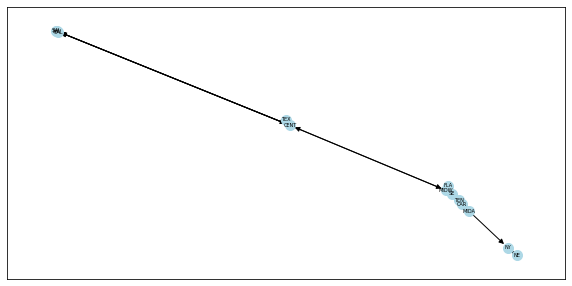

In [ ]:
plt.figure(figsize=(10, 5))

nx.draw_networkx(winter_region_graph_22, with_labels=True, node_size=100, font_size=5, node_color='lightblue')

plt.show()

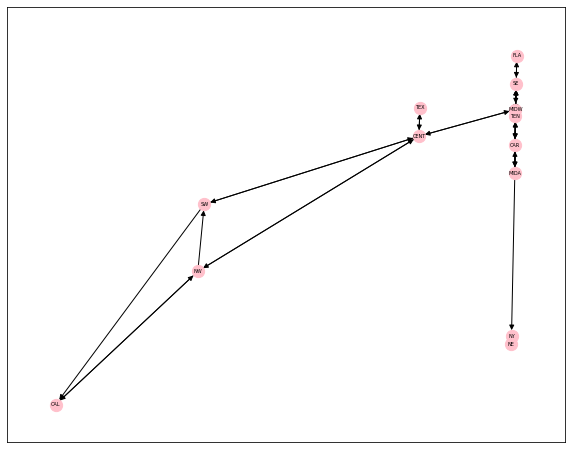

In [ ]:
plt.figure(figsize=(10, 8))  
pos = nx.spring_layout(spring_region_graph_22, seed=43) 
nx.draw_networkx(winter_region_graph_22, pos=pos, with_labels=True, node_size=150, font_size=5, node_color='pink')

plt.show()

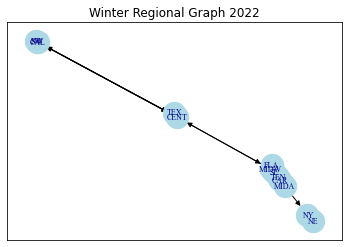

None

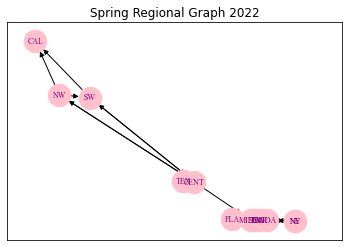

None

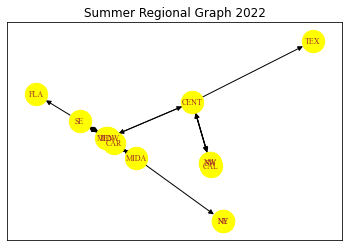

None

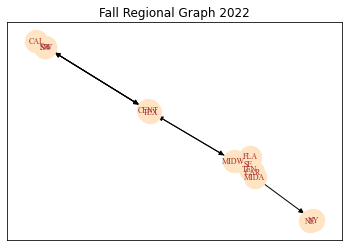

None

In [ ]:
plt.title("Winter Regional Graph 2022")
display(draw_graph(winter_region_graph_22, 500, 'lightblue', 'darkblue'))

plt.title("Spring Regional Graph 2022")
display(draw_graph(spring_region_graph_22, 500, 'pink','purple'))

plt.title("Summer Regional Graph 2022")
display(draw_graph(summer_region_graph_22, 500, 'yellow','brown'))

plt.title("Fall Regional Graph 2022")
display(draw_graph(fall_region_graph_22, 500,'bisque','brown'))

In [ ]:
winter_BA_graph_22 = create_graph(winter2022total)
spring_BA_graph_22 = create_graph(spring2022total)
summer_BA_graph_22 = create_graph(summer2022total)
fall_BA_graph_22 = create_graph(fall2022total)

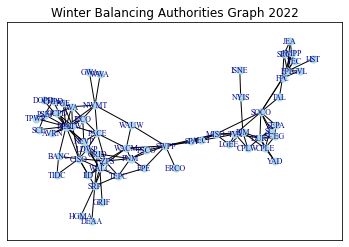

None

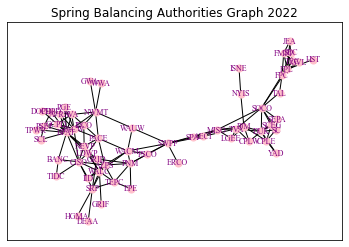

None

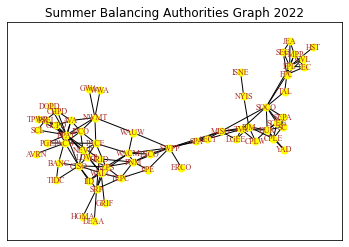

None

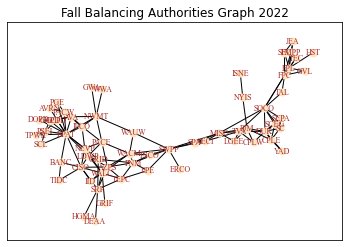

None

In [ ]:
plt.title("Winter Balancing Authorities Graph 2022")
display(draw_graph(winter_BA_graph_22, 50, 'lightblue', 'darkblue'))

plt.title("Spring Balancing Authorities Graph 2022")
display(draw_graph(spring_BA_graph_22, 50, 'pink','purple'))

plt.title("Summer Balancing Authorities Graph 2022")
display(draw_graph(summer_BA_graph_22, 50, 'yellow','brown'))

plt.title("Fall Balancing Authorities Graph 2022")
display(draw_graph(fall_BA_graph_22, 50,'bisque','brown'))

## Network Analysis & Attributed Graph

In [ ]:
season_region_graphs = [winter_region_graph_22, spring_region_graph_22, summer_region_graph_22, fall_region_graph_22]
season_ba_graphs = [winter_BA_graph_22, spring_BA_graph_22, summer_BA_graph_22, fall_BA_graph_22]
seasons = ['winter', 'spring', 'summer', 'fall']

In [ ]:
print(f"Winter: {winter_region_graph_22.edges()}\n")
print(f"Spring: {spring_region_graph_22.edges()}\n")
print(f"Summer: {summer_region_graph_22.edges()}\n")
print(f"Fall: {fall_region_graph_22.edges()}")

Winter: [('CAL', 'NW'), ('CAR', 'MIDA'), ('CAR', 'SE'), ('CAR', 'TEN'), ('CENT', 'MIDW'), ('CENT', 'NW'), ('CENT', 'SW'), ('CENT', 'TEX'), ('FLA', 'SE'), ('MIDA', 'CAR'), ('MIDA', 'MIDW'), ('MIDA', 'NY'), ('MIDA', 'TEN'), ('MIDW', 'CENT'), ('MIDW', 'SE'), ('MIDW', 'TEN'), ('NE', 'NY'), ('NW', 'CAL'), ('NW', 'CENT'), ('NW', 'SW'), ('NY', 'NE'), ('SE', 'CAR'), ('SE', 'FLA'), ('SE', 'MIDW'), ('SE', 'TEN'), ('SW', 'CAL'), ('SW', 'CENT'), ('TEN', 'CAR'), ('TEN', 'MIDA'), ('TEN', 'SE'), ('TEX', 'CENT')]

Spring: [('CAR', 'MIDA'), ('CAR', 'SE'), ('CAR', 'TEN'), ('CENT', 'MIDW'), ('CENT', 'NW'), ('CENT', 'SW'), ('CENT', 'TEX'), ('FLA', 'SE'), ('MIDA', 'CAR'), ('MIDA', 'MIDW'), ('MIDA', 'NY'), ('MIDA', 'TEN'), ('MIDW', 'TEN'), ('NE', 'NY'), ('NW', 'CAL'), ('NW', 'CENT'), ('NW', 'SW'), ('NY', 'MIDA'), ('NY', 'NE'), ('SE', 'CAR'), ('SE', 'FLA'), ('SE', 'MIDW'), ('SE', 'TEN'), ('SW', 'CAL'), ('SW', 'CENT'), ('TEN', 'CAR'), ('TEN', 'MIDA'), ('TEN', 'SE'), ('TEX', 'CENT')]

Summer: [('CAL', 'SW'), (

In [ ]:
winter_region_graph_22.nodes

NodeView(('CAL', 'CAR', 'CENT', 'FLA', 'MIDA', 'MIDW', 'NE', 'NW', 'NY', 'SE', 'SW', 'TEN', 'TEX'))

In [ ]:
nx.shortest_path(winter_region_graph_22,'CAL','FLA')

['CAL', 'NW', 'CENT', 'MIDW', 'SE', 'FLA']

In [ ]:
nx.shortest_path_length(winter_region_graph_22,'CAL','FLA')

5

In [ ]:
paths = nx.all_simple_paths(winter_region_graph_22,'CAL','FLA')

for path in paths:
    print(path)

['CAL', 'NW', 'CENT', 'MIDW', 'SE', 'FLA']
['CAL', 'NW', 'CENT', 'MIDW', 'TEN', 'CAR', 'SE', 'FLA']
['CAL', 'NW', 'CENT', 'MIDW', 'TEN', 'MIDA', 'CAR', 'SE', 'FLA']
['CAL', 'NW', 'CENT', 'MIDW', 'TEN', 'SE', 'FLA']
['CAL', 'NW', 'SW', 'CENT', 'MIDW', 'SE', 'FLA']
['CAL', 'NW', 'SW', 'CENT', 'MIDW', 'TEN', 'CAR', 'SE', 'FLA']
['CAL', 'NW', 'SW', 'CENT', 'MIDW', 'TEN', 'MIDA', 'CAR', 'SE', 'FLA']
['CAL', 'NW', 'SW', 'CENT', 'MIDW', 'TEN', 'SE', 'FLA']


In [ ]:
nx.closeness_centrality(winter_region_graph_22)

{'CAL': 0.25252525252525254,
 'CAR': 0.30864197530864196,
 'CENT': 0.43859649122807015,
 'FLA': 0.2777777777777778,
 'MIDA': 0.2873563218390805,
 'MIDW': 0.462962962962963,
 'NE': 0.23076923076923078,
 'NW': 0.32051282051282054,
 'NY': 0.2926829268292683,
 'SE': 0.3968253968253968,
 'SW': 0.32051282051282054,
 'TEN': 0.3968253968253968,
 'TEX': 0.2976190476190476}

In [ ]:
nx.closeness_centrality(winter_region_graph_22, distance='distance')

{'CAL': 0.00044777514606101563,
 'CAR': 0.0006468122647027886,
 'CENT': 0.0007571505849489695,
 'FLA': 0.00047524381658699125,
 'MIDA': 0.0005734133546024977,
 'MIDW': 0.0007879932696964639,
 'NE': 0.0005917134600460437,
 'NW': 0.0005037280999796921,
 'NY': 0.0006598303218901373,
 'SE': 0.0006794161030110165,
 'SW': 0.0005422437039091275,
 'TEN': 0.000775245099167098,
 'TEX': 0.0004608236799804933}

In [ ]:
winter_region_graph_22.nodes.data()

NodeDataView({'CAL': {'region': 'California', 'demand': 61978549.0, 'generation': 44912628.0, 'gen_cap': 81183.7}, 'CAR': {'region': 'Carolinas', 'demand': 59115769.0, 'generation': 57733201.0, 'gen_cap': 59288.2}, 'CENT': {'region': 'Central', 'demand': 70057789.0, 'generation': 72250211.0, 'gen_cap': 74294.6}, 'FLA': {'region': 'Florida', 'demand': 54291130.0, 'generation': 48198701.0, 'gen_cap': 64609.7}, 'MIDA': {'region': 'Mid-Atlantic', 'demand': 215218230.0, 'generation': 222901489.0, 'gen_cap': 173803.09999999998}, 'MIDW': {'region': 'Midwest', 'demand': 183942849.0, 'generation': 184998980.0, 'gen_cap': 220879.00000000003}, 'NE': {'region': 'Northeast', 'demand': 31092208.0, 'generation': 24950503.0, 'gen_cap': 35312.1}, 'NW': {'region': 'Northwest', 'demand': 94707824.0, 'generation': 98452833.0, 'gen_cap': 109441.19999999998}, 'NY': {'region': 'New York', 'demand': 39023576.0, 'generation': 31735258.0, 'gen_cap': 39889.6}, 'SE': {'region': 'Southeast', 'demand': 60303174.0, 

In [ ]:
nx.in_degree_centrality(winter_region_graph_22)

{'CAL': 0.16666666666666666,
 'CAR': 0.25,
 'CENT': 0.3333333333333333,
 'FLA': 0.08333333333333333,
 'MIDA': 0.16666666666666666,
 'MIDW': 0.25,
 'NE': 0.08333333333333333,
 'NW': 0.16666666666666666,
 'NY': 0.16666666666666666,
 'SE': 0.3333333333333333,
 'SW': 0.16666666666666666,
 'TEN': 0.3333333333333333,
 'TEX': 0.08333333333333333}

In [ ]:
winter_edges = list(winter_region_graph_22.edges())
spring_edges = list(spring_region_graph_22.edges())
summer_edges = list(summer_region_graph_22.edges())
fall_edges = list(fall_region_graph_22.edges())

In [ ]:
unique_to_summer_vs_winter = set(summer_edges) - set(winter_edges)
unique_to_summer_vs_spring = set(summer_edges) - set(spring_edges)
unique_to_summer_vs_fall   = set(summer_edges) - set(fall_edges)

unique_to_spring_vs_winter = set(spring_edges) - set(winter_edges)
unique_to_spring_vs_summer = set(spring_edges) - set(summer_edges)
unique_to_spring_vs_fall   = set(spring_edges) - set(fall_edges)

unique_to_winter_vs_spring = set(winter_edges) - set(spring_edges)
unique_to_winter_vs_summer = set(winter_edges) - set(summer_edges)
unique_to_winter_vs_fall   = set(winter_edges) - set(fall_edges)

unique_to_fall_vs_spring = set(fall_edges) - set(spring_edges)
unique_to_fall_vs_summer = set(fall_edges) - set(summer_edges)
unique_to_fall_vs_winter = set(fall_edges) - set(winter_edges)

print(f"Unique to Summer vs. Winter: {unique_to_summer_vs_winter}")
print(f"Unique to Summer vs. Spring: {unique_to_summer_vs_spring}")
print(f"Unique to Summer vs. Fall: {unique_to_summer_vs_fall}")

print(f"\nUnique to Spring vs. Winter: {unique_to_spring_vs_winter}")
print(f"Unique to Spring vs. Summer: {unique_to_spring_vs_summer}")
print(f"Unique to Spring vs. Fall: {unique_to_spring_vs_fall}")

print(f"\nUnique to Winter vs. Spring: {unique_to_winter_vs_spring}")
print(f"Unique to Winter vs. Summer: {unique_to_winter_vs_summer}")
print(f"Unique to Winter vs. Fall: {unique_to_winter_vs_fall}")

print(f"\nUnique to Fall vs. Winter: {unique_to_fall_vs_winter}")
print(f"Unique to Fall vs. Spring: {unique_to_fall_vs_spring}")
print(f"Unique to Fall vs. Summer: {unique_to_fall_vs_summer}")




Unique to Summer vs. Winter: {('CAL', 'SW')}
Unique to Summer vs. Spring: {('CAL', 'SW'), ('MIDW', 'CENT'), ('MIDW', 'SE')}
Unique to Summer vs. Fall: {('CAL', 'SW')}

Unique to Spring vs. Winter: {('NY', 'MIDA')}
Unique to Spring vs. Summer: {('NY', 'MIDA'), ('FLA', 'SE'), ('TEX', 'CENT')}
Unique to Spring vs. Fall: {('NY', 'MIDA')}

Unique to Winter vs. Spring: {('MIDW', 'CENT'), ('CAL', 'NW'), ('MIDW', 'SE')}
Unique to Winter vs. Summer: {('FLA', 'SE'), ('TEX', 'CENT'), ('CAL', 'NW')}
Unique to Winter vs. Fall: set()

Unique to Fall vs. Winter: set()
Unique to Fall vs. Spring: {('MIDW', 'CENT'), ('CAL', 'NW'), ('MIDW', 'SE')}
Unique to Fall vs. Summer: {('FLA', 'SE'), ('TEX', 'CENT'), ('CAL', 'NW')}


In [ ]:
def number_of_nodes(G):
    return G.number_of_nodes()

def number_of_edges(G):
    return G.number_of_edges()

for season_graph, season in zip(season_region_graphs, seasons):
    print(f"\n{season.capitalize()} Regional # of Nodes: {number_of_nodes(season_graph)}")
    print(f"{season.capitalize()} Regional # of Edges: {number_of_edges(season_graph)}")


Winter Regional # of Nodes: 13
Winter Regional # of Edges: 31

Spring Regional # of Nodes: 13
Spring Regional # of Edges: 29

Summer Regional # of Nodes: 13
Summer Regional # of Edges: 29

Fall Regional # of Nodes: 13
Fall Regional # of Edges: 31


In [ ]:
def degree(G):
    d = nx.degree(G)

    for node in G.nodes:
        print(f"Degree of {node} node: {d[node]}")
        
for season_graph, season in zip(season_region_graphs, seasons):
    print(f"\nRegional {season.capitalize()}:")
    degree(season_graph)


Regional Winter:
Degree of CAL node: 3
Degree of CAR node: 6
Degree of CENT node: 8
Degree of FLA node: 2
Degree of MIDA node: 6
Degree of MIDW node: 6
Degree of NE node: 2
Degree of NW node: 5
Degree of NY node: 3
Degree of SE node: 8
Degree of SW node: 4
Degree of TEN node: 7
Degree of TEX node: 2

Regional Spring:
Degree of CAL node: 2
Degree of CAR node: 6
Degree of CENT node: 7
Degree of FLA node: 2
Degree of MIDA node: 7
Degree of MIDW node: 4
Degree of NE node: 2
Degree of NW node: 4
Degree of NY node: 4
Degree of SE node: 7
Degree of SW node: 4
Degree of TEN node: 7
Degree of TEX node: 2

Regional Summer:
Degree of CAL node: 3
Degree of CAR node: 6
Degree of CENT node: 7
Degree of FLA node: 1
Degree of MIDA node: 6
Degree of MIDW node: 6
Degree of NE node: 2
Degree of NW node: 4
Degree of NY node: 3
Degree of SE node: 7
Degree of SW node: 5
Degree of TEN node: 7
Degree of TEX node: 1

Regional Fall:
Degree of CAL node: 3
Degree of CAR node: 6
Degree of CENT node: 8
Degree of F

In [ ]:
def centrality_degree(G):
    dc = nx.degree_centrality(G)

    for node in G.nodes:
        print(f"{node} Degree of Centrality: {dc[node]:.4f}")
        
for season_graph, season in zip(season_region_graphs, seasons):
    print(f"\nRegional {season.capitalize()}:")
    centrality_degree(season_graph)


Regional Winter:
CAL Degree of Centrality: 0.2500
CAR Degree of Centrality: 0.5000
CENT Degree of Centrality: 0.6667
FLA Degree of Centrality: 0.1667
MIDA Degree of Centrality: 0.5000
MIDW Degree of Centrality: 0.5000
NE Degree of Centrality: 0.1667
NW Degree of Centrality: 0.4167
NY Degree of Centrality: 0.2500
SE Degree of Centrality: 0.6667
SW Degree of Centrality: 0.3333
TEN Degree of Centrality: 0.5833
TEX Degree of Centrality: 0.1667

Regional Spring:
CAL Degree of Centrality: 0.1667
CAR Degree of Centrality: 0.5000
CENT Degree of Centrality: 0.5833
FLA Degree of Centrality: 0.1667
MIDA Degree of Centrality: 0.5833
MIDW Degree of Centrality: 0.3333
NE Degree of Centrality: 0.1667
NW Degree of Centrality: 0.3333
NY Degree of Centrality: 0.3333
SE Degree of Centrality: 0.5833
SW Degree of Centrality: 0.3333
TEN Degree of Centrality: 0.5833
TEX Degree of Centrality: 0.1667

Regional Summer:
CAL Degree of Centrality: 0.2500
CAR Degree of Centrality: 0.5000
CENT Degree of Centrality:

In [ ]:
def neighbors(G):
    for node in G.nodes:
        neighbor_list = [n for n in G.neighbors(node)]
        print(f"Neighbors of {node}: {neighbor_list}")
    
print('Regional Winter:')
neighbors(winter_region_graph_22)

Regional Winter:
Neighbors of CAL: ['NW']
Neighbors of CAR: ['MIDA', 'SE', 'TEN']
Neighbors of CENT: ['MIDW', 'NW', 'SW', 'TEX']
Neighbors of FLA: ['SE']
Neighbors of MIDA: ['CAR', 'MIDW', 'NY', 'TEN']
Neighbors of MIDW: ['CENT', 'SE', 'TEN']
Neighbors of NE: ['NY']
Neighbors of NW: ['CAL', 'CENT', 'SW']
Neighbors of NY: ['NE']
Neighbors of SE: ['CAR', 'FLA', 'MIDW', 'TEN']
Neighbors of SW: ['CAL', 'CENT']
Neighbors of TEN: ['CAR', 'MIDA', 'SE']
Neighbors of TEX: ['CENT']


In [ ]:
dc = nx.degree_centrality(winter_region_graph_22)
dc

{'CAL': 0.25,
 'CAR': 0.5,
 'CENT': 0.6666666666666666,
 'FLA': 0.16666666666666666,
 'MIDA': 0.5,
 'MIDW': 0.5,
 'NE': 0.16666666666666666,
 'NW': 0.41666666666666663,
 'NY': 0.25,
 'SE': 0.6666666666666666,
 'SW': 0.3333333333333333,
 'TEN': 0.5833333333333333,
 'TEX': 0.16666666666666666}

In [ ]:
for node in winter_region_graph_22.nodes:
    print(f"{node} clustering: {nx.clustering(winter_region_graph_22, node):.6f}")

CAL clustering: 0.500000
CAR clustering: 0.666667
CENT clustering: 0.083333
FLA clustering: 0.000000
MIDA clustering: 0.384615
MIDW clustering: 0.230769
NE clustering: 0.000000
NW clustering: 0.375000
NY clustering: 0.000000
SE clustering: 0.250000
SW clustering: 0.600000
TEN clustering: 0.611111
TEX clustering: 0.000000


In [ ]:
def average_clustering(G):
    return nx.average_clustering(G)

for season_graph, season in zip(season_region_graphs, seasons):
    print(f"\n{season.capitalize()} regional average clustering: {average_clustering(season_graph):.4f}")


Winter regional average clustering: 0.2847

Spring regional average clustering: 0.2863

Summer regional average clustering: 0.2933

Fall regional average clustering: 0.2847


In [ ]:
def transitivity(G):
    return nx.transitivity(G)

for season_graph, season in zip(season_region_graphs, seasons):
    print(f"\n{season.capitalize()} regional transitivity: {transitivity(season_graph):.4f}")


Winter regional transitivity: 0.3226

Spring regional transitivity: 0.3103

Summer regional transitivity: 0.3387

Fall regional transitivity: 0.3226


In [ ]:
def node_connectivity(G):
    return nx.node_connectivity(G)
    
for season_graph, season in zip(season_region_graphs, seasons):
    print(f"\n{season.capitalize()} minimum nodes removed to disconnect a network: {node_connectivity(season_graph):.4f}")


Winter minimum nodes removed to disconnect a network: 1.0000

Spring minimum nodes removed to disconnect a network: 0.0000

Summer minimum nodes removed to disconnect a network: 0.0000

Fall minimum nodes removed to disconnect a network: 1.0000


In [ ]:
def min_node_cut(G):
    return nx.minimum_node_cut(G)

for season_graph, season in zip(season_region_graphs, seasons):
    print(f"\nIf {min_node_cut(season_graph)} is not connected -> {season.capitalize()} network fails")


If {'CENT'} is not connected -> Winter network fails

If {} is not connected -> Spring network fails

If set() is not connected -> Summer network fails

If {'CENT'} is not connected -> Fall network fails


In [ ]:
# def jaccard_coefficient(G):
#     return nx.jaccard_coefficient(G)

# for season_graph, season in zip(season_region_graphs, seasons):
#     print(f"\n{season.capitalize()} jaccard coefficient: {jaccard_coefficient(season_graph)}")

In [ ]:
# preds = nx.jaccard_coefficient(winter_region_graph_22)

# for u, v, p in preds:
#     if p != 0:
#         print(f"({u}, {v}) : {p:.4f}")

### Balancing Authorities 

In [ ]:
for season_graph, season in zip(season_ba_graphs, seasons):
    print(f"\n{season.capitalize()} balancing authorities average clustering: {average_clustering(season_graph):.4f}")


Winter balancing authorities average clustering: 0.5197

Spring balancing authorities average clustering: 0.5248

Summer balancing authorities average clustering: 0.5046

Fall balancing authorities average clustering: 0.5225


In [ ]:
for season_graph, season in zip(season_ba_graphs, seasons):
    print(f"\n{season.capitalize()} balancing authorities transitivity: {transitivity(season_graph):.4f}")


Winter balancing authorities transitivity: 0.3722

Spring balancing authorities transitivity: 0.3731

Summer balancing authorities transitivity: 0.3716

Fall balancing authorities transitivity: 0.3779


In [ ]:
for season_graph, season in zip(season_ba_graphs, seasons):
    print(f"\n{season.capitalize()} minimum nodes removed to disconnect a network: {node_connectivity(season_graph):.4f}")


Winter minimum nodes removed to disconnect a network: 1.0000

Spring minimum nodes removed to disconnect a network: 1.0000

Summer minimum nodes removed to disconnect a network: 1.0000

Fall minimum nodes removed to disconnect a network: 1.0000


In [ ]:
for season_graph, season in zip(season_ba_graphs, seasons):
    print(f"\nIf {min_node_cut(season_graph)} fails -> {season.capitalize()} network is disconnected")


If {'SWPP'} fails -> Winter network is disconnected

If {'SWPP'} fails -> Spring network is disconnected

If {'SWPP'} fails -> Summer network is disconnected

If {'SWPP'} fails -> Fall network is disconnected


In [ ]:
print(f"\nWinter BA number of NODES: {winter_BA_graph_22.number_of_nodes()}")
print(f"Winter BA number of EDGES: {winter_BA_graph_22.number_of_edges()}")


Winter BA number of NODES: 62
Winter BA number of EDGES: 143


In [ ]:
for node in winter_BA_graph_22.nodes:
    print(f"Degree of {node}: {winter_BA_graph_22.degree(node)}")

Degree of AECI: 4
Degree of AVA: 6
Degree of AVRN: 2
Degree of AZPS: 9
Degree of BANC: 3
Degree of BPAT: 17
Degree of CHPD: 4
Degree of CISO: 10
Degree of CPLE: 5
Degree of CPLW: 3
Degree of DEAA: 1
Degree of DOPD: 2
Degree of DUK: 9
Degree of EPE: 3
Degree of ERCO: 1
Degree of FMPP: 4
Degree of FPC: 7
Degree of FPL: 8
Degree of GCPD: 4
Degree of GRID: 3
Degree of GRIF: 1
Degree of GVL: 2
Degree of GWA: 1
Degree of HGMA: 1
Degree of HST: 1
Degree of IID: 3
Degree of IPCO: 6
Degree of ISNE: 1
Degree of JEA: 3
Degree of LDWP: 6
Degree of LGEE: 3
Degree of MISO: 7
Degree of NEVP: 6
Degree of NWMT: 7
Degree of NYIS: 2
Degree of PACE: 7
Degree of PACW: 8
Degree of PGE: 2
Degree of PJM: 7
Degree of PNM: 7
Degree of PSCO: 3
Degree of PSEI: 5
Degree of SC: 5
Degree of SCEG: 5
Degree of SCL: 2
Degree of SEC: 4
Degree of SEPA: 4
Degree of SOCO: 9
Degree of SPA: 3
Degree of SRP: 7
Degree of SWPP: 9
Degree of TAL: 2
Degree of TEC: 4
Degree of TEPC: 5
Degree of TIDC: 2
Degree of TPWR: 2
Degree of T

In [ ]:
for node in winter_BA_graph_22.nodes:
    neighbor_list = [n for n in winter_BA_graph_22.neighbors(node)]
    print(f"Neighbors of {node}: {neighbor_list}")

Neighbors of AECI: ['MISO', 'SPA', 'SWPP', 'TVA']
Neighbors of AVA: ['CHPD', 'GCPD', 'IPCO', 'NWMT', 'PACW', 'BPAT']
Neighbors of AVRN: ['PACW', 'BPAT']
Neighbors of AZPS: ['CISO', 'IID', 'LDWP', 'PACE', 'PNM', 'TEPC', 'WACM', 'WALC', 'SRP']
Neighbors of BANC: ['BPAT', 'CISO', 'TIDC']
Neighbors of BPAT: ['BANC', 'AVA', 'AVRN', 'CISO', 'DOPD', 'GCPD', 'GRID', 'IPCO', 'LDWP', 'NEVP', 'PACW', 'PGE', 'PSEI', 'SCL', 'TPWR', 'CHPD', 'NWMT']
Neighbors of CHPD: ['AVA', 'BPAT', 'DOPD', 'PSEI']
Neighbors of CISO: ['AZPS', 'BPAT', 'BANC', 'LDWP', 'PACW', 'TIDC', 'WALC', 'IID', 'NEVP', 'SRP']
Neighbors of CPLE: ['DUK', 'PJM', 'SC', 'SCEG', 'YAD']
Neighbors of CPLW: ['DUK', 'PJM', 'TVA']
Neighbors of DEAA: ['SRP']
Neighbors of DOPD: ['BPAT', 'CHPD']
Neighbors of DUK: ['CPLE', 'CPLW', 'PJM', 'SCEG', 'SEPA', 'SOCO', 'TVA', 'YAD', 'SC']
Neighbors of EPE: ['PNM', 'SWPP', 'TEPC']
Neighbors of ERCO: ['SWPP']
Neighbors of FMPP: ['FPC', 'JEA', 'FPL', 'TEC']
Neighbors of FPC: ['FMPP', 'FPL', 'GVL', 'SEC', '

In [ ]:
print(f"Winter regional number of NODES: {winter_region_graph_22.number_of_nodes()}")
print(f"Winter regional number of EDGES: {winter_region_graph_22.number_of_edges()}")

print(f"\nWinter BA number of NODES: {winter_BA_graph_22.number_of_nodes()}")
print(f"Winter BA number of EDGES: {winter_BA_graph_22.number_of_edges()}")

Winter regional number of NODES: 13
Winter regional number of EDGES: 31

Winter BA number of NODES: 62
Winter BA number of EDGES: 143


In [ ]:
for node in winter_BA_graph_22.nodes:
    print(f"Degree of {node}: {winter_BA_graph_22.degree(node)}")

Degree of AECI: 4
Degree of AVA: 6
Degree of AVRN: 2
Degree of AZPS: 9
Degree of BANC: 3
Degree of BPAT: 17
Degree of CHPD: 4
Degree of CISO: 10
Degree of CPLE: 5
Degree of CPLW: 3
Degree of DEAA: 1
Degree of DOPD: 2
Degree of DUK: 9
Degree of EPE: 3
Degree of ERCO: 1
Degree of FMPP: 4
Degree of FPC: 7
Degree of FPL: 8
Degree of GCPD: 4
Degree of GRID: 3
Degree of GRIF: 1
Degree of GVL: 2
Degree of GWA: 1
Degree of HGMA: 1
Degree of HST: 1
Degree of IID: 3
Degree of IPCO: 6
Degree of ISNE: 1
Degree of JEA: 3
Degree of LDWP: 6
Degree of LGEE: 3
Degree of MISO: 7
Degree of NEVP: 6
Degree of NWMT: 7
Degree of NYIS: 2
Degree of PACE: 7
Degree of PACW: 8
Degree of PGE: 2
Degree of PJM: 7
Degree of PNM: 7
Degree of PSCO: 3
Degree of PSEI: 5
Degree of SC: 5
Degree of SCEG: 5
Degree of SCL: 2
Degree of SEC: 4
Degree of SEPA: 4
Degree of SOCO: 9
Degree of SPA: 3
Degree of SRP: 7
Degree of SWPP: 9
Degree of TAL: 2
Degree of TEC: 4
Degree of TEPC: 5
Degree of TIDC: 2
Degree of TPWR: 2
Degree of T

In [ ]:
for node in winter_BA_graph_22.nodes:
    neighbor_list = [n for n in winter_BA_graph_22.neighbors(node)]
    print(f"Neighbors of {node}: {neighbor_list}")

Neighbors of AECI: ['MISO', 'SPA', 'SWPP', 'TVA']
Neighbors of AVA: ['CHPD', 'GCPD', 'IPCO', 'NWMT', 'PACW', 'BPAT']
Neighbors of AVRN: ['PACW', 'BPAT']
Neighbors of AZPS: ['CISO', 'IID', 'LDWP', 'PACE', 'PNM', 'TEPC', 'WACM', 'WALC', 'SRP']
Neighbors of BANC: ['BPAT', 'CISO', 'TIDC']
Neighbors of BPAT: ['BANC', 'AVA', 'AVRN', 'CISO', 'DOPD', 'GCPD', 'GRID', 'IPCO', 'LDWP', 'NEVP', 'PACW', 'PGE', 'PSEI', 'SCL', 'TPWR', 'CHPD', 'NWMT']
Neighbors of CHPD: ['AVA', 'BPAT', 'DOPD', 'PSEI']
Neighbors of CISO: ['AZPS', 'BPAT', 'BANC', 'LDWP', 'PACW', 'TIDC', 'WALC', 'IID', 'NEVP', 'SRP']
Neighbors of CPLE: ['DUK', 'PJM', 'SC', 'SCEG', 'YAD']
Neighbors of CPLW: ['DUK', 'PJM', 'TVA']
Neighbors of DEAA: ['SRP']
Neighbors of DOPD: ['BPAT', 'CHPD']
Neighbors of DUK: ['CPLE', 'CPLW', 'PJM', 'SCEG', 'SEPA', 'SOCO', 'TVA', 'YAD', 'SC']
Neighbors of EPE: ['PNM', 'SWPP', 'TEPC']
Neighbors of ERCO: ['SWPP']
Neighbors of FMPP: ['FPC', 'JEA', 'FPL', 'TEC']
Neighbors of FPC: ['FMPP', 'FPL', 'GVL', 'SEC', '

# Optimization

## Libraries and imports

In [ ]:
%pip install gurobipy
%pip install gurobipy-pandas


[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
  Using cached gurobipy_pandas-1.0.0-py3-none-any.whl (18 kB)

[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import gurobipy as gp
from gurobipy import GRB
import gurobipy_pandas as gppd

# Not for production, but for interactive modelling and checking
gppd.set_interactive()

## Natural Results

### Winter

In [ ]:
demand_df = pd.DataFrame(nx.get_node_attributes(winter_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

generation_df = pd.DataFrame(nx.get_node_attributes(winter_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

edge_variance = nx.get_edge_attributes(winter_region_graph_22, 'variance') 
variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                           columns=['i', 'j', 'variance']).set_index(['i', 'j'])

edge_cost = nx.get_edge_attributes(winter_region_graph_22, 'cost') 
cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                           columns=['i', 'j', 'cost']).set_index(['i', 'j'])

# NOT YET CAPACITY

edge_cap = nx.get_edge_attributes(winter_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                           columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 


c = cost_df.copy()
v = variance_df.copy()
d = demand_df.copy()
g = generation_df.copy()
cap = capacity_df.copy()


In [ ]:
gen_boosts = []
cap['capacity'] = 220000000 # setting as the highest generation for now

gen_boost = sum(d['demand'])/sum(g['generation'])
gen_boosts.append(gen_boost)
g['generation'] = (gen_boost) * g['generation']

In [ ]:
print(f"Total generation: {sum(g['generation'])}")
print(f"Total demand: {sum(d['demand'])}")
print(f"Generation Boost: {gen_boost:.4f}%")

Total generation: 1035459421.0000001
Total demand: 1035459421.0
Generation Boost: 1.0181%


In [ ]:
d

,demand
i,
CAL,61978549.0
CAR,59115769.0
CENT,70057789.0
FLA,54291130.0
MIDA,215218230.0
MIDW,183942849.0
NE,31092208.0
NW,94707824.0
NY,39023576.0


In [ ]:
x

Restricted license - for non-production use only - expires 2024-10-28
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 columns and 124 nonzeros
Model fingerprint: 0x6fa6a733
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 3e+01]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e+05, 2e+08]
Presolve removed 67 rows and 7 columns
Presolve time: 0.00s
Presolved: 8 rows, 24 columns, 41 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.8918237e+08   5.184524e+06   0.000000e+00      0s
      10    1.0569306e+09   0.000000e+00   0.000000e+00      0s

Solved in 10 iterations and 0.00 seconds (0.00 work units)
Optimal objective  1.056930591e+09


In [ ]:
# Constraints 

cap_constraint = gppd.add_constrs(
    model,
    x,
    GRB.LESS_EQUAL,
    cap['capacity'],
    name='cap_constraint'
)

non_negativity = gppd.add_constrs(
    model,
    x,
    GRB.GREATER_EQUAL,
    0,
    name='non_negativity'
)

dem_constraint = gppd.add_constrs(
    model,
    g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
    GRB.EQUAL,
    d['demand'], 
    name='dem_constraint'
)

In [ ]:
# print("Winter Results:")
# display(x)

### Spring

In [ ]:
demand_df = pd.DataFrame(nx.get_node_attributes(spring_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

generation_df = pd.DataFrame(nx.get_node_attributes(spring_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

edge_variance = nx.get_edge_attributes(spring_region_graph_22, 'variance') 
variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                           columns=['i', 'j', 'variance']).set_index(['i', 'j'])

edge_cost = nx.get_edge_attributes(spring_region_graph_22, 'cost') 
cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                           columns=['i', 'j', 'cost']).set_index(['i', 'j'])

# NOT YET CAPACITY

edge_cap = nx.get_edge_attributes(spring_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                           columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 

cap['capacity'] = 220000000 # setting as the highest generation for now


c = cost_df.copy()
v = variance_df.copy()
d = demand_df.copy()
g = generation_df.copy()
cap = capacity_df.copy()
a
# With penalty for data formatting the model

CAL_cost_row = pd.DataFrame({'cost': 9999}, index=pd.MultiIndex.from_tuples([('CAL', 'CAR')], names=['i', 'j']))
c = pd.concat([CAL_cost_row, c])

CAL_cap_row = pd.DataFrame({'capacity': 200000}, index=pd.MultiIndex.from_tuples([('CAL', 'CAR')], names=['i', 'j']))
cap = pd.concat([CAL_cap_row, cap])

In [ ]:
CAL_spring_node.distribution

NameError: name 'CAL_spring_node' is not defined

In [ ]:
cap['capacity'] = 220000000

gen_boost = sum(d['demand'])/sum(g['generation'])
gen_boosts.append(gen_boost)
g['generation'] = (gen_boost) * g['generation']

In [ ]:
print(f"Total generation: {sum(g['generation'])}")
print(f"Total demand: {sum(d['demand'])}")
print(f"Generation Boost: {gen_boost:.4f}%")

Total generation: 947143619.0
Total demand: 947143619.0
Generation Boost: 1.0141%


In [ ]:
# Create the model
model = gp.Model()

# Decision Variables
x = gppd.add_vars(model, c, name='x')

# Objective function
model.update()
model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE)

# Constraints 

cap_constraint = gppd.add_constrs(
    model,
    x,
    GRB.LESS_EQUAL,
    cap['capacity'],
    name='cap_constraint'
)

non_negativity = gppd.add_constrs(
    model,
    x,
    GRB.GREATER_EQUAL,
    0,
    name='non_negativity'
)

# With  demand relaxation
dem_constraint = gppd.add_constrs(
    model,
    g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
    GRB.EQUAL,
    # limit without generation relaxation: 0.8249
    d['demand'], #with 0.02 generation relaxation it fully works
    name='dem_constraint'
)

model.optimize()

# append the results to the list
optimization_1_results.append(model.objVal)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 73 rows, 30 columns and 120 nonzeros
Model fingerprint: 0x55c11b0e
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 1e+04]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+05, 2e+08]
Presolve removed 65 rows and 8 columns
Presolve time: 0.00s
Presolved: 8 rows, 22 columns, 40 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.7032162e+08   4.653012e+06   0.000000e+00      0s
      10    7.1193966e+08   0.000000e+00   0.000000e+00      0s

Solved in 10 iterations and 0.00 seconds (0.00 work units)
Optimal objective  7.119396649e+08


In [ ]:
print("Spring Results:")
display(x)

Spring Results:


i     j   
CAL   CAR                   <gurobi.Var x[CAL,CAR] (value 0.0)>
CAR   MIDA                 <gurobi.Var x[CAR,MIDA] (value 0.0)>
      SE                     <gurobi.Var x[CAR,SE] (value 0.0)>
      TEN     <gurobi.Var x[CAR,TEN] (value 133940.839491121...
CENT  MIDW    <gurobi.Var x[CENT,MIDW] (value 3596624.157927...
      NW                    <gurobi.Var x[CENT,NW] (value 0.0)>
      SW      <gurobi.Var x[CENT,SW] (value 2542016.148848936)>
      TEX                  <gurobi.Var x[CENT,TEX] (value 0.0)>
FLA   SE      <gurobi.Var x[FLA,SE] (value 234737.62370875478)>
MIDA  CAR                  <gurobi.Var x[MIDA,CAR] (value 0.0)>
      MIDW    <gurobi.Var x[MIDA,MIDW] (value 354707.8113074...
      NY      <gurobi.Var x[MIDA,NY] (value 7994969.422302663)>
      TEN                  <gurobi.Var x[MIDA,TEN] (value 0.0)>
MIDW  TEN                  <gurobi.Var x[MIDW,TEN] (value 0.0)>
NE    NY                      <gurobi.Var x[NE,NY] (value 0.0)>
NW    CAL      <gurobi.Var x[

In [ ]:
spring_natural_opti_results = []

for v in model.getVars():
    spring_natural_opti_results.append(v.x)

In [ ]:
spring_natural_opti_results

[0.0,
 0.0,
 0.0,
 133940.83949112147,
 3596624.1579276323,
 0.0,
 2542016.148848936,
 0.0,
 234737.62370875478,
 0.0,
 354707.81130746007,
 7994969.422302663,
 0.0,
 0.0,
 0.0,
 7776606.197711155,
 0.0,
 0.0,
 0.0,
 3178115.624504093,
 0.0,
 0.0,
 1244822.6882805824,
 1200243.1298056468,
 6068190.5339613855,
 0.0,
 0.0,
 0.0,
 0.0,
 1074079.1853105426]

### Summer

In [ ]:
season_graph = summer_region_graph_22
demand_df = pd.DataFrame(nx.get_node_attributes(season_graph, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

generation_df = pd.DataFrame(nx.get_node_attributes(season_graph, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

edge_variance = nx.get_edge_attributes(season_graph, 'variance') 
variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                           columns=['i', 'j', 'variance']).set_index(['i', 'j'])

edge_cost = nx.get_edge_attributes(season_graph, 'cost') 
cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                           columns=['i', 'j', 'cost']).set_index(['i', 'j'])

# NOT YET CAPACITY

edge_cap = nx.get_edge_attributes(season_graph, 'variance') # change this to constraint we want to define for edge capacity
capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                           columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 

cap['capacity'] = 220000000 # setting as the highest generation for now


c = cost_df.copy()
v = variance_df.copy()
d = demand_df.copy()
g = generation_df.copy()
cap = capacity_df.copy()

# With penalty for data formatting the model

FLA_cost_row = pd.DataFrame({'cost': 9999}, index=pd.MultiIndex.from_tuples([('FLA', 'CAR')], names=['i', 'j']))
c = pd.concat([FLA_cost_row, c])

FLA_cap_row = pd.DataFrame({'capacity': 1}, index=pd.MultiIndex.from_tuples([('FLA', 'CAR')], names=['i', 'j']))
cap = pd.concat([FLA_cap_row, cap])

TEX_cost_row = pd.DataFrame({'cost': 9999}, index=pd.MultiIndex.from_tuples([('TEX', 'CAR')], names=['i', 'j']))
c = pd.concat([TEX_cost_row, c])

TEX_cap_row = pd.DataFrame({'capacity': 1}, index=pd.MultiIndex.from_tuples([('TEX', 'CAR')], names=['i', 'j']))
cap = pd.concat([TEX_cap_row, cap])


In [ ]:
cap['capacity'] = 220000000

gen_boost = sum(d['demand'])/sum(g['generation'])
gen_boosts.append(gen_boost)
g['generation'] = (gen_boost) * g['generation']

In [ ]:
print(f"Total generation: {sum(g['generation'])}")
print(f"Total demand: {sum(d['demand'])}")
print(f"Generation Boost: {gen_boost:.4f}%")

Total generation: 1195526655.0
Total demand: 1195526655.0
Generation Boost: 1.0154%


In [ ]:
# Create the model
model = gp.Model()

# Decision Variables
x = gppd.add_vars(model, c, name='x')

# Objective function
model.update()
model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE)

# Constraints 

cap_constraint = gppd.add_constrs(
    model,
    x,
    GRB.LESS_EQUAL,
    cap['capacity'],
    name='cap_constraint'
)

non_negativity = gppd.add_constrs(
    model,
    x,
    GRB.GREATER_EQUAL,
    0,
    name='non_negativity'
)

# With  demand relaxation
dem_constraint = gppd.add_constrs(
    model,
    g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
    GRB.EQUAL,
    # limit without generation relaxation: 0.9848
    d['demand'],
    name='dem_constraint'
)

model.optimize()

# append the results to the list
optimization_1_results.append(model.objVal*0.1)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 columns and 124 nonzeros
Model fingerprint: 0x42fa8beb
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 1e+04]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e+05, 2e+08]
Presolve removed 65 rows and 3 columns
Presolve time: 0.00s
Presolved: 10 rows, 28 columns, 49 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.0040816e+10   5.226241e+06   0.000000e+00      0s
      11    1.0644894e+10   0.000000e+00   0.000000e+00      0s

Solved in 11 iterations and 0.00 seconds (0.00 work units)
Optimal objective  1.064489375e+10


In [ ]:
print("Summer Results:")
display(x)

Summer Results:


i     j   
TEX   CAR     <gurobi.Var x[TEX,CAR] (value 985613.7401410639)>
FLA   CAR                   <gurobi.Var x[FLA,CAR] (value 0.0)>
CAL   SW                     <gurobi.Var x[CAL,SW] (value 0.0)>
CAR   MIDA                 <gurobi.Var x[CAR,MIDA] (value 0.0)>
      SE                     <gurobi.Var x[CAR,SE] (value 0.0)>
      TEN     <gurobi.Var x[CAR,TEN] (value 221741.0601548776)>
CENT  MIDW    <gurobi.Var x[CENT,MIDW] (value 2016605.299354...
      NW                    <gurobi.Var x[CENT,NW] (value 0.0)>
      SW      <gurobi.Var x[CENT,SW] (value 2631157.44666334...
      TEX                  <gurobi.Var x[CENT,TEX] (value 0.0)>
MIDA  CAR                  <gurobi.Var x[MIDA,CAR] (value 0.0)>
      MIDW    <gurobi.Var x[MIDA,MIDW] (value 1667538.649508...
      NY      <gurobi.Var x[MIDA,NY] (value 11930564.4704298...
      TEN                  <gurobi.Var x[MIDA,TEN] (value 0.0)>
MIDW  CENT                <gurobi.Var x[MIDW,CENT] (value 0.0)>
      SE                    <

In [ ]:
summer_natural_opti_results = []

for v in model.getVars():
    summer_natural_opti_results.append(v.x)

### Fall

In [ ]:
season_graph = fall_region_graph_22

demand_df = pd.DataFrame(nx.get_node_attributes(season_graph, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

generation_df = pd.DataFrame(nx.get_node_attributes(season_graph, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

edge_variance = nx.get_edge_attributes(season_graph, 'variance') 
variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                           columns=['i', 'j', 'variance']).set_index(['i', 'j'])

edge_cost = nx.get_edge_attributes(season_graph, 'cost') 
cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                           columns=['i', 'j', 'cost']).set_index(['i', 'j'])

# NOT YET CAPACITY

edge_cap = nx.get_edge_attributes(season_graph, 'variance') # change this to constraint we want to define for edge capacity
capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                           columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 

cap['capacity'] = 220000000 # setting as the highest generation for now


c = cost_df.copy()
v = variance_df.copy()
d = demand_df.copy()
g = generation_df.copy()
cap = capacity_df.copy()

In [ ]:
cap['capacity'] = 220000000

gen_boost = sum(d['demand'])/sum(g['generation'])
gen_boosts.append(gen_boost)
g['generation'] = (gen_boost) * g['generation']

In [ ]:
print(f"Total generation: {sum(g['generation'])}")
print(f"Total demand: {sum(d['demand'])}")
print(f"Generation Boost: {gen_boost:.4f}%")

Total generation: 963755481.0
Total demand: 963755481.0
Generation Boost: 1.0132%


In [ ]:
# Create the model
model = gp.Model()

# Decision Variables
x = gppd.add_vars(model, c, name='x')

# Objective function
model.update()
model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE)

# Constraints 

cap_constraint = gppd.add_constrs(
    model,
    x,
    GRB.LESS_EQUAL,
    cap['capacity'],
    name='cap_constraint'
)

non_negativity = gppd.add_constrs(
    model,
    x,
    GRB.GREATER_EQUAL,
    0,
    name='non_negativity'
)

# With  demand relaxation
dem_constraint = gppd.add_constrs(
    model,
    g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
    GRB.EQUAL,
    # limit without generation relaxation: 0.8249
    d['demand'],
    name='dem_constraint'
)

model.optimize()

# append the results to the list
optimization_1_results.append(model.objVal)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 columns and 124 nonzeros
Model fingerprint: 0x1b142786
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 3e+01]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e+05, 2e+08]
Presolve removed 67 rows and 7 columns
Presolve time: 0.01s
Presolved: 8 rows, 24 columns, 41 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.9336823e+08   3.556495e+06   0.000000e+00      0s
       9    7.3926394e+08   0.000000e+00   0.000000e+00      0s

Solved in 9 iterations and 0.07 seconds (0.00 work units)
Optimal objective  7.392639362e+08


In [ ]:
print("Fall Results:")
display(x)

Fall Results:


i     j   
CAL   NW                     <gurobi.Var x[CAL,NW] (value 0.0)>
CAR   MIDA                 <gurobi.Var x[CAR,MIDA] (value 0.0)>
      SE                     <gurobi.Var x[CAR,SE] (value 0.0)>
      TEN     <gurobi.Var x[CAR,TEN] (value 336851.4359093383)>
CENT  MIDW                <gurobi.Var x[CENT,MIDW] (value 0.0)>
      NW                    <gurobi.Var x[CENT,NW] (value 0.0)>
      SW      <gurobi.Var x[CENT,SW] (value 5140478.873442743)>
      TEX                  <gurobi.Var x[CENT,TEX] (value 0.0)>
FLA   SE                     <gurobi.Var x[FLA,SE] (value 0.0)>
MIDA  CAR                  <gurobi.Var x[MIDA,CAR] (value 0.0)>
      MIDW    <gurobi.Var x[MIDA,MIDW] (value 736187.6101271...
      NY      <gurobi.Var x[MIDA,NY] (value 9294774.439876378)>
      TEN                  <gurobi.Var x[MIDA,TEN] (value 0.0)>
MIDW  CENT    <gurobi.Var x[MIDW,CENT] (value 1722531.143807...
      SE                    <gurobi.Var x[MIDW,SE] (value 0.0)>
      TEN                  <g

In [ ]:
fall_natural_opti_results = []

for v in model.getVars():
    fall_natural_opti_results.append(v.x)

In [ ]:
decimal_gen_boosts = [x - 1 for x in gen_boosts]

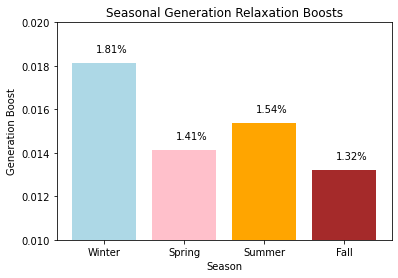

In [ ]:
plt.bar(['Winter', 'Spring', 'Summer', 'Fall'], decimal_gen_boosts, color=['lightblue', 'pink', 'orange', 'brown'])
plt.title('Seasonal Generation Relaxation Boosts')
plt.ylabel('Generation Boost')
plt.xlabel('Season')
plt.ylim(0.01, 0.02)

for i, v in enumerate(decimal_gen_boosts):
    plt.text(i - 0.1, v + 0.0005, f"{v:.2%}", color='black', fontweight='normal')

plt.show()

In [ ]:
optimization_1_results

[1056930591.2036386, 711939664.8878409, 1064489375.3974495, 739263936.1832299]

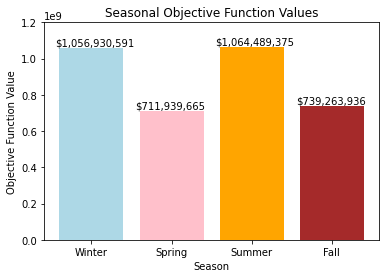

In [ ]:
# Plot objective function values

plt.bar(['Winter', 'Spring', 'Summer', 'Fall'], optimization_1_results, color=['lightblue', 'pink', 'orange', 'brown'])
plt.title('Seasonal Objective Function Values')
plt.ylabel('Objective Function Value')
plt.xlabel('Season')
plt.ylim(0, 1200000000)

# plot values on bars
for i, v in enumerate(optimization_1_results):
    plt.text(i - 0.45, v +13000000, f"${v:,.0f}", color='black', fontweight='normal')

plt.show()

## Simulation

### Functions and setup for random demand given probabilistic intervals

In [ ]:
winter_n = 90 
spring_n = 92
summer_n = 92
fall_n   = 91

def get_demand_interval(region_season_nodes, confidence=0.95): # 95% if another value not specified
    season_demand_intervals = []

    for node in region_season_nodes:
        if node.distribution == 'Normal':
            std = node.distribution_params['std']
            mean = node.distribution_params['mean']

            sem = std / (winter_n ** 0.5)
            ci = stats.norm.interval(confidence, loc=mean, scale=sem)

            season_demand_intervals.append(ci)

        elif node.distribution == 'Gamma':
            a = node.distribution_params['a']
            loc = node.distribution_params['loc']
            scale = node.distribution_params['scale']

            ci = stats.gamma.interval(confidence, a=a, loc=loc, scale=scale)

            season_demand_intervals.append(ci)
        
        elif node.distribution == 'Log-Normal':
            s = node.distribution_params['s']
            loc = node.distribution_params['loc']
            scale = node.distribution_params['scale']

            ci = stats.lognorm.interval(confidence, s=s, loc=loc, scale=scale)

            season_demand_intervals.append(ci)

        elif node.distribution == 'Rayleigh':
            loc = node.distribution_params['loc']
            scale = node.distribution_params['scale']

            ci = stats.rayleigh.interval(confidence, loc=loc, scale=scale)

            season_demand_intervals.append(ci)

        elif node.distribution == 'Cauchy':
            loc = node.distribution_params['loc']
            scale = node.distribution_params['scale']

            ci = stats.cauchy.interval(confidence, loc=loc, scale=scale)

            season_demand_intervals.append(ci)

        elif node.distribution == 'Chi2':
            df = node.distribution_params['df']
            loc = node.distribution_params['loc']
            scale = node.distribution_params['scale']

            ci = stats.chi2.interval(confidence, df=df, loc=loc, scale=scale)

            season_demand_intervals.append(ci)

        elif node.distribution == 'Exponential Power':
            b = node.distribution_params['b']
            loc = node.distribution_params['loc']
            scale = node.distribution_params['scale']

            ci = stats.exponpow.interval(confidence, b=b, loc=loc, scale=scale)

            season_demand_intervals.append(ci)

        elif node.distribution == 'Powerlaw':
            a = node.distribution_params['a']
            loc = node.distribution_params['loc']
            scale = node.distribution_params['scale']

            ci = stats.powerlaw.interval(confidence, a=a, loc=loc, scale=scale)

            season_demand_intervals.append(ci)

        elif node.distribution == 'Exponential':
            loc = node.distribution_params['loc']
            scale = node.distribution_params['scale']

            ci = stats.expon.interval(confidence, loc=loc, scale=scale)

            season_demand_intervals.append(ci)

    return season_demand_intervals

def get_random_demand(season_demand_intervals):
    season_random_numCI_demands = []

    random.seed(time.time())

    for i in range(len(season_demand_intervals)):
        season_random_numCI_demands.append(random.randint(math.floor(season_demand_intervals[i][0]), 
                                                          math.ceil(season_demand_intervals[i][1])))
    return season_random_numCI_demands

def change_node_demand(region_nodes, season_random_numCI_demands):
    i = 0 
    for node in region_nodes:
        node.demand = season_random_numCI_demands[i]
        i += 1

In [ ]:
def original_nodes():
   CAL_winter_node = Node(region_names[0], 
                        IDs[0],
                        list(region_states[0].values()),
                        CAL_distributions[0][0], 
                        CAL_distributions[0][1], 
                        winter_region_DF.loc['CAL']['Total Demand'],
                        winter_region_DF.loc['CAL']['Total Generation'],
                        region_capacities[0]) 

   CAL_spring_node = Node(region_names[0],
                        IDs[0],
                        list(region_states[0].values()),
                        CAL_distributions[1][0],
                        CAL_distributions[1][1],
                        spring_region_DF.loc['CAL']['Total Demand'],
                        spring_region_DF.loc['CAL']['Total Generation'],
                        region_capacities[0]) 

   CAL_summer_node = Node(region_names[0], 
                        IDs[0],
                        list(region_states[0].values()), 
                        CAL_distributions[2][0],
                        CAL_distributions[2][1], 
                        summer_region_DF.loc['CAL']['Total Demand'],
                        summer_region_DF.loc['CAL']['Total Generation'],
                        region_capacities[0]) 

   CAL_fall_node = Node(region_names[0],
                        IDs[0],
                        list(region_states[0].values()),
                        CAL_distributions[3][0],
                        CAL_distributions[3][1], 
                        fall_region_DF.loc['CAL']['Total Demand'], 
                        fall_region_DF.loc['CAL']['Total Generation'],
                        region_capacities[0])

   # "CAR", "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX" (1)
      
   CAR_winter_node = Node(region_names[1],
                        IDs[1],
                        list(region_states[1].values()),
                        CAR_distributions[0][0],
                        CAR_distributions[0][1], 
                        winter_region_DF.loc['CAR']['Total Demand'], 
                        winter_region_DF.loc['CAR']['Total Generation'],
                        region_capacities[1])

   CAR_spring_node = Node(region_names[1],
                        IDs[1],
                        list(region_states[1].values()),
                        CAR_distributions[1][0],
                        CAR_distributions[1][1], 
                        spring_region_DF.loc['CAR']['Total Demand'], 
                        spring_region_DF.loc['CAR']['Total Generation'],
                        region_capacities[1])

   CAR_summer_node = Node(region_names[1],
                        IDs[1],
                        list(region_states[1].values()),
                        CAR_distributions[2][0],
                        CAR_distributions[2][1], 
                        summer_region_DF.loc['CAR']['Total Demand'], 
                        summer_region_DF.loc['CAR']['Total Generation'],
                        region_capacities[1])

   CAR_fall_node = Node(region_names[1],
                        IDs[1],
                        list(region_states[1].values()),
                        CAR_distributions[3][0],
                        CAR_distributions[3][1], 
                        fall_region_DF.loc['CAR']['Total Demand'], 
                        fall_region_DF.loc['CAR']['Total Generation'],
                        region_capacities[1])

   # "CENT", "FLA", "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX" (2)

   CENT_winter_node = Node(region_names[2],
                           IDs[2],
                        list(region_states[2].values()),
                        CENT_distributions[0][0],
                        CENT_distributions[0][1], 
                        winter_region_DF.loc['CENT']['Total Demand'], 
                        winter_region_DF.loc['CENT']['Total Generation'],
                        region_capacities[2])

   CENT_spring_node = Node(region_names[2],
                           IDs[2],
                        list(region_states[2].values()),
                        CENT_distributions[1][0],
                        CENT_distributions[1][1], 
                        spring_region_DF.loc['CENT']['Total Demand'], 
                        spring_region_DF.loc['CENT']['Total Generation'],
                        region_capacities[2])

   CENT_summer_node = Node(region_names[2],
                           IDs[2],
                        list(region_states[2].values()),
                        CENT_distributions[2][0],
                        CENT_distributions[2][1], 
                        summer_region_DF.loc['CENT']['Total Demand'], 
                        summer_region_DF.loc['CENT']['Total Generation'],
                        region_capacities[2])

   CENT_fall_node = Node(region_names[2],
                        IDs[2],
                        list(region_states[2].values()),
                        CENT_distributions[3][0],
                        CENT_distributions[3][1], 
                        fall_region_DF.loc['CENT']['Total Demand'], 
                        fall_region_DF.loc['CENT']['Total Generation'],
                        region_capacities[2])

   # FLA, "MIDA", "MIDW", "NE", "NW", "NY", "SE", "SW", "TEN", "TEX" (3)

   FLA_winter_node = Node(region_names[3],
                        IDs[3],
                        list(region_states[3].values()),
                        FLA_distributions[0][0],
                        FLA_distributions[0][1], 
                        winter_region_DF.loc['FLA']['Total Demand'], 
                        winter_region_DF.loc['FLA']['Total Generation'],
                        region_capacities[3])

   FLA_spring_node = Node(region_names[3],
                        IDs[3],
                        list(region_states[3].values()),
                        FLA_distributions[1][0],
                        FLA_distributions[1][1], 
                        spring_region_DF.loc['FLA']['Total Demand'], 
                        spring_region_DF.loc['FLA']['Total Generation'],
                        region_capacities[3])

   FLA_summer_node = Node(region_names[3],
                        IDs[3],
                        list(region_states[3].values()),
                        FLA_distributions[2][0],
                        FLA_distributions[2][1], 
                        summer_region_DF.loc['FLA']['Total Demand'], 
                        summer_region_DF.loc['FLA']['Total Generation'],
                        region_capacities[3])

   FLA_fall_node = Node(region_names[3],
                        IDs[3],
                        list(region_states[3].values()),
                        FLA_distributions[3][0],
                        FLA_distributions[3][1], 
                        fall_region_DF.loc['FLA']['Total Demand'], 
                        fall_region_DF.loc['FLA']['Total Generation'],
                        region_capacities[3])

   # MIDA, MIDW, NE, NW, NY, SE, SW, TEN, TEX (4)

   MIDA_winter_node = Node(region_names[4],
                           IDs[4],
                        list(region_states[4].values()),
                        MIDA_distributions[0][0],
                        MIDA_distributions[0][1], 
                        winter_region_DF.loc['MIDA']['Total Demand'], 
                        winter_region_DF.loc['MIDA']['Total Generation'],
                        region_capacities[4])

   MIDA_spring_node = Node(region_names[4],
                           IDs[4],
                        list(region_states[4].values()),
                        MIDA_distributions[1][0],
                        MIDA_distributions[1][1], 
                        spring_region_DF.loc['MIDA']['Total Demand'], 
                        spring_region_DF.loc['MIDA']['Total Generation'],
                        region_capacities[4])

   MIDA_summer_node = Node(region_names[4],
                           IDs[4],
                        list(region_states[4].values()),
                        MIDA_distributions[2][0],
                        MIDA_distributions[2][1], 
                        summer_region_DF.loc['MIDA']['Total Demand'], 
                        summer_region_DF.loc['MIDA']['Total Generation'],
                        region_capacities[4])

   MIDA_fall_node = Node(region_names[4],
                        IDs[4],
                        list(region_states[4].values()),
                        MIDA_distributions[3][0],
                        MIDA_distributions[3][1], 
                        fall_region_DF.loc['MIDA']['Total Demand'], 
                        fall_region_DF.loc['MIDA']['Total Generation'],
                        region_capacities[4])

   # MIDW, NE, NW, NY, SE, SW, TEN, TEX (5)

   MIDW_winter_node = Node(region_names[5],
                           IDs[5],
                        list(region_states[5].values()),
                        MIDA_distributions[0][0],
                        MIDA_distributions[0][1], 
                        winter_region_DF.loc['MIDW']['Total Demand'], 
                        winter_region_DF.loc['MIDW']['Total Generation'],
                        region_capacities[5])

   MIDW_spring_node = Node(region_names[5],
                           IDs[5],
                        list(region_states[5].values()),
                        MIDA_distributions[1][0],
                        MIDA_distributions[1][1], 
                        spring_region_DF.loc['MIDW']['Total Demand'], 
                        spring_region_DF.loc['MIDW']['Total Generation'],
                        region_capacities[5])

   MIDW_summer_node = Node(region_names[5],
                           IDs[5],
                        list(region_states[5].values()),
                        MIDA_distributions[2][0],
                        MIDA_distributions[2][1], 
                        summer_region_DF.loc['MIDW']['Total Demand'], 
                        summer_region_DF.loc['MIDW']['Total Generation'],
                        region_capacities[5])

   MIDW_fall_node = Node(region_names[5],
                        IDs[5],
                        list(region_states[5].values()),
                        MIDA_distributions[3][0],
                        MIDA_distributions[3][1], 
                        fall_region_DF.loc['MIDW']['Total Demand'], 
                        fall_region_DF.loc['MIDW']['Total Generation'],
                        region_capacities[5])

   # NE, NW, NY, SE, SW, TEN, TEX (6)

   NE_winter_node = Node(region_names[6],
                        IDs[6],
                        list(region_states[6].values()),
                        NE_distributions[0][0],
                        NE_distributions[0][1], 
                        winter_region_DF.loc['NE']['Total Demand'], 
                        winter_region_DF.loc['NE']['Total Generation'],
                        region_capacities[6])

   NE_spring_node = Node(region_names[6],
                        IDs[6],
                        list(region_states[6].values()),
                        NE_distributions[1][0],
                        NE_distributions[1][1], 
                        spring_region_DF.loc['NE']['Total Demand'], 
                        spring_region_DF.loc['NE']['Total Generation'],
                        region_capacities[6])

   NE_summer_node = Node(region_names[6],
                        IDs[6],
                        list(region_states[6].values()),
                        NE_distributions[2][0],
                        NE_distributions[2][1], 
                        summer_region_DF.loc['NE']['Total Demand'], 
                        summer_region_DF.loc['NE']['Total Generation'],
                        region_capacities[6])

   NE_fall_node = Node(region_names[6],
                     IDs[6],
                        list(region_states[6].values()),
                        NE_distributions[3][0],
                        NE_distributions[3][1], 
                        fall_region_DF.loc['NE']['Total Demand'], 
                        fall_region_DF.loc['NE']['Total Generation'],
                        region_capacities[6])

   # NW, NY, SE, SW, TEN, TEX (7)

   NW_winter_node = Node(region_names[7],
                        IDs[7],
                        list(region_states[7].values()),
                        NW_distributions[0][0],
                        NW_distributions[0][1], 
                        winter_region_DF.loc['NW']['Total Demand'], 
                        winter_region_DF.loc['NW']['Total Generation'],
                        region_capacities[7])

   NW_spring_node = Node(region_names[7],
                        IDs[7],
                        list(region_states[7].values()),
                        NW_distributions[1][0],
                        NW_distributions[1][1], 
                        spring_region_DF.loc['NW']['Total Demand'], 
                        spring_region_DF.loc['NW']['Total Generation'],
                        region_capacities[7])

   NW_summer_node = Node(region_names[7],
                        IDs[7],
                        list(region_states[7].values()),
                        NW_distributions[2][0],
                        NW_distributions[2][1], 
                        summer_region_DF.loc['NW']['Total Demand'], 
                        summer_region_DF.loc['NW']['Total Generation'],
                        region_capacities[7])

   NW_fall_node = Node(region_names[7],
                     IDs[7],
                        list(region_states[7].values()),
                        NW_distributions[3][0],
                        NW_distributions[3][1], 
                        fall_region_DF.loc['NW']['Total Demand'], 
                        fall_region_DF.loc['NW']['Total Generation'],
                        region_capacities[7])

   # NY, SE, SW, TEN, TEX (8)

   NY_winter_node = Node(region_names[8],
                        IDs[8],
                        list(region_states[8].values()),
                        NY_distributions[0][0],
                        NY_distributions[0][1], 
                        winter_region_DF.loc['NY']['Total Demand'], 
                        winter_region_DF.loc['NY']['Total Generation'],
                        region_capacities[8])

   NY_spring_node = Node(region_names[8],
                        IDs[8],
                        list(region_states[8].values()),
                        NY_distributions[1][0],
                        NY_distributions[1][1], 
                        spring_region_DF.loc['NY']['Total Demand'], 
                        spring_region_DF.loc['NY']['Total Generation'],
                        region_capacities[8])

   NY_summer_node = Node(region_names[8],
                        IDs[8],
                        list(region_states[8].values()),
                        NY_distributions[2][0],
                        NY_distributions[2][1], 
                        summer_region_DF.loc['NY']['Total Demand'], 
                        summer_region_DF.loc['NY']['Total Generation'],
                        region_capacities[8])

   NY_fall_node = Node(region_names[8],
                     IDs[8],
                        list(region_states[8].values()),
                        NY_distributions[3][0],
                        NY_distributions[3][1], 
                        fall_region_DF.loc['NY']['Total Demand'], 
                        fall_region_DF.loc['NY']['Total Generation'],
                        region_capacities[8])

   # SE, SW, TEN, TEX (9)

   SE_winter_node = Node(region_names[9],
                        IDs[9],
                        list(region_states[9].values()),
                        SE_distributions[0][0],
                        SE_distributions[0][1], 
                        winter_region_DF.loc['SE']['Total Demand'], 
                        winter_region_DF.loc['SE']['Total Generation'],
                        region_capacities[9])

   SE_spring_node = Node(region_names[9],
                        IDs[9],
                        list(region_states[9].values()),
                        SE_distributions[1][0],
                        SE_distributions[1][1], 
                        spring_region_DF.loc['SE']['Total Demand'], 
                        spring_region_DF.loc['SE']['Total Generation'],
                        region_capacities[9])

   SE_summer_node = Node(region_names[9],
                        IDs[9],
                        list(region_states[9].values()),
                        SE_distributions[2][0],
                        SE_distributions[2][1], 
                        summer_region_DF.loc['SE']['Total Demand'], 
                        summer_region_DF.loc['SE']['Total Generation'],
                        region_capacities[9])

   SE_fall_node = Node(region_names[9],
                     IDs[9],
                        list(region_states[9].values()),
                        SE_distributions[3][0],
                        SE_distributions[3][1], 
                        fall_region_DF.loc['SE']['Total Demand'], 
                        fall_region_DF.loc['SE']['Total Generation'],
                        region_capacities[9])

   # SW, TEN, TEX (10)

   SW_winter_node = Node(region_names[10],
                        IDs[10],
                        list(region_states[10].values()),
                        SW_distributions[0][0],
                        SW_distributions[0][1], 
                        winter_region_DF.loc['SW']['Total Demand'], 
                        winter_region_DF.loc['SW']['Total Generation'],
                        region_capacities[10])

   SW_spring_node = Node(region_names[10],
                        IDs[10],
                        list(region_states[10].values()),
                        SW_distributions[1][0],
                        SW_distributions[1][1], 
                        spring_region_DF.loc['SW']['Total Demand'], 
                        spring_region_DF.loc['SW']['Total Generation'],
                        region_capacities[10])

   SW_summer_node = Node(region_names[10],
                        IDs[10],
                        list(region_states[10].values()),
                        SW_distributions[2][0],
                        SW_distributions[2][1], 
                        summer_region_DF.loc['SW']['Total Demand'], 
                        summer_region_DF.loc['SW']['Total Generation'],
                        region_capacities[10])

   SW_fall_node = Node(region_names[10],
                     IDs[10],
                        list(region_states[10].values()),
                        SW_distributions[3][0],
                        SW_distributions[3][1], 
                        fall_region_DF.loc['SW']['Total Demand'], 
                        fall_region_DF.loc['SW']['Total Generation'],
                        region_capacities[10])

   # TEN, TEX (11)

   TEN_winter_node = Node(region_names[11],
                        IDs[11],
                        list(region_states[11].values()),
                        TEN_distributions[0][0],
                        TEN_distributions[0][1], 
                        winter_region_DF.loc['TEN']['Total Demand'], 
                        winter_region_DF.loc['TEN']['Total Generation'],
                        region_capacities[11])

   TEN_spring_node = Node(region_names[11],
                        IDs[11],
                        list(region_states[11].values()),
                        TEN_distributions[1][0],
                        TEN_distributions[1][1], 
                        spring_region_DF.loc['TEN']['Total Demand'], 
                        spring_region_DF.loc['TEN']['Total Generation'],
                        region_capacities[11])

   TEN_summer_node = Node(region_names[11],
                        IDs[11],
                        list(region_states[11].values()),
                        TEN_distributions[2][0],
                        TEN_distributions[2][1], 
                        summer_region_DF.loc['TEN']['Total Demand'], 
                        summer_region_DF.loc['TEN']['Total Generation'],
                        region_capacities[11])

   TEN_fall_node = Node(region_names[11],
                        IDs[11],
                        list(region_states[11].values()),
                        TEN_distributions[3][0],
                        TEN_distributions[3][1], 
                        fall_region_DF.loc['TEN']['Total Demand'], 
                        fall_region_DF.loc['TEN']['Total Generation'],
                        region_capacities[11])

   # TEX (12)

   TEX_winter_node = Node(region_names[12],
                        IDs[12],
                        list(region_states[12].values()),
                        TEX_distributions[0][0],
                        TEX_distributions[0][1], 
                        winter_region_DF.loc['TEX']['Total Demand'], 
                        winter_region_DF.loc['TEX']['Total Generation'],
                        region_capacities[12])

   TEX_spring_node = Node(region_names[12],
                        IDs[12],
                        list(region_states[12].values()),
                        TEX_distributions[1][0],
                        TEX_distributions[1][1], 
                        spring_region_DF.loc['TEX']['Total Demand'], 
                        spring_region_DF.loc['TEX']['Total Generation'],
                        region_capacities[12])

   TEX_summer_node = Node(region_names[12],
                        IDs[12],
                        list(region_states[12].values()),
                        TEX_distributions[2][0],
                        TEX_distributions[2][1], 
                        summer_region_DF.loc['TEX']['Total Demand'], 
                        summer_region_DF.loc['TEX']['Total Generation'],
                        region_capacities[12])

   TEX_fall_node = Node(region_names[12],
                        IDs[12],
                        list(region_states[12].values()),
                        TEX_distributions[3][0],
                        TEX_distributions[3][1], 
                        fall_region_DF.loc['TEX']['Total Demand'], 
                        fall_region_DF.loc['TEX']['Total Generation'],
                        region_capacities[12])

   region_winter_nodes = [CAL_winter_node, CAR_winter_node , CENT_winter_node, 
                        FLA_winter_node, MIDA_winter_node, MIDW_winter_node, 
                        NE_winter_node , NW_winter_node  , NY_winter_node  , 
                        SE_winter_node , SW_winter_node  , TEN_winter_node , TEX_winter_node]

   region_spring_nodes = [CAL_spring_node, CAR_spring_node , CENT_spring_node, 
                        FLA_spring_node, MIDA_spring_node, MIDW_spring_node, 
                        NE_spring_node , NW_spring_node  , NY_spring_node  , 
                        SE_spring_node , SW_spring_node  , TEN_spring_node , TEX_spring_node]

   region_summer_nodes = [CAL_summer_node, CAR_summer_node , CENT_summer_node, 
                        FLA_summer_node, MIDA_summer_node, MIDW_summer_node, 
                        NE_summer_node  , NW_summer_node   , NY_summer_node  , 
                        SE_summer_node , SW_summer_node   , TEN_summer_node , TEX_summer_node]

   region_fall_nodes = [CAL_fall_node, CAR_fall_node , CENT_fall_node, 
                        FLA_fall_node, MIDA_fall_node, MIDW_fall_node, 
                        NE_fall_node  , NW_fall_node   , NY_fall_node  , 
                        SE_fall_node , SW_fall_node   , TEN_fall_node , TEX_fall_node]
   
   return region_winter_nodes, region_spring_nodes, region_summer_nodes, region_fall_nodes

### Simulations

In [ ]:
winter_opti_simu_results = []
winter_simu_gen_boosts = []

spring_opti_simu_results = []
spring_simu_gen_boosts = []

summer_opti_simu_results = []
summer_simu_gen_boosts = []

fall_opti_simu_results = []
fall_simu_gen_boosts = []

num_simulations = 10

for i in range(num_simulations):

    # WINTER /\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\

    region_winter_nodes, region_spring_nodes, region_summer_nodes, region_fall_nodes = original_nodes()

    winter_demand_intervals = get_demand_interval(region_winter_nodes, 0.9)
    
    winter_random_90CI_demands = get_random_demand(winter_demand_intervals) # Making it random

    change_node_demand(region_winter_nodes, winter_random_90CI_demands)

    # balance_demand_generation(region_winter_nodes)
    winter_region_graph_22 = create_region_graph(seasonal_winter_2022, region_winter_nodes, variance_winter2022)

    demand_df = pd.DataFrame(nx.get_node_attributes(winter_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

    generation_df = pd.DataFrame(nx.get_node_attributes(winter_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

    edge_variance = nx.get_edge_attributes(winter_region_graph_22, 'variance') 
    variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                            columns=['i', 'j', 'variance']).set_index(['i', 'j'])

    edge_cost = nx.get_edge_attributes(winter_region_graph_22, 'cost') 
    cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                            columns=['i', 'j', 'cost']).set_index(['i', 'j'])

    # NOT YET CAPACITY

    edge_cap = nx.get_edge_attributes(winter_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
    capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                            columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 

    c = cost_df.copy()
    v = variance_df.copy()
    d = demand_df.copy()
    g = generation_df.copy()
    cap = capacity_df.copy()

    cap['capacity'] = 220000000 # setting as the highest generation for now

    gen_boost = sum(d['demand'])/sum(g['generation'])
    winter_simu_gen_boosts.append(gen_boost)
    g['generation'] = (gen_boost) * g['generation']

    # Create model
    model = gp.Model()

    # Decision Variables
    x = gppd.add_vars(model, c, name='x')  

    model.update()
    
    # Objective function
    model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE) 
   
    # Constraints 
    cap_constraint = gppd.add_constrs( 
        model,
        x,
        GRB.LESS_EQUAL,
        cap['capacity'],
        name='cap_constraint'
    )

    non_negativity = gppd.add_constrs(
        model,
        x,
        GRB.GREATER_EQUAL,
        0,
        name='non_negativity'
    )

    dem_constraint = gppd.add_constrs(
        model,
        g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
        GRB.EQUAL,
        # limit without generation relaxation: 0.8249
        d['demand'], # 0.1813 generation relaxation
        name='dem_constraint'
    )

    model.optimize()
    
    try:
        winter_opti_simu_results.append(model.objVal) # append the results to the list
    except AttributeError:
        pass


    # SPRING /\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\

    region_winter_nodes, region_spring_nodes, region_summer_nodes, region_fall_nodes = original_nodes()

    spring_demand_intervals = get_demand_interval(region_spring_nodes, 0.9)
    
    spring_random_90CI_demands = get_random_demand(spring_demand_intervals) # Making it random

    change_node_demand(region_spring_nodes, spring_random_90CI_demands)

    # balance_demand_generation(region_winter_nodes)
    spring_region_graph_22 = create_region_graph(seasonal_spring_2022, region_spring_nodes, variance_spring2022)

    demand_df = pd.DataFrame(nx.get_node_attributes(spring_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

    generation_df = pd.DataFrame(nx.get_node_attributes(spring_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

    edge_variance = nx.get_edge_attributes(spring_region_graph_22, 'variance') 
    variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                            columns=['i', 'j', 'variance']).set_index(['i', 'j'])

    edge_cost = nx.get_edge_attributes(spring_region_graph_22, 'cost') 
    cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                            columns=['i', 'j', 'cost']).set_index(['i', 'j'])

    # NOT YET CAPACITY

    edge_cap = nx.get_edge_attributes(spring_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
    capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                            columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 

    c = cost_df.copy()
    v = variance_df.copy()
    d = demand_df.copy()
    g = generation_df.copy()
    cap = capacity_df.copy()

    # With penalty for data formatting the model

    CAL_cost_row = pd.DataFrame({'cost': 9999}, index=pd.MultiIndex.from_tuples([('CAL', 'CAR')], names=['i', 'j']))
    c = pd.concat([CAL_cost_row, c])

    CAL_cap_row = pd.DataFrame({'capacity': 200000}, index=pd.MultiIndex.from_tuples([('CAL', 'CAR')], names=['i', 'j']))
    cap = pd.concat([CAL_cap_row, cap])

    cap['capacity'] = 220000000 # setting as the highest generation for now

    gen_boost = sum(d['demand'])/sum(g['generation'])
    spring_simu_gen_boosts.append(gen_boost)
    g['generation'] = (gen_boost) * g['generation']

    # Create model
    model = gp.Model()

    # Decision Variables
    x = gppd.add_vars(model, c, name='x')  

    model.update()
    
    # Objective function
    model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE) 
   
    # Constraints 
    cap_constraint = gppd.add_constrs( 
        model,
        x,
        GRB.LESS_EQUAL,
        cap['capacity'],
        name='cap_constraint'
    )

    non_negativity = gppd.add_constrs(
        model,
        x,
        GRB.GREATER_EQUAL,
        0,
        name='non_negativity'
    )

    dem_constraint = gppd.add_constrs(
        model,
        g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
        GRB.EQUAL,
        # limit without generation relaxation: 0.8249
        d['demand'], # 0.1813 generation relaxation
        name='dem_constraint'
    )

    model.optimize()
    
    try:
        spring_opti_simu_results.append(model.objVal) # append the results to the list
    except AttributeError:
        pass

    # SUMMER /\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\

    region_winter_nodes, region_spring_nodes, region_summer_nodes, region_summer_nodes = original_nodes()

    summer_demand_intervals = get_demand_interval(region_summer_nodes, 0.9)
    
    summer_random_90CI_demands = get_random_demand(summer_demand_intervals) # Making it random

    change_node_demand(region_summer_nodes, summer_random_90CI_demands) 

    # balance_demand_generation(region_winter_nodes)
    summer_region_graph_22 = create_region_graph(seasonal_summer_2022, region_summer_nodes, variance_summer2022)

    demand_df = pd.DataFrame(nx.get_node_attributes(summer_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

    generation_df = pd.DataFrame(nx.get_node_attributes(summer_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

    edge_variance = nx.get_edge_attributes(summer_region_graph_22, 'variance')
    variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                            columns=['i', 'j', 'variance']).set_index(['i', 'j'])

    edge_cost = nx.get_edge_attributes(summer_region_graph_22, 'cost')
    cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                            columns=['i', 'j', 'cost']).set_index(['i', 'j'])

    # NOT YET CAPACITY

    edge_cap = nx.get_edge_attributes(summer_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
    capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                            columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 

    c = cost_df.copy()
    v = variance_df.copy()
    d = demand_df.copy()
    g = generation_df.copy()
    cap = capacity_df.copy()

    # With penalty for data formatting the model

    FLA_cost_row = pd.DataFrame({'cost': 9999}, index=pd.MultiIndex.from_tuples([('FLA', 'CAR')], names=['i', 'j']))
    c = pd.concat([FLA_cost_row, c])

    FLA_cap_row = pd.DataFrame({'capacity': 1}, index=pd.MultiIndex.from_tuples([('FLA', 'CAR')], names=['i', 'j']))
    cap = pd.concat([FLA_cap_row, cap])

    TEX_cost_row = pd.DataFrame({'cost': 9999}, index=pd.MultiIndex.from_tuples([('TEX', 'CAR')], names=['i', 'j']))
    c = pd.concat([TEX_cost_row, c])

    TEX_cap_row = pd.DataFrame({'capacity': 1}, index=pd.MultiIndex.from_tuples([('TEX', 'CAR')], names=['i', 'j']))
    cap = pd.concat([TEX_cap_row, cap])

    cap['capacity'] = 220000000 # setting as the highest generation for now

    gen_boost = sum(d['demand'])/sum(g['generation'])
    summer_simu_gen_boosts.append(gen_boost)
    g['generation'] = (gen_boost) * g['generation']

    # Create model
    model = gp.Model()

    # Decision Variables
    x = gppd.add_vars(model, c, name='x')  

    model.update()
    
    # Objective function
    model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE) 
   
    # Constraints 
    cap_constraint = gppd.add_constrs( 
        model,
        x,
        GRB.LESS_EQUAL,
        cap['capacity'],
        name='cap_constraint'
    )

    non_negativity = gppd.add_constrs(
        model,
        x,
        GRB.GREATER_EQUAL,
        0,
        name='non_negativity'
    )

    dem_constraint = gppd.add_constrs(
        model,
        g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
        GRB.EQUAL,
        # limit without generation relaxation: 0.8249
        d['demand'], # 0.1813 generation relaxation
        name='dem_constraint'
    )

    model.optimize()
        
    try:
        summer_opti_simu_results.append(model.objVal) # append the results to the list
    except AttributeError:
        pass

    # FALL /\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\/\

    region_winter_nodes, region_spring_nodes, region_summer_nodes, region_fall_nodes = original_nodes()

    fall_demand_intervals = get_demand_interval(region_fall_nodes, 0.9)
    
    fall_random_90CI_demands = get_random_demand(fall_demand_intervals) # Making it random

    change_node_demand(region_fall_nodes, fall_random_90CI_demands)

    # balance_demand_generation(region_winter_nodes)
    fall_region_graph_22 = create_region_graph(seasonal_fall_2022, region_fall_nodes, variance_fall2022)

    demand_df = pd.DataFrame(nx.get_node_attributes(fall_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

    generation_df = pd.DataFrame(nx.get_node_attributes(fall_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])
    
    edge_variance = nx.get_edge_attributes(fall_region_graph_22, 'variance')
    variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                            columns=['i', 'j', 'variance']).set_index(['i', 'j'])

    edge_cost = nx.get_edge_attributes(fall_region_graph_22, 'cost')
    cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                            columns=['i', 'j', 'cost']).set_index(['i', 'j'])

    # NOT YET CAPACITY

    edge_cap = nx.get_edge_attributes(fall_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
    capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                            columns=['i', 'j', 'capacity']).set_index(['i', 'j'])
    
    c = cost_df.copy()
    v = variance_df.copy()
    d = demand_df.copy()
    g = generation_df.copy()
    cap = capacity_df.copy()

    cap['capacity'] = 220000000 # setting as the highest generation for now

    gen_boost = sum(d['demand'])/sum(g['generation'])
    fall_simu_gen_boosts.append(gen_boost)
    g['generation'] = (gen_boost) * g['generation']
    
    # Create model
    model = gp.Model()

    # Decision Variables
    x = gppd.add_vars(model, c, name='x')

    model.update()

    # Objective function
    model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE)

    # Constraints
    cap_constraint = gppd.add_constrs(
        model,
        x,
        GRB.LESS_EQUAL,
        cap['capacity'],
        name='cap_constraint' 
    )

    non_negativity = gppd.add_constrs(
        model,
        x,
        GRB.GREATER_EQUAL,  
        0,
        name='non_negativity'
    )

    dem_constraint = gppd.add_constrs(
        model,
        g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
        GRB.EQUAL,
        # limit without generation relaxation: 0.8249
        d['demand'], # 0.1813 generation relaxation
        name='dem_constraint'
    )

    model.optimize()

    try:
        fall_opti_simu_results.append(model.objVal) # append the results to the list
    except AttributeError:
        pass

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 columns and 124 nonzeros
Model fingerprint: 0x0bb15585
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 3e+01]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e+02, 2e+08]
Presolve removed 67 rows and 7 columns
Presolve time: 0.01s
Presolved: 8 rows, 24 columns, 41 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    9.7562964e+06   1.075223e+05   0.000000e+00      0s
       8    2.1321437e+07   0.000000e+00   0.000000e+00      0s

Solved in 8 iterations and 0.01 seconds (0.00 work units)
Optimal objective  2.132143711e+07
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 73 rows, 30 columns

Infeasible model
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 columns and 124 nonzeros
Model fingerprint: 0x4258225b
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 1e+04]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e+03, 2e+08]
Presolve removed 65 rows and 4 columns
Presolve time: 0.00s
Presolved: 10 rows, 27 columns, 46 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    3.8519572e+06   1.196826e+05   0.000000e+00      0s
      12    1.8265234e+07   0.000000e+00   0.000000e+00      0s

Solved in 12 iterations and 0.01 seconds (0.00 work units)
Optimal objective  1.826523392e+07
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 

In [ ]:
region_winter_nodes, region_spring_nodes, region_summer_nodes, region_fall_nodes = original_nodes()

spring_demand_intervals = get_demand_interval(region_spring_nodes, 0.9)

spring_random_90CI_demands = get_random_demand(spring_demand_intervals) # Making it random

change_node_demand(region_spring_nodes, spring_random_90CI_demands)

# balance_demand_generation(region_winter_nodes)
spring_region_graph_22 = create_region_graph(seasonal_spring_2022, region_spring_nodes, variance_spring2022)

demand_df = pd.DataFrame(nx.get_node_attributes(spring_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

generation_df = pd.DataFrame(nx.get_node_attributes(spring_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

edge_variance = nx.get_edge_attributes(spring_region_graph_22, 'variance') 
variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                        columns=['i', 'j', 'variance']).set_index(['i', 'j'])

edge_cost = nx.get_edge_attributes(spring_region_graph_22, 'cost') 
cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                        columns=['i', 'j', 'cost']).set_index(['i', 'j'])

# NOT YET CAPACITY

edge_cap = nx.get_edge_attributes(spring_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                        columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 

c = cost_df.copy()
v = variance_df.copy()
d = demand_df.copy()
g = generation_df.copy()
cap = capacity_df.copy()

gen_boost = (sum(d['demand']))/(sum(g['generation']))
spring_simu_gen_boosts.append(gen_boost)
g['generation'] = (gen_boost) * g['generation']

# With penalty for data formatting the model

CAL_cost_row = pd.DataFrame({'cost': 9999}, index=pd.MultiIndex.from_tuples([('CAL', 'CAR')], names=['i', 'j']))
c = pd.concat([CAL_cost_row, c])

CAL_cap_row = pd.DataFrame({'capacity': 200000}, index=pd.MultiIndex.from_tuples([('CAL', 'CAR')], names=['i', 'j']))
cap = pd.concat([CAL_cap_row, cap])

cap['capacity'] = 220000000 # setting as the highest generation for now

# Create model
model = gp.Model()

# Decision Variables
x = gppd.add_vars(model, c, name='x')  

model.update()

# Objective function
model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE) 

# Constraints 
cap_constraint = gppd.add_constrs( 
    model,
    x,
    GRB.LESS_EQUAL,
    cap['capacity'],
    name='cap_constraint'
)

non_negativity = gppd.add_constrs(
    model,
    x,
    GRB.GREATER_EQUAL,
    0,
    name='non_negativity'
)

dem_constraint = gppd.add_constrs(
    model,
    g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
    GRB.EQUAL,
    # limit without generation relaxation: 0.8249
    d['demand'], # 0.1813 generation relaxation
    name='dem_constraint'
)

model.optimize()

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 73 rows, 30 columns and 120 nonzeros
Model fingerprint: 0x9b7b16e6
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 1e+04]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+03, 2e+08]
Presolve removed 65 rows and 8 columns
Presolve time: 0.01s
Presolved: 8 rows, 22 columns, 40 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.6455769e+06   1.868801e+05   0.000000e+00      0s
       8    2.8427271e+07   0.000000e+00   0.000000e+00      0s

Solved in 8 iterations and 0.01 seconds (0.00 work units)
Optimal objective  2.842727066e+07


In [ ]:
print(f"Total generation: {sum(g['generation'])}")
print(f"Total demand: {sum(d['demand'])}")
print(f"Generation Boost: {gen_boost:.4f}%")

Total generation: 10297291.0
Total demand: 10297291
Generation Boost: 0.0110%


In [ ]:
# Create model
model = gp.Model()

# Decision Variables
x = gppd.add_vars(model, c, name='x')  

model.update()

# Objective function
model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE) 

# Constraints 
cap_constraint = gppd.add_constrs( 
    model,
    x,
    GRB.LESS_EQUAL,
    cap['capacity'],
    name='cap_constraint'
)

non_negativity = gppd.add_constrs(
    model,
    x,
    GRB.GREATER_EQUAL,
    0,
    name='non_negativity'
)

dem_constraint = gppd.add_constrs(
    model,
    g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
    GRB.EQUAL,
    # limit without generation relaxation: 0.8249
    d['demand'], # 0.1813 generation relaxation
    name='dem_constraint'
)

model.optimize()

try:
    spring_opti_simu_results.append(model.objVal) # append the results to the list
except AttributeError:
    pass

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 73 rows, 30 columns and 120 nonzeros
Model fingerprint: 0x9b7b16e6
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 1e+04]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+03, 2e+08]
Presolve removed 65 rows and 8 columns
Presolve time: 0.00s
Presolved: 8 rows, 22 columns, 40 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.6455769e+06   1.868801e+05   0.000000e+00      0s
       8    2.8427271e+07   0.000000e+00   0.000000e+00      0s

Solved in 8 iterations and 0.00 seconds (0.00 work units)
Optimal objective  2.842727066e+07


In [ ]:
print(f"Winter: {len(winter_opti_simu_results)} -> {((len(winter_opti_simu_results))/(num_simulations))*100}%")
print(f"Spring: {len(spring_opti_simu_results)} -> {((len(spring_opti_simu_results))/(num_simulations))*100}%")
print(f"Summer: {len(summer_opti_simu_results)} -> {((len(summer_opti_simu_results))/(num_simulations))*100}%")
print(f"Fall:   {len(fall_opti_simu_results)} -> {((len(fall_opti_simu_results))/(num_simulations))*100}%")

Winter: 10 -> 100.0%
Spring: 3 -> 30.0%
Summer: 10 -> 100.0%
Fall:   10 -> 100.0%


In [ ]:
print(f"Winter: {len(winter_simu_gen_boosts)}")
print(f"Spring: {len(spring_simu_gen_boosts)}")
print(f"Summer: {len(summer_simu_gen_boosts)}")
print(f"Fall: {len(fall_simu_gen_boosts)}")

Winter: 10
Spring: 11
Summer: 10
Fall: 10


In [ ]:
# get the mean of the generation boosts

winter_mean_gen_boost = sum(winter_simu_gen_boosts)/len(winter_simu_gen_boosts)
spring_mean_gen_boost = sum(spring_simu_gen_boosts)/len(spring_simu_gen_boosts)
summer_mean_gen_boost = sum(summer_simu_gen_boosts)/len(summer_simu_gen_boosts)
fall_mean_gen_boost = sum(fall_simu_gen_boosts)/len(fall_simu_gen_boosts)

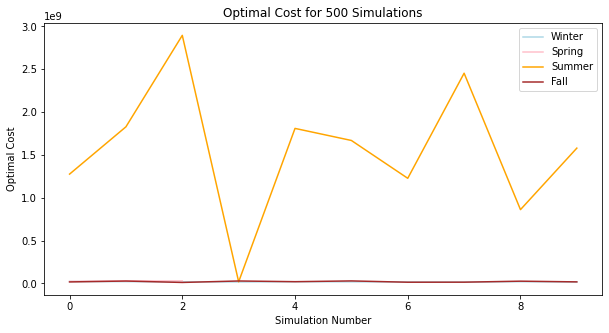

In [ ]:
# make a line plot comparing the results of each season
# use the colors corresponding to the seasons

fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(winter_opti_simu_results, color='lightblue', label='Winter')
ax.plot(spring_opti_simu_results, color='pink', label='Spring')
ax.plot(summer_opti_simu_results, color='orange', label='Summer')
ax.plot(fall_opti_simu_results, color='brown', label='Fall')

ax.set_xlabel('Simulation Number')
ax.set_ylabel('Optimal Cost')
ax.set_title('Optimal Cost for 500 Simulations')
ax.legend(loc='upper right')

plt.show()

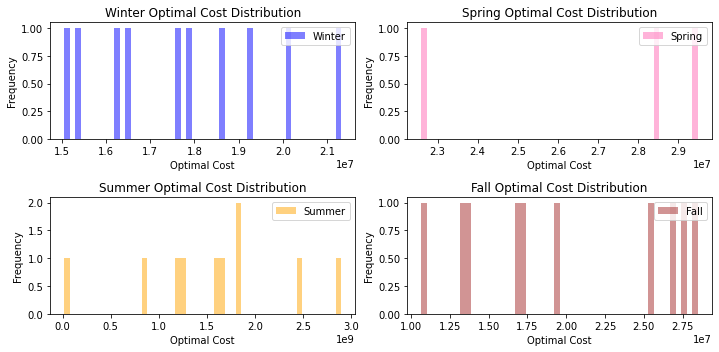

In [ ]:
# plot the results of each season individually in one 2x2 subplot of the figure and at the end the combined graph

fig, ax = plt.subplots(2, 2, figsize=(10, 5))

ax[0, 0].hist(winter_opti_simu_results, color='blue', bins=50, alpha=0.5, label='Winter')
ax[0, 1].hist(spring_opti_simu_results, color='hotpink', bins=50, alpha=0.5, label='Spring')
ax[1, 0].hist(summer_opti_simu_results, color='orange', bins=50, alpha=0.5, label='Summer')
ax[1, 1].hist(fall_opti_simu_results, color='brown', bins=50, alpha=0.5, label='Fall')

ax[0, 0].set_xlabel('Optimal Cost')
ax[0, 0].set_ylabel('Frequency')
ax[0, 0].set_title('Winter Optimal Cost Distribution')
ax[0, 0].legend(loc='upper right')

ax[0, 1].set_xlabel('Optimal Cost')
ax[0, 1].set_ylabel('Frequency')
ax[0, 1].set_title('Spring Optimal Cost Distribution')
ax[0, 1].legend(loc='upper right')

ax[1, 0].set_xlabel('Optimal Cost')
ax[1, 0].set_ylabel('Frequency')
ax[1, 0].set_title('Summer Optimal Cost Distribution')
ax[1, 0].legend(loc='upper right')

ax[1, 1].set_xlabel('Optimal Cost')
ax[1, 1].set_ylabel('Frequency')
ax[1, 1].set_title('Fall Optimal Cost Distribution')
ax[1, 1].legend(loc='upper right')

plt.tight_layout()
plt.show()



Deterministic Winter Optimal Cost: 1056930591.2036386
Simulated Winter Mean Optimal Cost: 17786841.486685045
Deterministic Spring Optimal Cost: 711939664.8878409
Simulated Spring Mean Optimal Cost: 26836885.057763387
Deterministic Summer Optimal Cost: 1064489375.3974495
Simulated Summer Mean Optimal Cost: 1561694195.196011
Deterministic Fall Optimal Cost: 739263936.1832299
Simulated Fall Mean Optimal Cost: 20016532.83072882


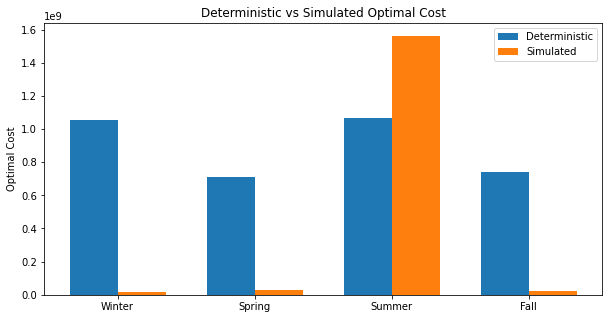

In [ ]:
# Getting the mean of the optimal cost for each season

winter_mean_opti_cost = sum(winter_opti_simu_results)/len(winter_opti_simu_results)
spring_mean_opti_cost = sum(spring_opti_simu_results)/len(spring_opti_simu_results)
summer_mean_opti_cost = sum(summer_opti_simu_results)/len(summer_opti_simu_results)
fall_mean_opti_cost = sum(fall_opti_simu_results)/len(fall_opti_simu_results)

# Comparing the mean of the optimal cost for each season with the optimal cost of the original problem for each season 

print(f"Deterministic Winter Optimal Cost: {optimization_1_results[0]}")
print(f"Simulated Winter Mean Optimal Cost: {winter_mean_opti_cost}")

print(f"Deterministic Spring Optimal Cost: {optimization_1_results[1]}")
print(f"Simulated Spring Mean Optimal Cost: {spring_mean_opti_cost}")

print(f"Deterministic Summer Optimal Cost: {optimization_1_results[2]}")
print(f"Simulated Summer Mean Optimal Cost: {summer_mean_opti_cost}")

print(f"Deterministic Fall Optimal Cost: {optimization_1_results[3]}")
print(f"Simulated Fall Mean Optimal Cost: {fall_mean_opti_cost}")

# Double side to side bar plot side to side comparing the optimization_1_results[0] with the mean of the optimal simulated cost for each season

fig, ax = plt.subplots(figsize=(10, 5))

x = np.arange(4)
width = 0.35

ax.bar(x - width/2, [optimization_1_results[0], optimization_1_results[1], optimization_1_results[2], optimization_1_results[3]], width, label='Deterministic')
ax.bar(x + width/2, [winter_mean_opti_cost, spring_mean_opti_cost, summer_mean_opti_cost, fall_mean_opti_cost], width, label='Simulated')

ax.set_ylabel('Optimal Cost')
ax.set_title('Deterministic vs Simulated Optimal Cost')
ax.set_xticks(x)
ax.set_xticklabels(['Winter', 'Spring', 'Summer', 'Fall'])
ax.legend()

plt.show()


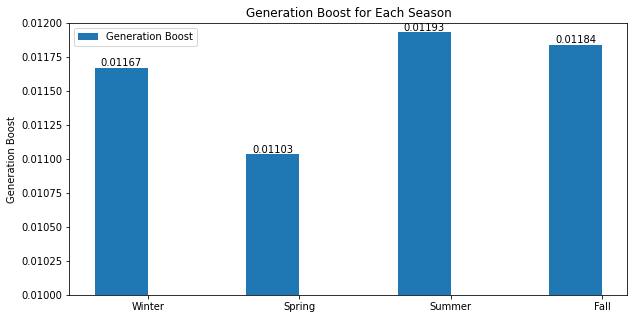

In [ ]:
# Plotting the generation boost for each season with colors corresponding to the seasons

fig, ax = plt.subplots(figsize=(10, 5))

x = np.arange(4)
width = 0.35

ax.bar(x - width/2, [winter_mean_gen_boost, spring_mean_gen_boost, summer_mean_gen_boost, fall_mean_gen_boost], width, label='Generation Boost')

# show the value for each bar in the bar
for i in range(4):
    ax.text(x[i] - width/2, [winter_mean_gen_boost, spring_mean_gen_boost, summer_mean_gen_boost, fall_mean_gen_boost][i], round([winter_mean_gen_boost, spring_mean_gen_boost, summer_mean_gen_boost, fall_mean_gen_boost][i], 5), ha='center', va='bottom')


ax.set_ylabel('Generation Boost')

# set y limit from 0.01 to 0.012
ax.set_ylim(0.01, 0.012)
ax.set_title('Generation Boost for Each Season')
ax.set_xticks(x)
ax.set_xticklabels(['Winter', 'Spring', 'Summer', 'Fall'])
ax.legend()

plt.show()

In [ ]:
for i in range(4):
    print(f"gen_boost_{i+1} = {gen_boosts[i]}")

gen_boost_1 = 1.018121222805982
gen_boost_2 = 1.0141078052137429
gen_boost_3 = 1.0153889788825077
gen_boost_4 = 1.0132067050161708


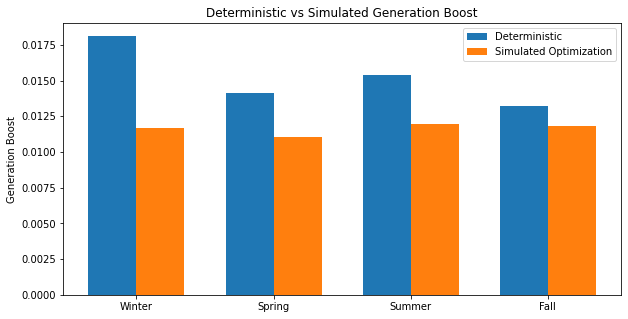

In [ ]:
# Double side to side bar plot side to side comparing the gen_boosts[0] with the mean of the gen boost for each season

fig, ax = plt.subplots(figsize=(10, 5))

x = np.arange(4)
width = 0.35

ax.bar(x - width/2, [gen_boosts[0]-1, gen_boosts[1]-1, gen_boosts[2]-1, gen_boosts[3]-1], width, label='Deterministic')
ax.bar(x + width/2, [winter_mean_gen_boost, spring_mean_gen_boost, summer_mean_gen_boost, fall_mean_gen_boost], width, label='Simulated Optimization')

ax.set_ylabel('Generation Boost')
ax.set_title('Deterministic vs Simulated Generation Boost')
ax.set_xticks(x)
ax.set_xticklabels(['Winter', 'Spring', 'Summer', 'Fall'])
ax.legend()

plt.show()


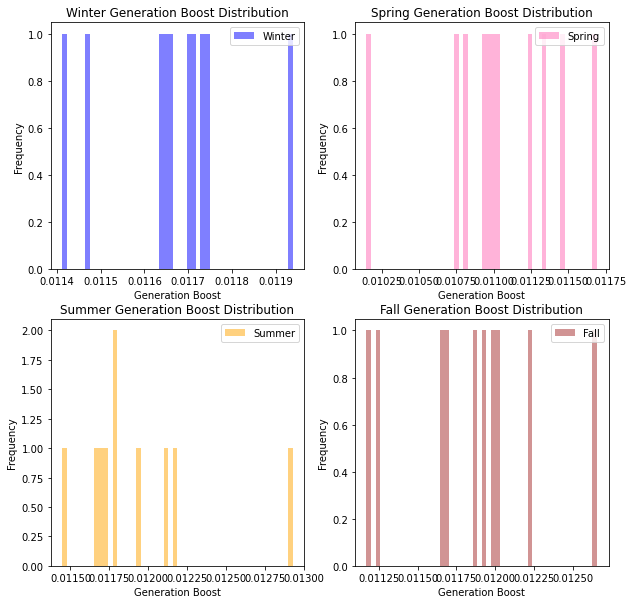

In [ ]:
# Plotting the generation boosts histogram for each season

fig, ax = plt.subplots(2, 2, figsize=(10, 10))

ax[0, 0].hist(winter_simu_gen_boosts, color='blue', bins=50, alpha=0.5, label='Winter')
ax[0, 1].hist(spring_simu_gen_boosts, color='hotpink', bins=50, alpha=0.5, label='Spring')
ax[1, 0].hist(summer_simu_gen_boosts, color='orange', bins=50, alpha=0.5, label='Summer')
ax[1, 1].hist(fall_simu_gen_boosts, color='brown', bins=50, alpha=0.5, label='Fall')

ax[0, 0].set_xlabel('Generation Boost')
ax[0, 0].set_ylabel('Frequency')
ax[0, 0].set_title('Winter Generation Boost Distribution')
ax[0, 0].legend(loc='upper right')

ax[0, 1].set_xlabel('Generation Boost')
ax[0, 1].set_ylabel('Frequency')
ax[0, 1].set_title('Spring Generation Boost Distribution')
ax[0, 1].legend(loc='upper right')

ax[1, 0].set_xlabel('Generation Boost')
ax[1, 0].set_ylabel('Frequency')
ax[1, 0].set_title('Summer Generation Boost Distribution')
ax[1, 0].legend(loc='upper right')

ax[1, 1].set_xlabel('Generation Boost')
ax[1, 1].set_ylabel('Frequency')
ax[1, 1].set_title('Fall Generation Boost Distribution')
ax[1, 1].legend(loc='upper right')

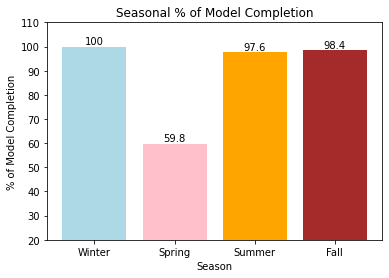

In [ ]:
model_completion = [100, 59.8, 97.6, 98.4]

# Bar plot of the model completion for each season with colors corresponding to the seasons and value on the bar

plt.bar(['Winter', 'Spring', 'Summer', 'Fall'], model_completion, color=['lightblue', 'pink', 'orange', 'brown'])
plt.title('Seasonal % of Model Completion')
plt.ylabel('% of Model Completion')
plt.xlabel('Season')
plt.ylim(20, 110)

# show the value for each bar in the bar
for i in range(4):
    plt.text(i, model_completion[i], model_completion[i], ha='center', va='bottom')

plt.show()
    

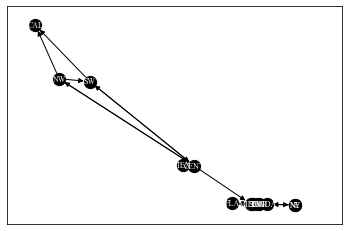

In [ ]:
draw_graph(spring_region_graph_22)

## Knock Downs

In [ ]:
def winter_knockout(index, num_iterations):
    winter_opti_knock_results = []
    winter_knock_gen_boosts = []

    confidence = 0.9

    for i in range(num_iterations):

        region_winter_nodes, region_spring_nodes, region_summer_nodes, region_fall_nodes = original_nodes()

        winter_demand_intervals = get_demand_interval(region_winter_nodes, confidence)

        winter_random_90CI_demands = get_random_demand(winter_demand_intervals) # Making it random

        change_node_demand(region_winter_nodes, winter_random_90CI_demands)

        # balance_demand_generation(region_winter_nodes)
        winter_region_graph_22 = create_region_graph(seasonal_winter_2022, region_winter_nodes, variance_winter2022)

        demand_df = pd.DataFrame(nx.get_node_attributes(winter_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

        generation_df = pd.DataFrame(nx.get_node_attributes(winter_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

        edge_variance = nx.get_edge_attributes(winter_region_graph_22, 'variance') 
        variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                                columns=['i', 'j', 'variance']).set_index(['i', 'j'])

        edge_cost = nx.get_edge_attributes(winter_region_graph_22, 'cost') 
        cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                                columns=['i', 'j', 'cost']).set_index(['i', 'j'])

        # NOT YET CAPACITY

        edge_cap = nx.get_edge_attributes(winter_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
        capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                                columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 

        c = cost_df.copy()
        v = variance_df.copy()
        d = demand_df.copy()
        g = generation_df.copy()
        cap = capacity_df.copy()

        cap['capacity'] = 220000000 # setting as the highest generation for now

        # Knocking Node 

        index = index
        ko_percentage = 1
        
        g['generation'][index] = ((1 - ko_percentage) *(g['generation'][index]))

        # Partitioning the demand 

        # d['demand'] = d['demand'] + d['demand'][index]/(len(d['demand']) - 1)

        # d['demand'][index] = 0

        # Generation Boost

        gen_boost = sum(d['demand'])/sum(g['generation'])
        winter_knock_gen_boosts.append(gen_boost)
        g['generation'] = (gen_boost) * g['generation']

        # Create model
        model = gp.Model()

        # Decision Variables
        x = gppd.add_vars(model, c, name='x')  

        model.update()

        # Objective function
        model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE) 

        # Constraints 
        cap_constraint = gppd.add_constrs( 
            model,
            x,
            GRB.LESS_EQUAL,
            cap['capacity'],
            name='cap_constraint'
        )

        non_negativity = gppd.add_constrs(
            model,
            x,
            GRB.GREATER_EQUAL,
            0,
            name='non_negativity'
        )

        # winter
        dem_constraint = gppd.add_constrs(
            model,
            g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
            GRB.EQUAL,
            # limit without generation relaxation: 0.8249
            d['demand'], # 0.1813 generation relaxation
            name='dem_constraint'
        )

        model.optimize()

        try:
            winter_opti_knock_results.append(model.objVal) # append the results to the list
        except AttributeError:
            pass

    return winter_opti_knock_results, winter_knock_gen_boosts

In [ ]:
def spring_knockout(index, num_iterations):
    
    spring_opti_knock_results = []
    spring_knock_gen_boosts = []

    confidence = 0.9

    for i in range(num_iterations):   

        region_winter_nodes, region_spring_nodes, region_summer_nodes, region_fall_nodes = original_nodes()

        spring_demand_intervals = get_demand_interval(region_spring_nodes, confidence)

        spring_random_90CI_demands = get_random_demand(spring_demand_intervals) # Making it random

        change_node_demand(region_spring_nodes, spring_random_90CI_demands)

        # balance_demand_generation(region_winter_nodes)
        spring_region_graph_22 = create_region_graph(seasonal_spring_2022, region_spring_nodes, variance_spring2022)

        demand_df = pd.DataFrame(nx.get_node_attributes(spring_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

        generation_df = pd.DataFrame(nx.get_node_attributes(spring_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

        edge_variance = nx.get_edge_attributes(spring_region_graph_22, 'variance') 
        variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                                columns=['i', 'j', 'variance']).set_index(['i', 'j'])

        edge_cost = nx.get_edge_attributes(spring_region_graph_22, 'cost') 
        cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                                columns=['i', 'j', 'cost']).set_index(['i', 'j'])

        # NOT YET CAPACITY

        edge_cap = nx.get_edge_attributes(spring_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
        capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                                columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 

        c = cost_df.copy()
        v = variance_df.copy()
        d = demand_df.copy()
        g = generation_df.copy()
        cap = capacity_df.copy()

        # With penalty for data formatting the model

        CAL_cost_row = pd.DataFrame({'cost': 9999}, index=pd.MultiIndex.from_tuples([('CAL', 'CAR')], names=['i', 'j']))
        c = pd.concat([CAL_cost_row, c])

        CAL_cap_row = pd.DataFrame({'capacity': 200000}, index=pd.MultiIndex.from_tuples([('CAL', 'CAR')], names=['i', 'j']))
        cap = pd.concat([CAL_cap_row, cap])

        cap['capacity'] = 220000000 # setting as the highest generation for now

        # Knocking Node 

        index = index
        ko_percentage = 1

        g['generation'][index] = ((1 - ko_percentage) *(g['generation'][index]))

        gen_boost = sum(d['demand'])/sum(g['generation'])
        spring_knock_gen_boosts.append(gen_boost)
        g['generation'] = (gen_boost) * g['generation']

        # Create model
        model = gp.Model()

        # Decision Variables
        x = gppd.add_vars(model, c, name='x')  

        model.update()

        # Objective function
        model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE) 

        # Constraints 
        cap_constraint = gppd.add_constrs( 
            model,
            x,
            GRB.LESS_EQUAL,
            cap['capacity'],
            name='cap_constraint'
        )

        non_negativity = gppd.add_constrs(
            model,
            x,
            GRB.GREATER_EQUAL,
            0,
            name='non_negativity'
        )

        # spring
        dem_constraint = gppd.add_constrs(
            model,
            g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
            GRB.EQUAL,
            # limit without generation relaxation: 0.8249
            d['demand'], # 0.1813 generation relaxation
            name='dem_constraint'
        )

        model.optimize()

        try:
            spring_opti_knock_results.append(model.objVal) # append the results to the list
        except AttributeError:
            pass

    return spring_opti_knock_results, spring_knock_gen_boosts

In [ ]:
def summer_knockout(index, num_iterations):
    
    summer_opti_knock_results = []
    summer_knock_gen_boosts = []

    confidence = 0.9

    for i in range(num_iterations):          

        region_winter_nodes, region_spring_nodes, region_summer_nodes, region_summer_nodes = original_nodes()

        summer_demand_intervals = get_demand_interval(region_summer_nodes, confidence)
        
        summer_random_90CI_demands = get_random_demand(summer_demand_intervals) # Making it random

        change_node_demand(region_summer_nodes, summer_random_90CI_demands) 

        # balance_demand_generation(region_winter_nodes)
        summer_region_graph_22 = create_region_graph(seasonal_summer_2022, region_summer_nodes, variance_summer2022)

        demand_df = pd.DataFrame(nx.get_node_attributes(summer_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

        generation_df = pd.DataFrame(nx.get_node_attributes(summer_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])

        edge_variance = nx.get_edge_attributes(summer_region_graph_22, 'variance')
        variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                                columns=['i', 'j', 'variance']).set_index(['i', 'j'])

        edge_cost = nx.get_edge_attributes(summer_region_graph_22, 'cost')
        cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                                columns=['i', 'j', 'cost']).set_index(['i', 'j'])

        # NOT YET CAPACITY

        edge_cap = nx.get_edge_attributes(summer_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
        capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                                columns=['i', 'j', 'capacity']).set_index(['i', 'j']) 

        c = cost_df.copy()
        v = variance_df.copy()
        d = demand_df.copy()
        g = generation_df.copy()
        cap = capacity_df.copy()

        # With penalty for data formatting the model

        FLA_cost_row = pd.DataFrame({'cost': 9999}, index=pd.MultiIndex.from_tuples([('FLA', 'CAR')], names=['i', 'j']))
        c = pd.concat([FLA_cost_row, c])

        FLA_cap_row = pd.DataFrame({'capacity': 1}, index=pd.MultiIndex.from_tuples([('FLA', 'CAR')], names=['i', 'j']))
        cap = pd.concat([FLA_cap_row, cap])

        TEX_cost_row = pd.DataFrame({'cost': 9999}, index=pd.MultiIndex.from_tuples([('TEX', 'CAR')], names=['i', 'j']))
        c = pd.concat([TEX_cost_row, c])

        TEX_cap_row = pd.DataFrame({'capacity': 1}, index=pd.MultiIndex.from_tuples([('TEX', 'CAR')], names=['i', 'j']))
        cap = pd.concat([TEX_cap_row, cap])

        cap['capacity'] = 220000000 # setting as the highest generation for now

        # Knockout
        index = index
        ko_percentage = 1

        g['generation'][index] = ((1 - ko_percentage) *(g['generation'][index]))

        gen_boost = sum(d['demand'])/sum(g['generation'])
        summer_knock_gen_boosts.append(gen_boost)
        g['generation'] = (gen_boost) * g['generation']

        # Create model
        model = gp.Model()

        # Decision Variables
        x = gppd.add_vars(model, c, name='x')  

        model.update()
        
        # Objective function
        model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE) 
    
        # Constraints 
        cap_constraint = gppd.add_constrs( 
            model,
            x,
            GRB.LESS_EQUAL,
            cap['capacity'],
            name='cap_constraint'
        )

        non_negativity = gppd.add_constrs(
            model,
            x,
            GRB.GREATER_EQUAL,
            0,
            name='non_negativity'
        )

        # summer
        dem_constraint = gppd.add_constrs(
            model,
            g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
            GRB.EQUAL,
            # limit without generation relaxation: 0.8249
            d['demand'], # 0.1813 generation relaxation
            name='dem_constraint'
        )

        model.optimize()
            
        try:
            summer_opti_knock_results.append(model.objVal) # append the results to the list
        except AttributeError:
            pass

    return summer_opti_knock_results, summer_knock_gen_boosts

In [ ]:
def fall_knockout(index, num_iterations):
    
    fall_opti_knock_results = []
    fall_knock_gen_boosts = []

    confidence = 0.9

    for i in range(num_iterations):     
        region_winter_nodes, region_spring_nodes, region_summer_nodes, region_fall_nodes = original_nodes()

        fall_demand_intervals = get_demand_interval(region_fall_nodes, 0.9)
        
        fall_random_90CI_demands = get_random_demand(fall_demand_intervals) # Making it random

        change_node_demand(region_fall_nodes, fall_random_90CI_demands)

        # balance_demand_generation(region_winter_nodes)
        fall_region_graph_22 = create_region_graph(seasonal_fall_2022, region_fall_nodes, variance_fall2022)

        demand_df = pd.DataFrame(nx.get_node_attributes(fall_region_graph_22, 'demand').items(), columns=['i', 'demand']).set_index(['i'])

        generation_df = pd.DataFrame(nx.get_node_attributes(fall_region_graph_22, 'generation').items(), columns=['i', 'generation']).set_index(['i'])
        
        edge_variance = nx.get_edge_attributes(fall_region_graph_22, 'variance')
        variance_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_variance.items()],
                                columns=['i', 'j', 'variance']).set_index(['i', 'j'])

        edge_cost = nx.get_edge_attributes(fall_region_graph_22, 'cost')
        cost_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cost.items()],
                                columns=['i', 'j', 'cost']).set_index(['i', 'j'])

        # NOT YET CAPACITY

        edge_cap = nx.get_edge_attributes(fall_region_graph_22, 'variance') # change this to constraint we want to define for edge capacity
        capacity_df = pd.DataFrame([(edge[0], edge[1], attr) for edge, attr in edge_cap.items()],
                                columns=['i', 'j', 'capacity']).set_index(['i', 'j'])
        
        c = cost_df.copy()
        v = variance_df.copy()
        d = demand_df.copy()
        g = generation_df.copy()
        cap = capacity_df.copy()

        cap['capacity'] = 220000000 # setting as the highest generation for now

        # Knocking Node 

        index = index
        ko_percentage = 1

        g['generation'][index] = ((1 - ko_percentage) * (g['generation'][index]))

        gen_boost = sum(d['demand'])/sum(g['generation'])
        fall_knock_gen_boosts.append(gen_boost)
        g['generation'] = (gen_boost) * g['generation']
        
        # Create model
        model = gp.Model()

        # Decision Variables
        x = gppd.add_vars(model, c, name='x')

        model.update()

        # Objective function
        model.setObjective((x * c['cost']).sum(), sense=GRB.MINIMIZE)

        # Constraints
        cap_constraint = gppd.add_constrs(
            model,
            x,
            GRB.LESS_EQUAL,
            cap['capacity'],
            name='cap_constraint' 
        )

        non_negativity = gppd.add_constrs(
            model,
            x,
            GRB.GREATER_EQUAL,  
            0,
            name='non_negativity'
        )

        # fall 
        dem_constraint = gppd.add_constrs(
            model,
            g['generation'] + x.groupby('j').sum() - x.groupby('i').sum(),
            GRB.EQUAL,
            # limit without generation relaxation: 0.8249
            d['demand'], # 0.1813 generation relaxation
            name='dem_constraint'
        )

        model.optimize()

        try:
            fall_opti_knock_results.append(model.objVal) # append the results to the list
        except AttributeError:
            pass
        
    return fall_opti_knock_results, fall_knock_gen_boosts

In [ ]:
num_iterations = 15

winter_knock_CAL_results, winter_knock_CAL_gen_boosts   = winter_knockout(0,num_iterations)
winter_knock_CAR_results, winter_knock_CAR_gen_boosts   = winter_knockout(1,num_iterations)
winter_knock_CENT_results, winter_knock_CENT_gen_boosts = winter_knockout(2,num_iterations)
winter_knock_FLA_results, winter_knock_FLA_gen_boosts   = winter_knockout(3,num_iterations)
winter_knock_MIDA_results, winter_knock_MIDA_gen_boosts = winter_knockout(4,num_iterations)
winter_knock_MIDW_results, winter_knock_MIDW_gen_boosts = winter_knockout(5,num_iterations)
winter_knock_NE_results, winter_knock_NE_gen_boosts     = winter_knockout(6,num_iterations)
winter_knock_NW_results, winter_knock_NW_gen_boosts     = winter_knockout(7,num_iterations)
winter_knock_NY_results, winter_knock_NY_gen_boosts     = winter_knockout(8,num_iterations)
winter_knock_SE_results, winter_knock_SE_gen_boosts     = winter_knockout(9,num_iterations)
winter_knock_SW_results, winter_knock_SW_gen_boosts     = winter_knockout(10,num_iterations)
winter_knock_TEN_results, winter_knock_TEN_gen_boosts   = winter_knockout(11,num_iterations)
winter_knock_TEX_results, winter_knock_TEX_gen_boosts   = winter_knockout(12,num_iterations)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 columns and 124 nonzeros
Model fingerprint: 0xaed49ec8
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 3e+01]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e+04, 2e+08]
Presolve removed 67 rows and 7 columns
Presolve time: 0.00s
Presolved: 8 rows, 24 columns, 41 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    4.6229957e+06   1.812684e+05   0.000000e+00      0s
      11    5.5894708e+07   0.000000e+00   0.000000e+00      0s

Solved in 11 iterations and 0.01 seconds (0.00 work units)
Optimal objective  5.589470844e+07
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 column

In [ ]:
num_iterations = 15

spring_knock_CAL_results, spring_knock_CAL_gen_boosts   = spring_knockout(0,num_iterations)
spring_knock_CAR_results, spring_knock_CAR_gen_boosts   = spring_knockout(1,num_iterations)
spring_knock_CENT_results, spring_knock_CENT_gen_boosts = spring_knockout(2,num_iterations)
spring_knock_FLA_results, spring_knock_FLA_gen_boosts   = spring_knockout(3,num_iterations)
spring_knock_MIDA_results, spring_knock_MIDA_gen_boosts = spring_knockout(4,num_iterations)
spring_knock_MIDW_results, spring_knock_MIDW_gen_boosts = spring_knockout(5,num_iterations)
spring_knock_NE_results, spring_knock_NE_gen_boosts     = spring_knockout(6,num_iterations)
spring_knock_NW_results, spring_knock_NW_gen_boosts     = spring_knockout(7,num_iterations)
spring_knock_NY_results, spring_knock_NY_gen_boosts     = spring_knockout(8,num_iterations)
spring_knock_SE_results, spring_knock_SE_gen_boosts     = spring_knockout(9,num_iterations)
spring_knock_SW_results, spring_knock_SW_gen_boosts     = spring_knockout(10,num_iterations)
spring_knock_TEN_results, spring_knock_TEN_gen_boosts   = spring_knockout(11,num_iterations)
spring_knock_TEX_results, spring_knock_TEX_gen_boosts   = spring_knockout(12,num_iterations)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 73 rows, 30 columns and 120 nonzeros
Model fingerprint: 0x9323b7dd
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 1e+04]
  Bounds range     [0e+00, 0e+00]
  RHS range        [2e+03, 2e+08]
Presolve removed 65 rows and 8 columns
Presolve time: 0.00s
Presolved: 8 rows, 22 columns, 40 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.1592170e+07   1.726728e+05   0.000000e+00      0s

Solved in 9 iterations and 0.00 seconds (0.00 work units)
Infeasible model
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 73 rows, 30 columns and 120 nonzeros
Model fingerprint: 0xdb61a2b2
Coefficient statistics:
  Matrix r

In [ ]:
num_iterations = 15

summer_knock_CAL_results, summer_knock_CAL_gen_boosts   = summer_knockout(0,num_iterations)
summer_knock_CAR_results, summer_knock_CAR_gen_boosts   = summer_knockout(1,num_iterations)
summer_knock_CENT_results, summer_knock_CENT_gen_boosts = summer_knockout(2,num_iterations)
summer_knock_FLA_results, summer_knock_FLA_gen_boosts   = summer_knockout(3,num_iterations)
summer_knock_MIDA_results, summer_knock_MIDA_gen_boosts = summer_knockout(4,num_iterations)
summer_knock_MIDW_results, summer_knock_MIDW_gen_boosts = summer_knockout(5,num_iterations)
summer_knock_NE_results, summer_knock_NE_gen_boosts     = summer_knockout(6,num_iterations)
summer_knock_NW_results, summer_knock_NW_gen_boosts     = summer_knockout(7,num_iterations)
summer_knock_NY_results, summer_knock_NY_gen_boosts     = summer_knockout(8,num_iterations)
summer_knock_SE_results, summer_knock_SE_gen_boosts     = summer_knockout(9,num_iterations)
summer_knock_SW_results, summer_knock_SW_gen_boosts     = summer_knockout(10,num_iterations)
summer_knock_TEN_results, summer_knock_TEN_gen_boosts   = summer_knockout(11,num_iterations)
summer_knock_TEX_results, summer_knock_TEX_gen_boosts   = summer_knockout(12,num_iterations)


Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 columns and 124 nonzeros
Model fingerprint: 0x5dcb0c59
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]


  Objective range  [8e+00, 1e+04]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+03, 2e+08]
Presolve removed 62 rows and 1 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds (0.00 work units)
Infeasible model
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 columns and 124 nonzeros
Model fingerprint: 0xec60f452
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 1e+04]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e+04, 2e+08]
Presolve removed 62 rows and 1 columns
Presolve time: 0.00s

Solved in 0 iterations and 0.00 seconds (0.00 work units)
Infeasible model
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 columns and 124 nonzero

In [ ]:
num_iterations = 15

fall_knock_CAL_results, fall_knock_CAL_gen_boosts   = fall_knockout(0,num_iterations)
fall_knock_CAR_results, fall_knock_CAR_gen_boosts   = fall_knockout(1,num_iterations)
fall_knock_CENT_results, fall_knock_CENT_gen_boosts = fall_knockout(2,num_iterations)
fall_knock_FLA_results, fall_knock_FLA_gen_boosts   = fall_knockout(3,num_iterations)
fall_knock_MIDA_results, fall_knock_MIDA_gen_boosts = fall_knockout(4,num_iterations)
fall_knock_MIDW_results, fall_knock_MIDW_gen_boosts = fall_knockout(5,num_iterations)
fall_knock_NE_results, fall_knock_NE_gen_boosts     = fall_knockout(6,num_iterations)
fall_knock_NW_results, fall_knock_NW_gen_boosts     = fall_knockout(7,num_iterations)
fall_knock_NY_results, fall_knock_NY_gen_boosts     = fall_knockout(8,num_iterations)
fall_knock_SE_results, fall_knock_SE_gen_boosts     = fall_knockout(9,num_iterations)
fall_knock_SW_results, fall_knock_SW_gen_boosts     = fall_knockout(10,num_iterations)
fall_knock_TEN_results, fall_knock_TEN_gen_boosts   = fall_knockout(11,num_iterations)
fall_knock_TEX_results, fall_knock_TEX_gen_boosts   = fall_knockout(12,num_iterations)

Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 columns and 124 nonzeros
Model fingerprint: 0x0c1d8264
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [8e+00, 3e+01]
  Bounds range     [0e+00, 0e+00]
  RHS range        [9e+03, 2e+08]
Presolve removed 67 rows and 7 columns
Presolve time: 0.00s
Presolved: 8 rows, 24 columns, 41 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    2.5615854e+06   2.358458e+05   0.000000e+00      0s
      11    7.6381946e+07   0.000000e+00   0.000000e+00      0s

Solved in 11 iterations and 0.00 seconds (0.00 work units)
Optimal objective  7.638194604e+07
Gurobi Optimizer version 10.0.1 build v10.0.1rc0 (mac64[arm])

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 75 rows, 31 column

In [ ]:
winter_2022_benchmark_cost = seasonal_winter_2022 * flow_cost
spring_2022_benchmark_cost = seasonal_spring_2022 * flow_cost
summer_2022_benchmark_cost = seasonal_summer_2022 * flow_cost
fall_2022_benchmark_cost = seasonal_fall_2022 * flow_cost

winter_2022_benchmark_cost = winter_2022_benchmark_cost.sum().sum()
spring_2022_benchmark_cost = spring_2022_benchmark_cost.sum().sum()
summer_2022_benchmark_cost = summer_2022_benchmark_cost.sum().sum()
fall_2022_benchmark_cost = fall_2022_benchmark_cost.sum().sum()

winter_benchmark = winter_2022_benchmark_cost
winter_optimization = optimization_1_results[0]

spring_benchmark = spring_2022_benchmark_cost
spring_optimization = optimization_1_results[1]

summer_benchmark = summer_2022_benchmark_cost
summer_optimization = optimization_1_results[2]

fall_benchmark = fall_2022_benchmark_cost
fall_optimization = optimization_1_results[3]

In [ ]:
def list_average(list):
    try:
        return sum(list) / len(list)
    except: 
        return 0
    
def percentage_change(old, new):
    try:
        if new == 0:
            return 10000
        else:
            return (new - old) / old * 100.0
    except:
        return 0

print(f"Winter simulation: {list_average(winter_opti_simu_results):.4f}")
print(f"Winter knocking California: {list_average(winter_knock_CAL_results):.4f}")
print(f"Simulation -> Knocking Percentage change: {percentage_change(list_average(winter_opti_simu_results), list_average(winter_knock_CAL_results)):.2f} %")

print(f"\nSpring simulation: {list_average(spring_opti_simu_results):.4f}")
print(f"Spring knocking California: {list_average(spring_knock_CAL_results):.4f}")
print(f"Percentage change: {percentage_change(list_average(spring_opti_simu_results), list_average(spring_knock_CAL_results)):.2f} %")

print(f"\nSummer simulation: {list_average(summer_opti_simu_results):.4f}")
print(f"Summer knocking Florida: {list_average(summer_knock_FLA_results):.4f}")
print(f"Percentage change: {percentage_change(list_average(summer_opti_simu_results), list_average(summer_knock_CAL_results)):.2f} %")

print(f"\nFall simulation: {list_average(fall_opti_simu_results):.4f}")
print(f"Fall knocking California: {list_average(fall_knock_CAL_results):.4f}")
print(f"Percentage change: {percentage_change(list_average(fall_opti_simu_results), list_average(fall_knock_CAL_results)):.2f} %")

Winter simulation: 17786841.4867
Winter knocking California: 51632657.6930
Simulation -> Knocking Percentage change: 190.29 %

Spring simulation: 26836885.0578
Spring knocking California: 47106064.7267
Percentage change: 75.53 %

Summer simulation: 1561694195.1960
Summer knocking Florida: 1041413048.0398
Percentage change: 51.27 %

Fall simulation: 20016532.8307
Fall knocking California: 63639139.9390
Percentage change: 217.93 %


In [ ]:
winter_knock_results = [winter_knock_CAL_results, winter_knock_CAR_results, winter_knock_CENT_results, 
                        winter_knock_FLA_results, winter_knock_MIDA_results, winter_knock_MIDW_results, 
                        winter_knock_NE_results, winter_knock_NW_results, winter_knock_NY_results, 
                        winter_knock_SE_results, winter_knock_SW_results, winter_knock_TEN_results, winter_knock_TEX_results]

spring_knock_results = [spring_knock_CAL_results, spring_knock_CAR_results, spring_knock_CENT_results,
                        spring_knock_FLA_results, spring_knock_MIDA_results, spring_knock_MIDW_results,
                        spring_knock_NE_results, spring_knock_NW_results, spring_knock_NY_results,
                        spring_knock_SE_results, spring_knock_SW_results, spring_knock_TEN_results, spring_knock_TEX_results]

summer_knock_results = [summer_knock_CAL_results, summer_knock_CAR_results, summer_knock_CENT_results,
                        summer_knock_FLA_results, summer_knock_MIDA_results, summer_knock_MIDW_results,
                        summer_knock_NE_results, summer_knock_NW_results, summer_knock_NY_results,
                        summer_knock_SE_results, summer_knock_SW_results, summer_knock_TEN_results, summer_knock_TEX_results]

fall_knock_results = [fall_knock_CAL_results, fall_knock_CAR_results, fall_knock_CENT_results,
                        fall_knock_FLA_results, fall_knock_MIDA_results, fall_knock_MIDW_results,
                        fall_knock_NE_results, fall_knock_NW_results, fall_knock_NY_results,
                        fall_knock_SE_results, fall_knock_SW_results, fall_knock_TEN_results, fall_knock_TEX_results]

winter_knock_percentages = []
spring_knock_percentages = []
summer_knock_percentages = []
fall_knock_percentages = []

for i in range(len(winter_knock_results)):
    winter_knock_percentages.append(percentage_change(list_average(winter_opti_simu_results), list_average(winter_knock_results[i])))
    spring_knock_percentages.append(percentage_change(list_average(spring_opti_simu_results), list_average(spring_knock_results[i])))
    summer_knock_percentages.append(percentage_change(list_average(summer_opti_simu_results), list_average(summer_knock_results[i])))
    fall_knock_percentages.append(percentage_change(list_average(fall_opti_simu_results), list_average(fall_knock_results[i])))

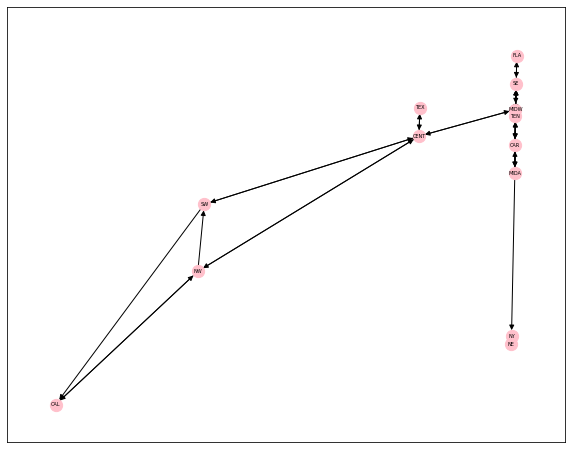

In [ ]:
plt.figure(figsize=(10, 8))  
pos = nx.spring_layout(spring_region_graph_22, seed=43) 
nx.draw_networkx(winter_region_graph_22, pos=pos, with_labels=True, node_size=150, font_size=5, node_color='pink')

plt.show()

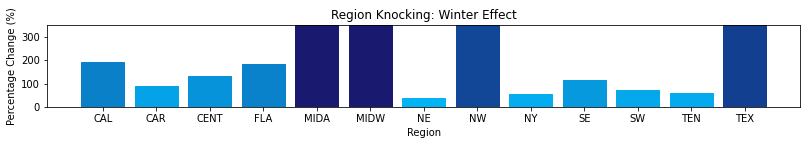

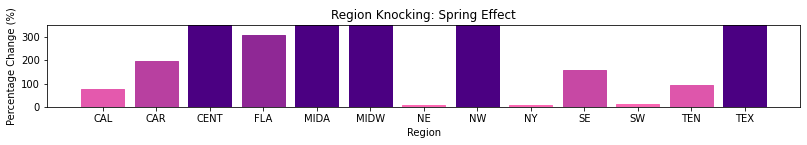

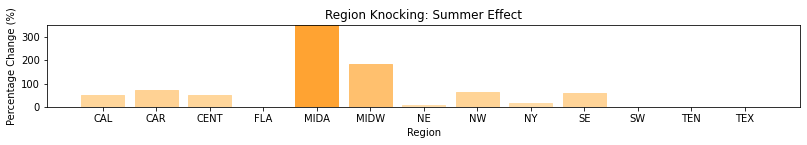

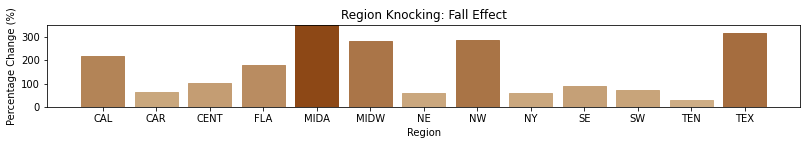

In [ ]:
import matplotlib.colors as mcolors

color_map = mcolors.LinearSegmentedColormap.from_list("", ["deepskyblue", "midnightblue"])

plt.figure(figsize=(13.5, 1.5))
bars = plt.bar(IDs, winter_knock_percentages)

for i in range(len(bars)):
    bars[i].set_color(color_map(winter_knock_percentages[i]/500))

plt.title("Region Knocking: Winter Effect")
plt.xlabel("Region")
plt.ylabel("Percentage Change (%)")
plt.ylim(0, 350)
plt.show()

color_map = mcolors.LinearSegmentedColormap.from_list("", ["hotpink", "indigo"])

plt.figure(figsize=(13.5, 1.5))
bars = plt.bar(IDs, spring_knock_percentages)

for i in range(len(bars)):

    bars[i].set_color(color_map(spring_knock_percentages[i]/500))
plt.title("Region Knocking: Spring Effect")
plt.xlabel("Region")
plt.ylabel("Percentage Change (%)")
plt.ylim(0, 350)
plt.show()

color_map = mcolors.LinearSegmentedColormap.from_list("", ["navajowhite", "darkorange"])

plt.figure(figsize=(13.5, 1.5))
bars = plt.bar(IDs, summer_knock_percentages)

for i in range(len(bars)):
    bars[i].set_color(color_map(summer_knock_percentages[i]/500))
plt.title("Region Knocking: Summer Effect")
plt.xlabel("Region")
plt.ylabel("Percentage Change (%)")
plt.ylim(0, 350)

plt.show()

color_map = mcolors.LinearSegmentedColormap.from_list("", ["tan", "saddlebrown"])

plt.figure(figsize=(13.5, 1.5))
bars = plt.bar(IDs, fall_knock_percentages)

for i in range(len(bars)):
    bars[i].set_color(color_map(fall_knock_percentages[i]/500))
plt.title("Region Knocking: Fall Effect")
plt.xlabel("Region")
plt.ylabel("Percentage Change (%)")
plt.ylim(0, 350)

plt.show()

In [ ]:
# Focused attacks on networks

# 

In [ ]:
# multiply seasonal_x_2022 and flow_cost for getting total cost

winter_2022_benchmark_cost = seasonal_winter_2022 * flow_cost
spring_2022_benchmark_cost = seasonal_spring_2022 * flow_cost
summer_2022_benchmark_cost = seasonal_summer_2022 * flow_cost
fall_2022_benchmark_cost = seasonal_fall_2022 * flow_cost

winter_2022_benchmark_cost = winter_2022_benchmark_cost.sum().sum()
spring_2022_benchmark_cost = spring_2022_benchmark_cost.sum().sum()
summer_2022_benchmark_cost = summer_2022_benchmark_cost.sum().sum()
fall_2022_benchmark_cost = fall_2022_benchmark_cost.sum().sum()

In [ ]:
winter_simulation_results = (sum(winter_opti_simu_results) / len(winter_opti_simu_results))
spring_simulation_results = (sum(spring_opti_simu_results) / len(spring_opti_simu_results))
summer_simulation_results = (sum(summer_opti_simu_results) / len(summer_opti_simu_results))
fall_simulation_results = (sum(fall_opti_simu_results) / len(fall_opti_simu_results))

print(f"Winter Benchmark: {winter_2022_benchmark_cost}")
print(f"Winter Optimization: {optimization_1_results[0]}")
print(f"Winter Simulation: {winter_simulation_results}")

print(f"\nSpring Benchmark: {spring_2022_benchmark_cost}")
print(f"Spring Optimization: {optimization_1_results[1]}")
print(f"Spring Simulation: {spring_simulation_results}")

print(f"\nSummer Benchmark: {summer_2022_benchmark_cost}")
print(f"Summer Optimization: {optimization_1_results[2]}")
print(f"Summer Simulation: {summer_simulation_results}")

print(f"\nFall Benchmark: {fall_2022_benchmark_cost}")
print(f"Fall Optimization: {optimization_1_results[3]}")
print(f"Fall Simulation: {fall_simulation_results}")

Winter Benchmark: 1145962173.5923629
Winter Optimization: 1056930591.2036386
Winter Simulation: 17786841.486685045

Spring Benchmark: 995251431.109999
Spring Optimization: 711939664.8878409
Spring Simulation: 26836885.057763387

Summer Benchmark: 1182639576.5074584
Summer Optimization: 1064489375.3974495
Summer Simulation: 1561694195.196011

Fall Benchmark: 951378089.4349576
Fall Optimization: 739263936.1832299
Fall Simulation: 20016532.83072882


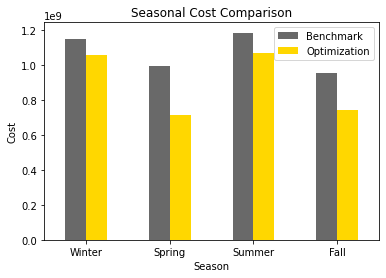

In [ ]:
winter_benchmark = winter_2022_benchmark_cost
winter_optimization = optimization_1_results[0]

spring_benchmark = spring_2022_benchmark_cost
spring_optimization = optimization_1_results[1]

summer_benchmark = summer_2022_benchmark_cost
summer_optimization = optimization_1_results[2]

fall_benchmark = fall_2022_benchmark_cost
fall_optimization = optimization_1_results[3]

# Create a Pandas DataFrame
data = {'Benchmark': [winter_benchmark, spring_benchmark, summer_benchmark, fall_benchmark],
        'Optimization': [winter_optimization, spring_optimization, summer_optimization, fall_optimization]}
df = pd.DataFrame(data, index=['Winter', 'Spring', 'Summer', 'Fall'])

# Create the bar plot with specified colors
ax = df.plot(kind='bar', rot=0, color=['dimgrey', 'gold'])

# Set the title and axis labels
ax.set_title('Seasonal Cost Comparison')
ax.set_xlabel('Season')
ax.set_ylabel('Cost')

# Show the plot
plt.show()


In [ ]:
total_benchmark = winter_benchmark + spring_benchmark + summer_benchmark + fall_benchmark
total_optimal = winter_optimization + spring_optimization + summer_optimization + fall_optimization

In [ ]:
improvement = total_benchmark - total_optimal 

print(f"Improvement: {improvement:.2f}")

Improvement: 702607702.97


In [ ]:
print(f"Winter improvement: {winter_benchmark - winter_optimization}")
print(f"Spring improvement: {spring_benchmark - spring_optimization}")
print(f"Summer improvement: {summer_benchmark - summer_optimization}")
print(f"Fall improvement: {fall_benchmark - fall_optimization}")

Winter improvement: 89031582.38872433
Spring improvement: 283311766.2221581
Summer improvement: 118150201.11000896
Fall improvement: 212114153.2517277


Total Benchmark: 4275231270.64
Total Optimal: 3572623567.67


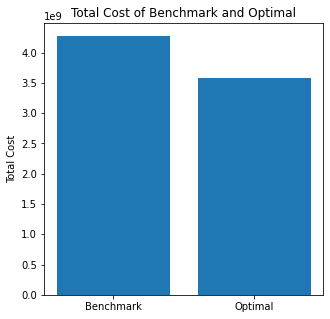

In [ ]:
plt.figure(figsize=(5, 5))
plt.bar(["Benchmark", "Optimal"], [total_benchmark, total_optimal])
plt.title("Total Cost of Benchmark and Optimal")
plt.ylabel("Total Cost")
plt.show()

In [ ]:
plt.figure(figsize=(5, 5))
plt.bar(["Benchmark", "Optimal"], [total_benchmark, total_optimal])
plt.title("Total Cost of Benchmark and Optimal")
plt.ylabel("Total Cost")
plt.show()